<center>
<a href="http://www.insa-toulouse.fr/" ><img src="http://www.math.univ-toulouse.fr/~besse/Wikistat/Images/logo-insa.jpg" style="float:left; max-width: 120px; display: inline" alt="INSA"/></a>

</center>


#  Adaptation Statistique d'un Modèle de Prévision du Pic d'Ozone avec <a href="https://cran.r-project.org/"><img src="https://cran.r-project.org/Rlogo.svg" style="max-width: 40px; display: inline" alt="R"/></a>


In [1]:
library(ggplot2)
library(tidyverse)
library(gridExtra)
library(GGally)
library(plotly)
library(corrplot)
library(reshape2)
library(FactoMineR)
library(factoextra)
library(glmnet)
library(ggfortify)
library(pROC)
library(ROCR)
library(naniar)
library(scales)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.0     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ lubridate 1.9.3     ✔ tibble    3.2.1
✔ purrr     1.0.1     ✔ tidyr     1.3.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attachement du package : ‘gridExtra’


L'objet suivant est masqué depuis ‘package:dplyr’:

    combine


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


Attachement du package : ‘plotly’


L'objet suivant est masqué depuis ‘package:ggplot2’:

    last_plot


L'objet suivant est masqué depuis ‘package:stats’:

    filter


L'objet suivant est masqué depuis ‘package:graphics’:

    layout


corrplot 0.92 loaded


Attachement du package : ‘reshape2’


L'objet sui

# 1 - Exploratory Data Analysis

### 1.1 - Loading Data

In [2]:
#path <- "https://www.kaggle.com/datasets/anshtanwar/"
dataf <- read.table(paste("global-data-on-sustainable-energy.csv", sep = ""),
                    sep = ",", header = TRUE)
# First rows of the dataset
head(dataf)
summary(dataf)

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.electricity.generating.capacity.per.capita,Financial.flows.to.developing.countries..US...,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,⋯,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,Renewables....equivalent.primary.energy.,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


    Entity               Year      Access.to.electricity....of.population.
 Length:3649        Min.   :2000   Min.   :  1.252                        
 Class :character   1st Qu.:2005   1st Qu.: 59.801                        
 Mode  :character   Median :2010   Median : 98.362                        
                    Mean   :2010   Mean   : 78.934                        
                    3rd Qu.:2015   3rd Qu.:100.000                        
                    Max.   :2020   Max.   :100.000                        
                                   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

### 1.2 - Data preparation

In [3]:
# Changing variables types

dataf$Year<-as.factor(dataf$Year)
dataf$Entity<-as.factor(dataf$Entity)
dataf$Density.n.P.Km2.<-as.numeric(gsub(",","",dataf$Density.n.P.Km2.))
types <- sapply(dataf, class)
print(types)

                                                          Entity 
                                                        "factor" 
                                                            Year 
                                                        "factor" 
                         Access.to.electricity....of.population. 
                                                       "numeric" 
                               Access.to.clean.fuels.for.cooking 
                                                       "numeric" 
            Renewable.electricity.generating.capacity.per.capita 
                                                       "numeric" 
                  Financial.flows.to.developing.countries..US... 
                                                       "numeric" 
Renewable.energy.share.in.the.total.final.energy.consumption.... 
                                                       "numeric" 
                             Electricity.from.fossil.fuels..TWh. 
          

### 1.3 - Missing data

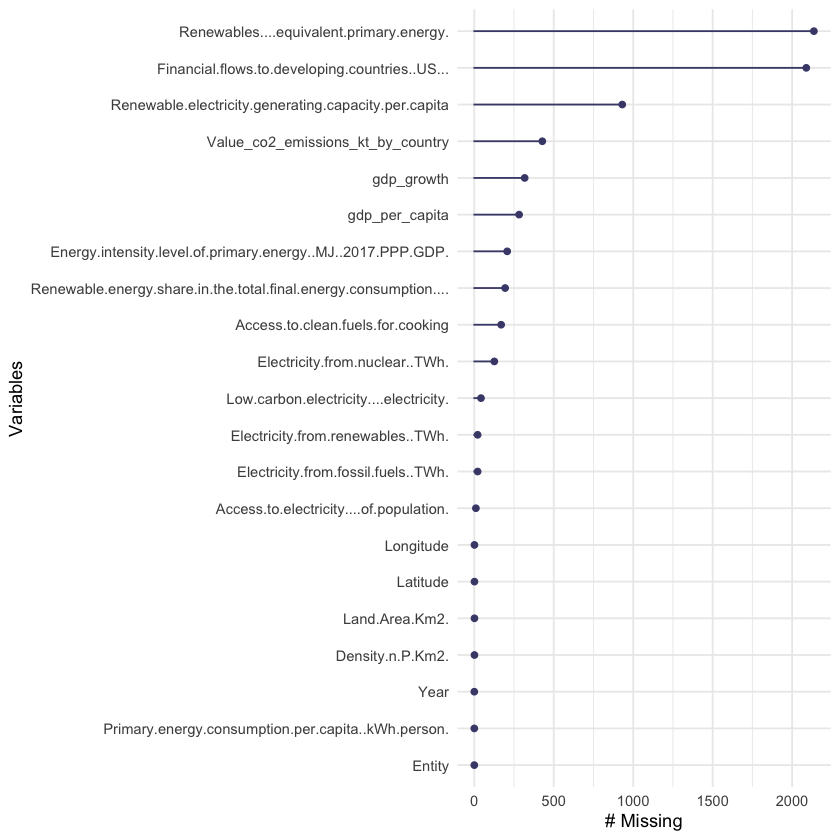

In [4]:
# Columns missing data rate

gg_miss_var(dataf)

In [5]:
missing_rate<-(colSums(is.na(dataf))/nrow(dataf))*100
missing_rate_df<-data.frame(missing_rate)
print(missing_rate_df)

                                                                 missing_rate
Entity                                                             0.00000000
Year                                                               0.00000000
Access.to.electricity....of.population.                            0.27404768
Access.to.clean.fuels.for.cooking                                  4.63140586
Renewable.electricity.generating.capacity.per.capita              25.51383941
Financial.flows.to.developing.countries..US...                    57.24856125
Renewable.energy.share.in.the.total.final.energy.consumption....   5.31652508
Electricity.from.fossil.fuels..TWh.                                0.57550014
Electricity.from.nuclear..TWh.                                     3.45300082
Electricity.from.renewables..TWh.                                  0.57550014
Low.carbon.electricity....electricity.                             1.15100027
Primary.energy.consumption.per.capita..kWh.person.              

In [6]:
# We remove the three variables with the highest rates of missing data

dataf<-subset(dataf,select=-Renewable.electricity.generating.capacity.per.capita)
dataf<-subset(dataf,select=-Financial.flows.to.developing.countries..US...)
dataf<-subset(dataf,select=-Renewables....equivalent.primary.energy.)
dataf<-subset(dataf,select=-Electricity.from.fossil.fuels..TWh.)
head(dataf)

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,44.99,0,0.31,65.95744,302.5948,1.64,760,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,45.60,0,0.50,84.74577,236.8919,1.74,730,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,37.83,0,0.56,81.15942,210.8622,1.40,1030,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,36.66,0,0.63,67.02128,229.9682,1.40,1220,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,44.24,0,0.56,62.92135,204.2312,1.20,1030,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,33.88,0,0.59,63.44086,252.0691,1.41,1550,11.229715,242.0313,60,652230,33.93911,67.70995


In [7]:
# Select only rows with no missing values in dataf

df <- dataf[complete.cases(dataf), ]

cat("Nombre d'observations dans dataf_complete :", nrow(df))
cat('\n')
cat("Nombre d'observations supprimées :", nrow(dataf)-nrow(df))
summary(df)

Nombre d'observations dans dataf_complete : 2868
Nombre d'observations supprimées : 781

                 Entity          Year     
 Algeria            :  20   2014   : 147  
 Angola             :  20   2015   : 147  
 Antigua and Barbuda:  20   2016   : 146  
 Argentina          :  20   2017   : 146  
 Armenia            :  20   2018   : 146  
 Australia          :  20   2019   : 146  
 (Other)            :2748   (Other):1990  
 Access.to.electricity....of.population. Access.to.clean.fuels.for.cooking
 Min.   :  1.252                         Min.   :  0.00                   
 1st Qu.: 53.238                         1st Qu.: 22.07                   
 Median : 97.000                         Median : 81.55                   
 Mean   : 76.585                         Mean   : 62.17                   
 3rd Qu.:100.000                         3rd Qu.:100.00                   
 Max.   :100.000                         Max.   :100.00                   
                                                                          
 Renewable.energy.share.in.the.total.final.energy.consum

In [8]:
# Verification

missing_rate2<-(colSums(is.na(df))/nrow(df))*100
missing_rate2_df<-data.frame(missing_rate2)
print(missing_rate2_df)

                                                                 missing_rate2
Entity                                                                       0
Year                                                                         0
Access.to.electricity....of.population.                                      0
Access.to.clean.fuels.for.cooking                                            0
Renewable.energy.share.in.the.total.final.energy.consumption....             0
Electricity.from.nuclear..TWh.                                               0
Electricity.from.renewables..TWh.                                            0
Low.carbon.electricity....electricity.                                       0
Primary.energy.consumption.per.capita..kWh.person.                           0
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.                  0
Value_co2_emissions_kt_by_country                                            0
gdp_growth                                          

### 1.4 - Exploration

In [9]:
# For better readability, we change the variable names 

names(df)<-c('Entity','Year','Electricity_access', 'Clean_cooking_access', "Renewable_energy_comsumption_share",
                   'Nuclear_Electricity', 'Renewable_electricity','Low_carbon_electricity',
                   'Energy_per_capita', 'Energy_intensity_level', 'co2_Emissions', 'GDP_growth',
                   'GDP_per_capita', 'Density', 'Land_Area','Latitude','Longitude')
names(df)

[1] "Entity"                             "Year"                              
 [3] "Electricity_access"                 "Clean_cooking_access"              
 [5] "Renewable_energy_comsumption_share" "Nuclear_Electricity"               
 [7] "Renewable_electricity"              "Low_carbon_electricity"            
 [9] "Energy_per_capita"                  "Energy_intensity_level"            
[11] "co2_Emissions"                      "GDP_growth"                        
[13] "GDP_per_capita"                     "Density"                           
[15] "Land_Area"                          "Latitude"                          
[17] "Longitude"

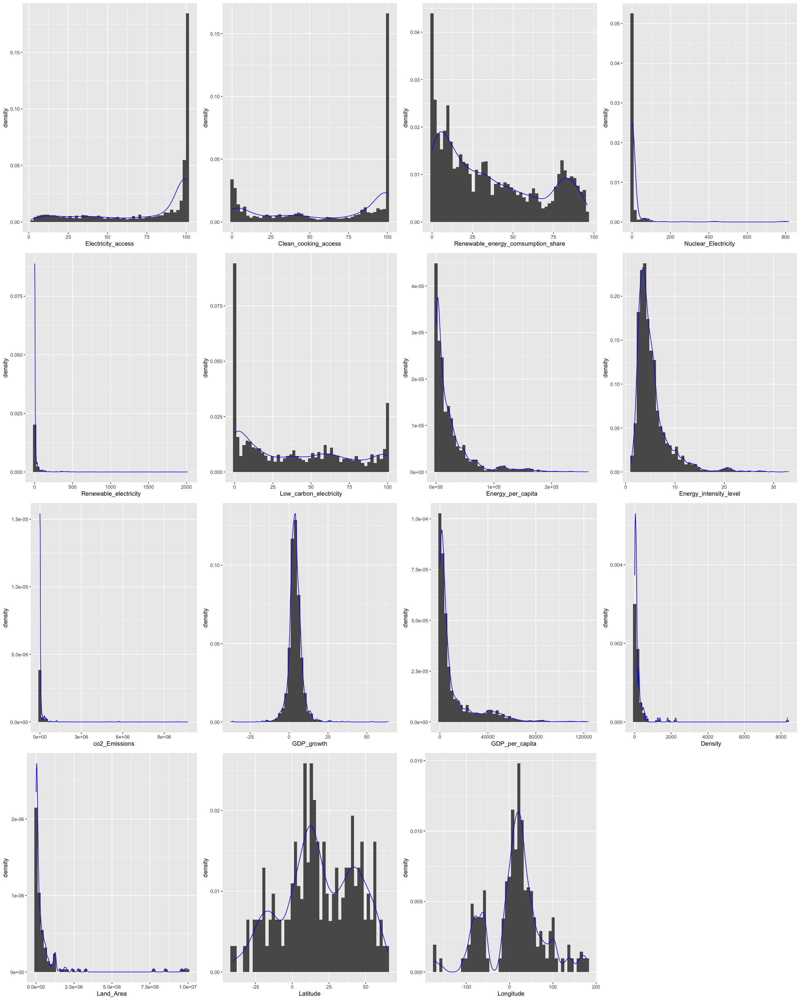

In [10]:
# Histograms of the variables

options(repr.plot.width = 20, repr.plot.height = 25)

#----------------#

variables <- c(names(df)[3:17])

p = list()
for (i in 1:length(variables)){
    p[[i]] = ggplot(df, aes(x = !!sym(variables[i]))) + 
             geom_histogram(aes(y = after_stat(density)), bins=50) +
             geom_density(alpha=.2, col="blue")
}

do.call(grid.arrange, c(p, ncol=4))

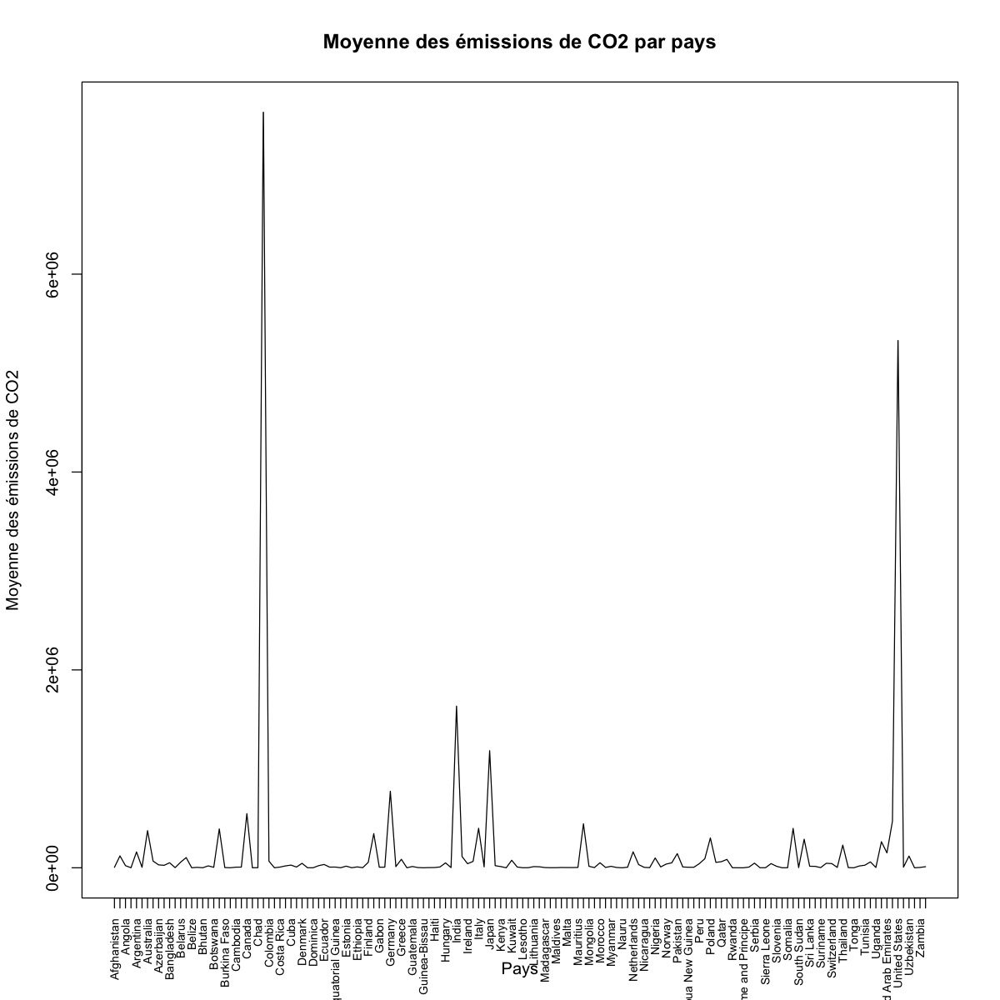

In [11]:
# Co2 emissions depending on the indice of the country

options(repr.plot.width = 10, repr.plot.height = 10)

#----------------#

co2 <- c()
countries <- unique(df$Entity)

years <- unique(df$Year)

#----------------#

for (country in countries) {
    subset <- df[df$Entity == country,]
    mean_co2 <- mean(subset$co2_Emissions, na.rm = TRUE)
    co2 <- c(co2, mean_co2)
}

plot(1:length(countries), co2, type="l",xaxt="n", xlab="Pays", ylab="Moyenne des émissions de CO2", 
     main="Moyenne des émissions de CO2 par pays")
axis(1, at=1:length(countries), labels=countries, las=2, cex.axis=0.7)

In [12]:
# Emissions mean for each countries

for (country in countries) {
    subset <- df[df$Entity == country,]
    # CO2 emissions means for country
    co2_mean <- mean(subset$co2_Emissions, na.rm = TRUE)
    cat(country, co2_mean, "\n")
}

Afghanistan 4643.529 
Algeria 119921 
Angola 21689.5 
Antigua and Barbuda 513 
Argentina 160462 
Armenia 4776.5 
Australia 375538 
Austria 67977.5 
Azerbaijan 29517.5 
Bahrain 24739 
Bangladesh 50723.5 
Barbados 1590 
Belarus 56956 
Belgium 103018.5 
Belize 600 
Benin 4343.5 
Bhutan 529 
Bosnia and Herzegovina 19164.5 
Botswana 4981.5 
Brazil 392988.5 
Burkina Faso 2372.5 
Burundi 321.5 
Cambodia 6049 
Cameroon 6886 
Canada 547644.5 
Central African Republic 206.5 
Chad 1229.5 
China 7636642 
Colombia 66926 
Comoros 172 
Costa Rica 7043.5 
Croatia 19060 
Cuba 27146.5 
Cyprus 7478.5 
Denmark 45182.5 
Djibouti 420 
Dominica 186 
Dominican Republic 21237.5 
Ecuador 33437 
El Salvador 6711.5 
Equatorial Guinea 7242 
Eritrea 584.1667 
Estonia 16545.5 
Eswatini 717 
Ethiopia 8825 
Fiji 1232.5 
Finland 54884 
France 345437.5 
Gabon 5742 
Georgia 6320.5 
Germany 773644.5 
Ghana 11619.5 
Greece 85538.5 
Grenada 306 
Guatemala 12992.5 
Guinea 2321 
Guinea-Bissau 247.2222 
Guyana 1898 
Haiti 2385

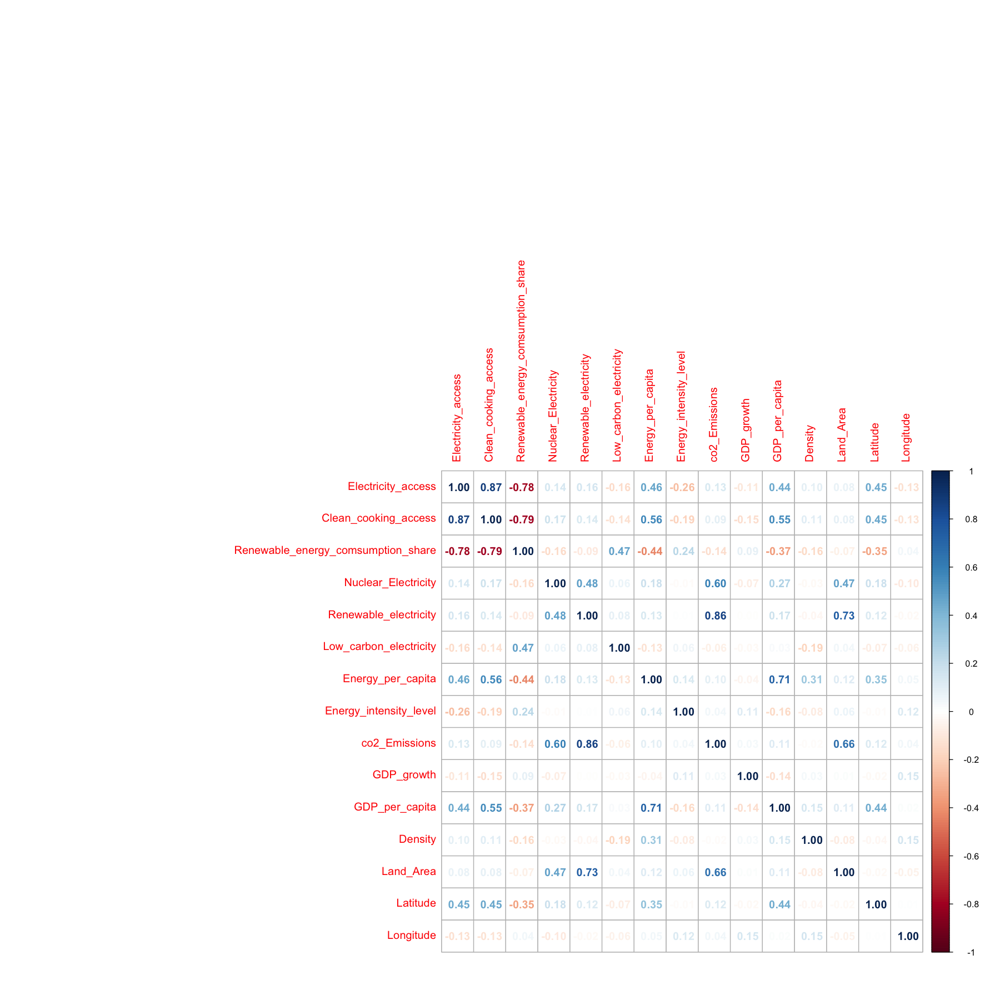

In [13]:
# Correlation matrix

options(repr.plot.width = 15, repr.plot.height = 15)

#----------------#

# Only numeric variable
df_numeric <- select_if(df, is.numeric)

correlation_matrix<-cor(df_numeric)

corrplot(correlation_matrix, method = "number")

From these charts, we can already predict which variables may be going to be used to build co2 estimators : Fossil electricity, Nuclear electricity, Renewable electricity, Land Area which are the most correlated to the target variable.

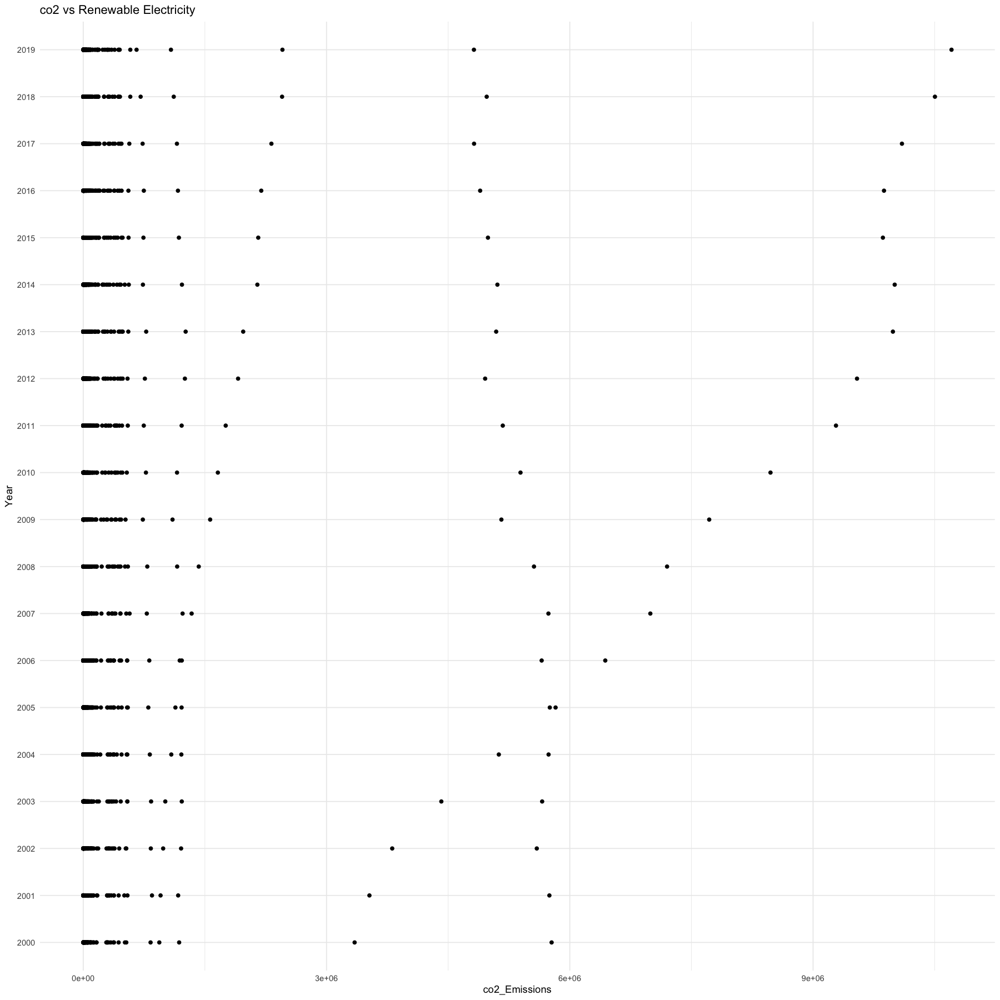

In [14]:
# Scatter plot co2 vs Renewable Electricity
ggplot(df, aes(x = co2_Emissions, y = Year)) +
  geom_point() +
  #geom_smooth(method = "lm", se = FALSE, color = "blue") +
  labs(title = "co2 vs Renewable Electricity") +
  theme_minimal()

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


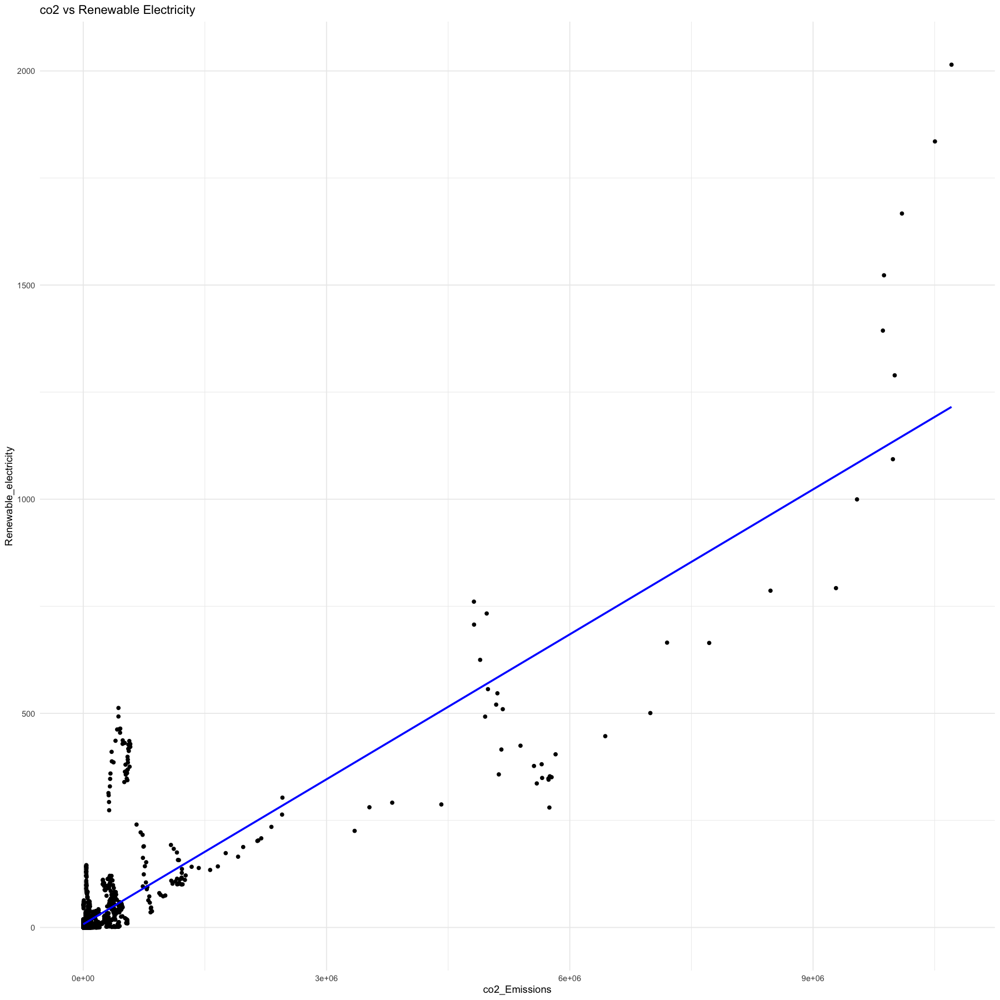

`geom_smooth()` using formula = 'y ~ x'


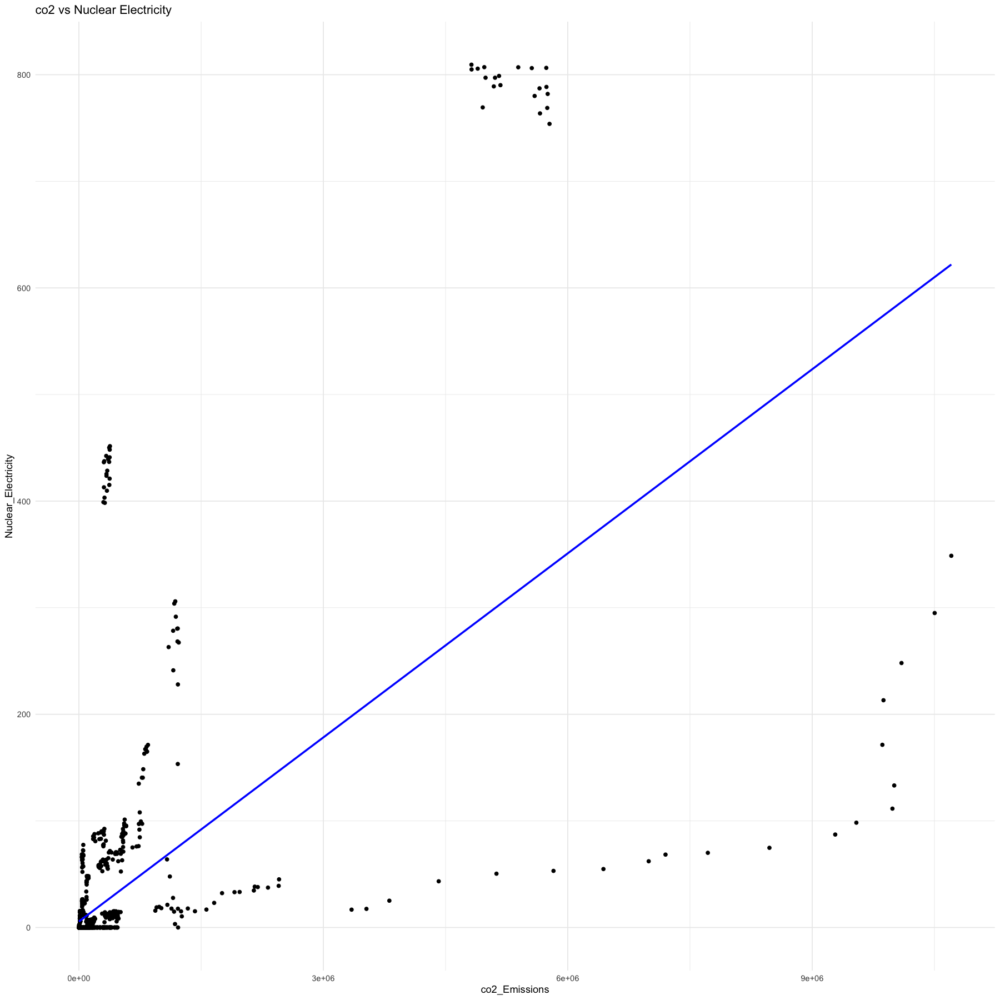

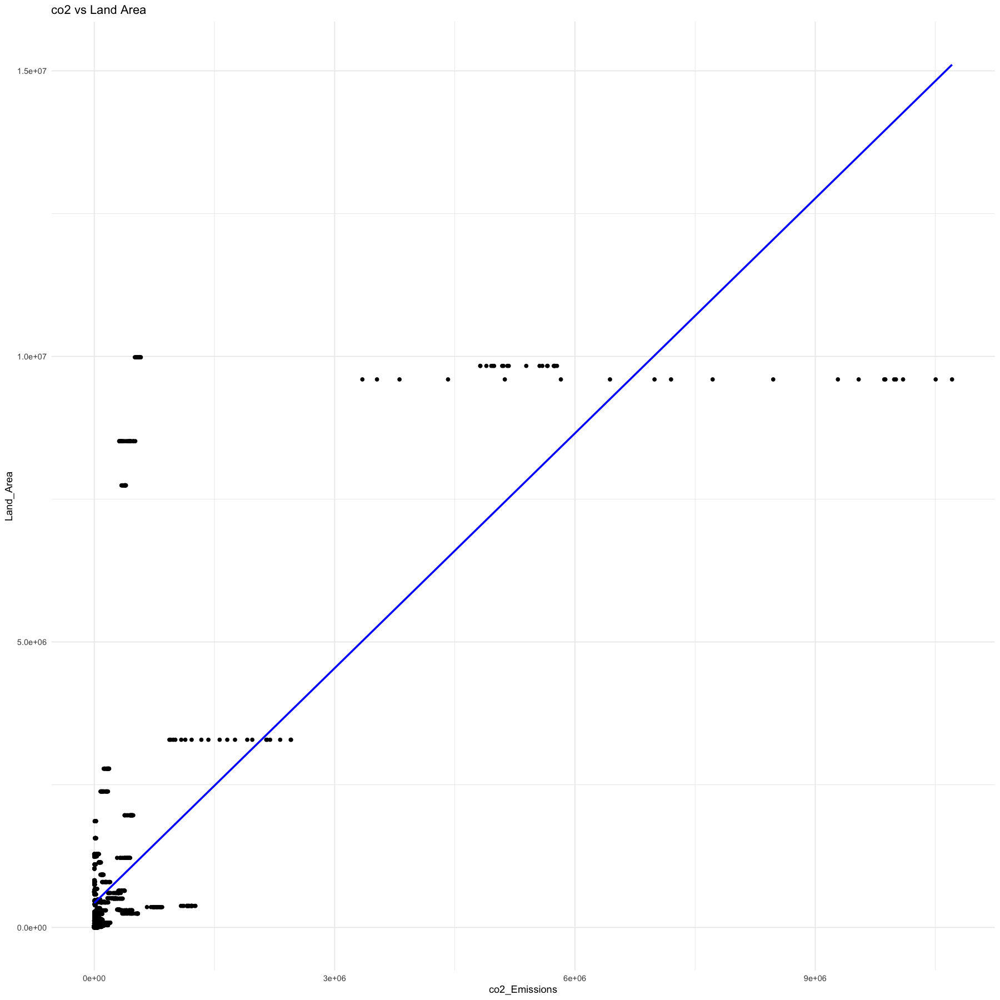

In [15]:

# Scatter plot co2 vs Renewable Electricity
ggplot(df, aes(x = co2_Emissions, y = Renewable_electricity)) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE, color = "blue") +
  labs(title = "co2 vs Renewable Electricity") +
  theme_minimal()
# Scatter plot co2 vs Nuclear Electricity
ggplot(df, aes(x = co2_Emissions, y = Nuclear_Electricity)) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE, color = "blue") +
  labs(title = "co2 vs Nuclear Electricity") +
  theme_minimal()

# Scatter plot co2 vs Land Area
ggplot(df, aes(x = co2_Emissions, y = Land_Area)) +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE, color = "blue") +
  labs(title = "co2 vs Land Area") +
  theme_minimal()

### 1.5 -  Principal Component Analysis

In [16]:
# We supp the columns co2_Emissions

df_numeric2 <- df_numeric[, !(names(df_numeric) %in% c('co2_Emissions'))]

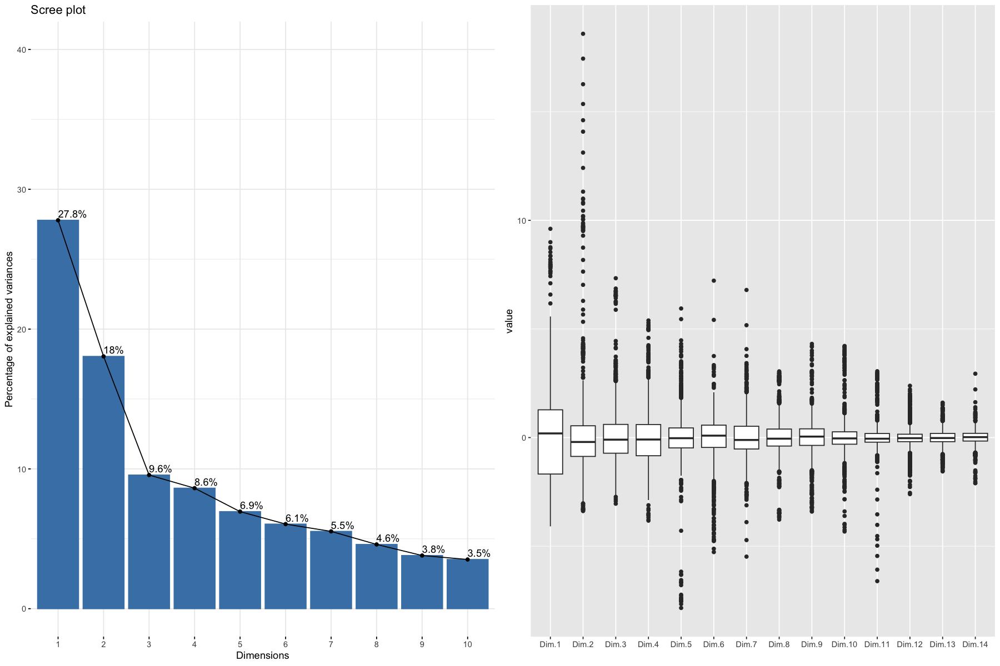

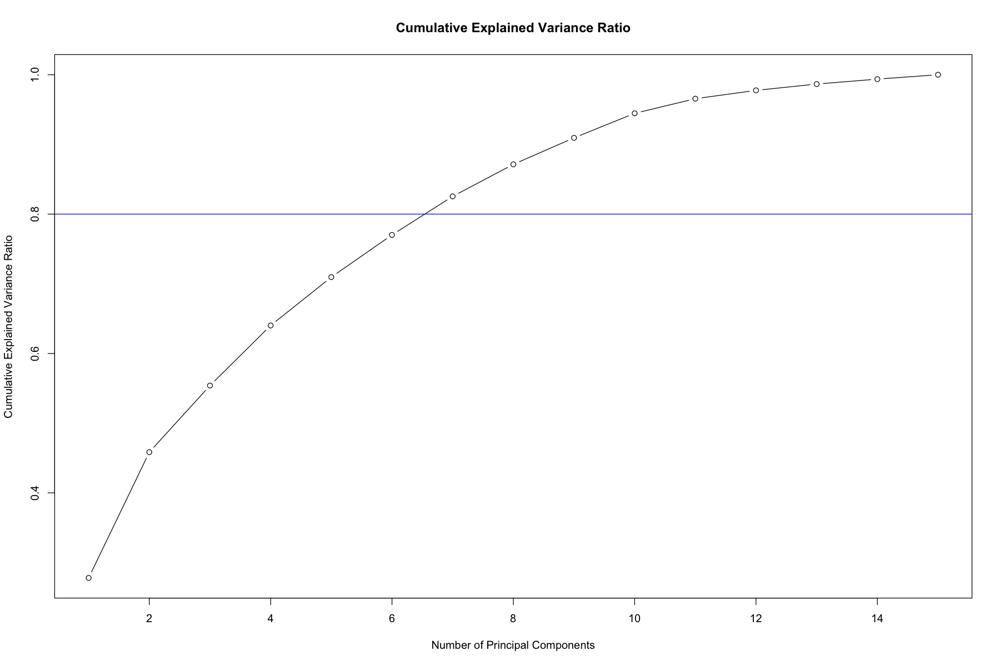

In [17]:
options(repr.plot.width = 15, repr.plot.height = 10)

#----------------#

# Scale the data
scaled_data <- scale(df_numeric)

# Principal component analysis
pca <- PCA(scaled_data, ncp=14, graph = FALSE)  # Ne pas créer de graphiques automatiquement

p1 <- fviz_eig(pca, addlabels = TRUE, ylim = c(0, 40))
p2 <- ggplot(melt(pca$ind$coord),aes(x=Var2,y=value))+geom_boxplot()+xlab("")

grid.arrange(p1,p2,ncol=2)

#---------------#

# Cumulative explained variance
explained_variance_ratio <- pca$eig / sum(pca$eig[, 2])

plot(cumsum(explained_variance_ratio[, 2]), type='b', main='Cumulative Explained Variance Ratio',
     xlab='Number of Principal Components', ylab='Cumulative Explained Variance Ratio')
abline(h=0.8,col="blue")

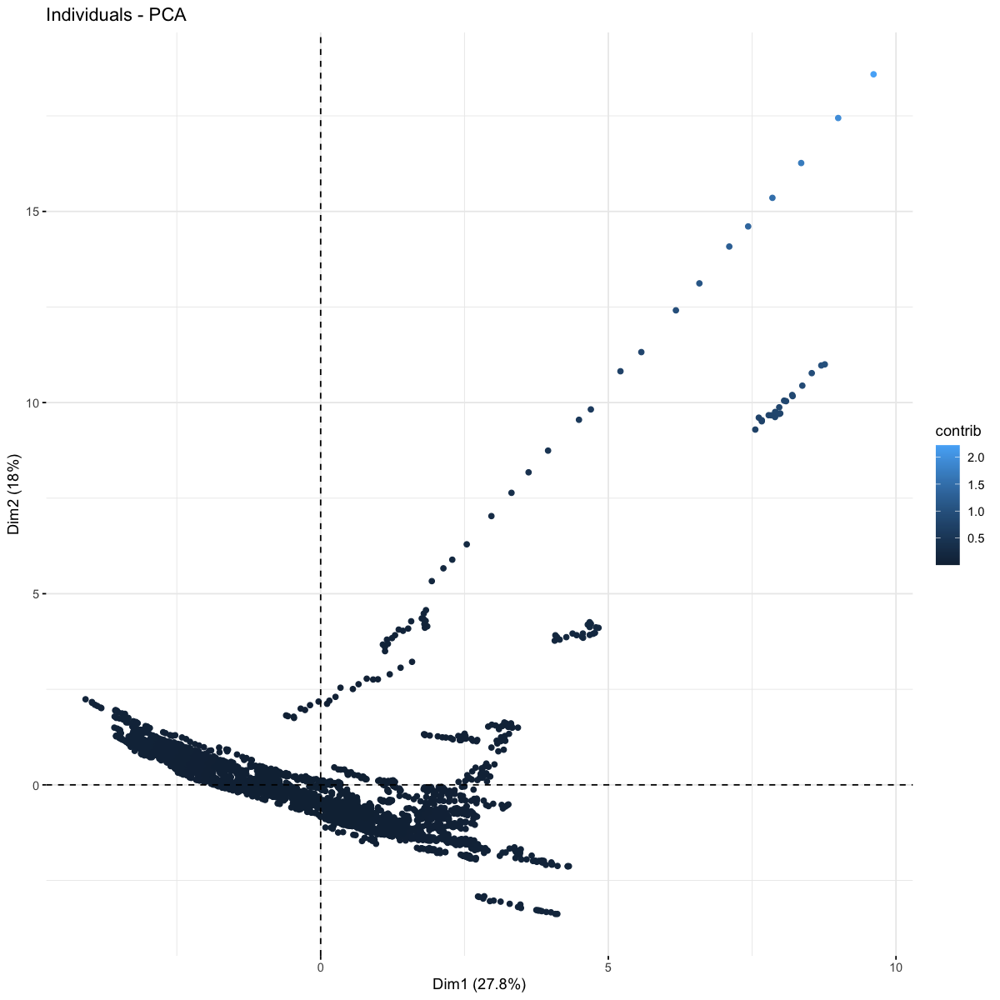

In [18]:
# Individuals in the 1st factorial plane colored w.r.t contribution

options(repr.plot.width = 10, repr.plot.height = 10)

#----------------#

fviz_pca_ind(pca,col.ind="contrib",label="none")

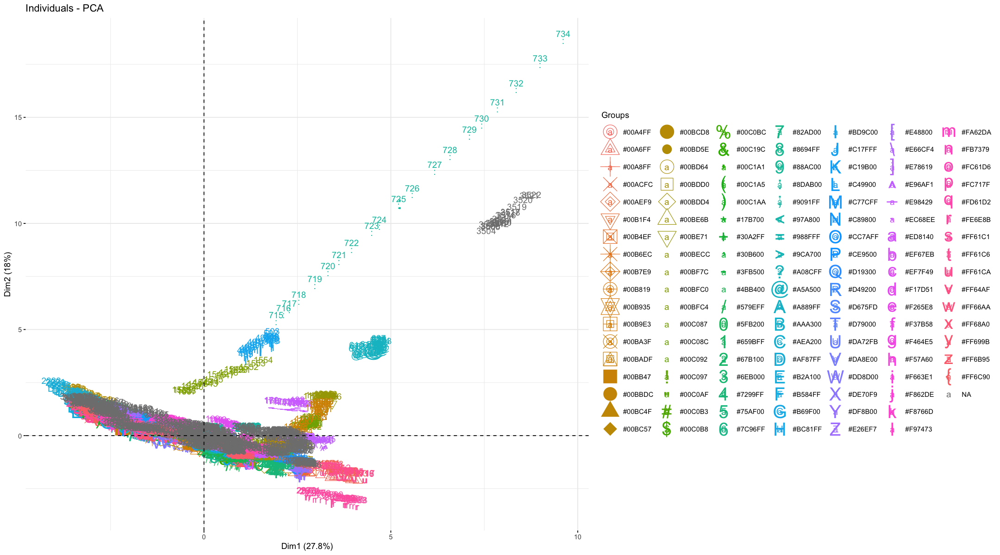

In [19]:
# Individuals in the 1st factorial plane colored w.r.t country

options(warn=-1)
options(repr.plot.width = 18, repr.plot.height = 10)

#----------------#

country_palette <- hue_pal()(length(countries))
country_colormap <- setNames(country_palette, countries)
df$country_colors <- country_colormap[df$Entity]

#----------------#

fviz_pca_ind(pca, axes=c(1,2),geom = c("point","text"),pointsize = 4, habillage =as.factor(df$country_colors))

In [20]:
# We supp the columns country_colors
df<-df[, !(names(df) %in% c('country_colors'))]

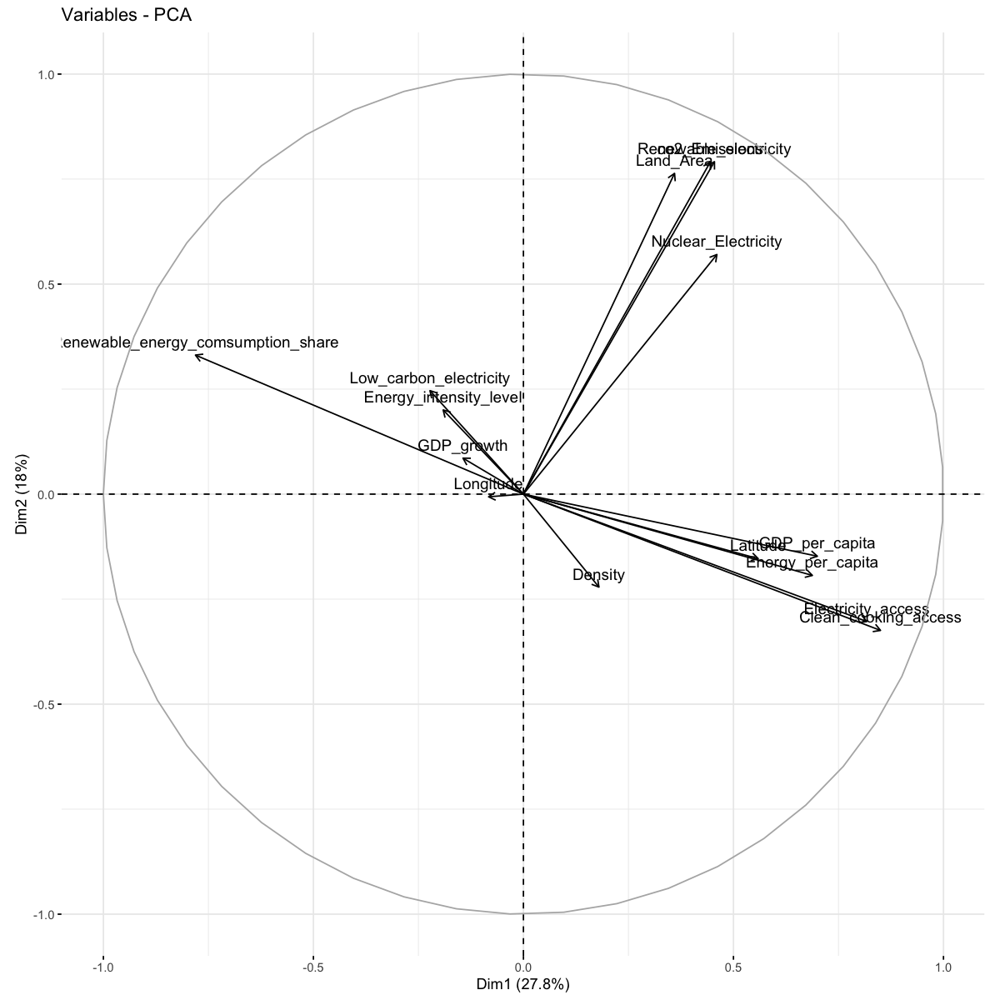

In [21]:
# Variables factor map

options(repr.plot.width = 10, repr.plot.height = 10)

#----------------#

fviz_pca_var(pca)

### 1.6 - Correlation of original variables with the target

In [22]:
correlation_matrix2<-cor(df_numeric)

# Calculer les corrélations avec les émissions de CO2 et les classer par ordre décroissant
correlations <- correlation_matrix2[,'co2_Emissions'] %>% abs() %>% sort(decreasing = TRUE)
correlations_df <- data.frame(correlations)

# Calculer la moyenne des corrélations en valeur absolue
mean_correlation <- mean(correlations)

# Afficher la moyenne
print(paste("Moyenne des corrélations en valeur absolue:", mean_correlation))

print("Corrélations avec les émissions de CO2:")
correlations_df

[1] "Moyenne des corrélations en valeur absolue: 0.267345526614646"
[1] "Corrélations avec les émissions de CO2:"


,correlations
,<dbl>
co2_Emissions,1.00000000
Renewable_electricity,0.85737528
Land_Area,0.65782770
Nuclear_Electricity,0.59772835
Renewable_energy_comsumption_share,0.14498845
Electricity_access,0.13354617
Latitude,0.12053638
GDP_per_capita,0.11255438
Energy_per_capita,0.09544770


### 1.7 Correlation of principal components with the target

In [23]:
# Correlation between CO2 emissions and principal componants

target <- df[,'co2_Emissions']
correlation <- apply(pca$ind$coord, 2, function(x) cor(target, x)) 
correlation_abs <- abs(correlation)
correlation_sorted <- sort(correlation_abs,decreasing=TRUE)
correlation_sorted_df <- data.frame(correlation_sorted)

#-------------#

print(paste("Moyenne des corrélations en valeur absolue:", mean(correlation_sorted)))
                     
correlation_sorted_df

[1] "Moyenne des corrélations en valeur absolue: 0.157572674476349"


,correlation_sorted
,<dbl>
Dim.2,0.790734390
Dim.1,0.444850400
Dim.11,0.255500282
Dim.4,0.194011721
Dim.14,0.118111346
Dim.9,0.100980613
Dim.3,0.091302111
Dim.7,0.088790419
Dim.10,0.041960530


[1] "Correlation between Years and CO2: 0.964621904029123"


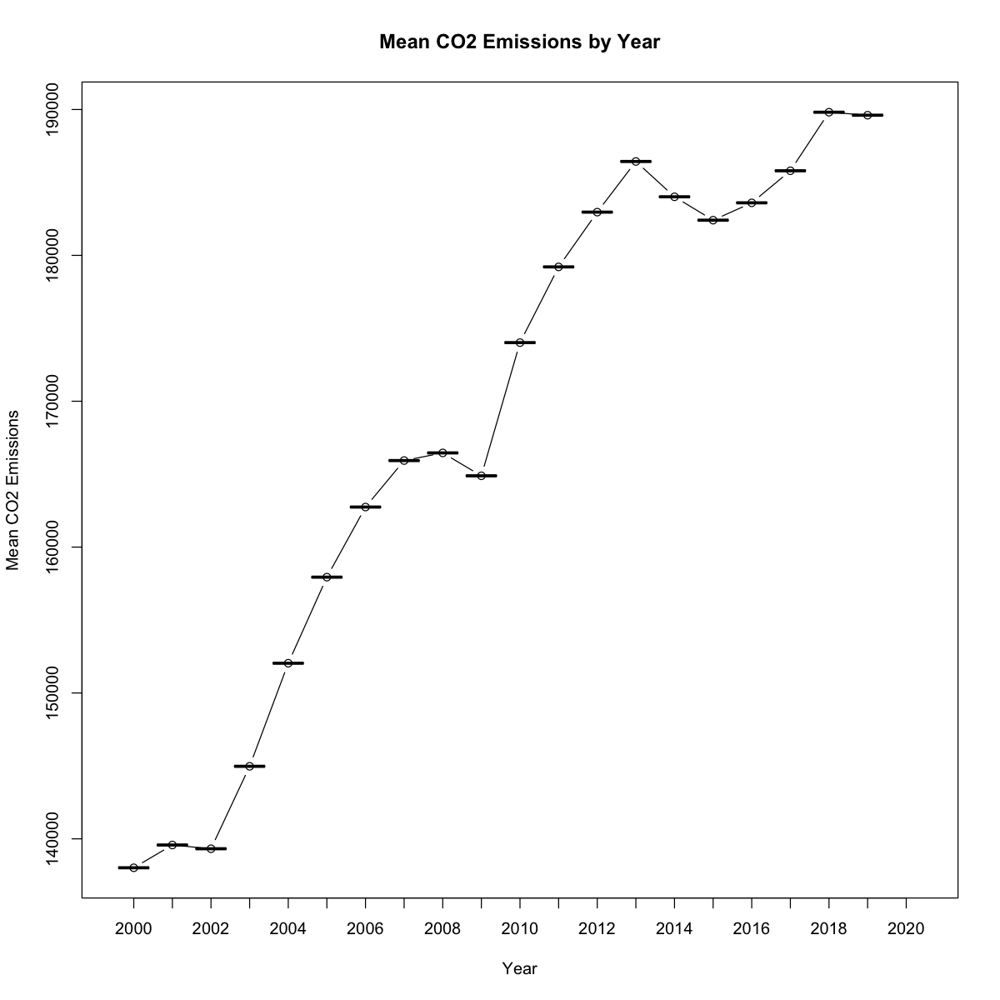

In [24]:
# Correlation between years and CO2

options(repr.plot.width = 10, repr.plot.height = 10)

#----------------#

co2 <- c()
year_co<-years[order(years)]

#----------------#

for (year in year_co) {
  subset <- df %>% filter(Year == year)
  co2 <- c(co2, mean(subset$co2_Emissions))
}

co2_data <- data.frame(Year = year_co, CO2 = co2)
years_numeric <- as.numeric(levels(year_co))[year_co]

plot(co2_data$Year, co2_data$CO2, type="b", xlab="Year", ylab="Mean CO2 Emissions", main="Mean CO2 Emissions by Year")
lines(co2_data$Year, co2_data$CO2, type="b")

#---------------#

correlation_year_co2 <- cor(years_numeric,co2_data$CO2)
print(paste("Correlation between Years and CO2:", correlation_year_co2))

## 1.8 - Constitution of training and testing datasets


In [25]:
# Extraction of the subset of training and test data

set.seed(42) 

# Sample extraction
test.ratio <- 0.2 # share of test sample
npop <- nrow(df) # number of rows in data
nvar <- ncol(df) # number of columns

# test sample size
ntest <- ceiling(npop * test.ratio) 
# test sample indices
testi <- sample(1:npop, ntest)

# learning sample indices
appri <- setdiff(1:npop, testi) 

In [26]:
df_num <- df[,-c(1,2)]
df_num <- data.frame(scale(df_num))

df_scale <- cbind(df[,c(1,2)],df_num)

df_scale

,Entity,Year,Electricity_access,Clean_cooking_access,Renewable_energy_comsumption_share,Nuclear_Electricity,Renewable_electricity,Low_carbon_electricity,Energy_per_capita,Energy_intensity_level,co2_Emissions,GDP_growth,GDP_per_capita,Density,Land_Area,Latitude,Longitude
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,Afghanistan,2003,-1.9627228,-1.3423046,0.02857477,-0.1946913,-0.2412979,0.7950071,-0.6968803,-1.1231884,-0.20488273,1.062712614,-0.6612948,-0.2265952,-0.003481871,0.6338505,0.8359896
5,Afghanistan,2004,-1.7936844,-1.3066254,0.28103946,-0.1946913,-0.2419482,0.6760129,-0.6975741,-1.1790947,-0.20511499,-0.534097141,-0.6601898,-0.2265952,-0.003481871,0.6338505,0.8359896
6,Afghanistan,2005,-1.6246631,-1.2734947,-0.06401782,-0.1946913,-0.2416695,0.6910908,-0.6962846,-1.1203931,-0.20447931,1.578777364,-0.6585534,-0.2265952,-0.003481871,0.6338505,0.8359896
7,Afghanistan,2006,-1.4555823,-1.2314442,-0.13029813,-0.1946913,-0.2412050,1.0611289,-0.6948734,-1.0952353,-0.20422260,0.314722045,-0.6573948,-0.2265952,-0.003481871,0.6338505,0.8359896
8,Afghanistan,2007,-1.2863581,-1.1944908,-0.23388193,-0.1946913,-0.2401831,1.1411435,-0.6935294,-1.0868493,-0.20421037,2.137714332,-0.6522716,-0.2265952,-0.003481871,0.6338505,0.8359896
9,Afghanistan,2008,-1.0848692,-1.1588116,-0.48734583,-0.1946913,-0.2421340,0.9967585,-0.6866946,-0.9722414,-0.20202216,0.006383943,-0.6520062,-0.2265952,-0.003481871,0.6338505,0.8359896
10,Afghanistan,2009,-0.9471351,-1.1154868,-0.64188886,-0.1946913,-0.2399044,1.2581473,-0.6767959,-0.8855867,-0.20040851,3.765962137,-0.6481299,-0.2265952,-0.003481871,0.6338505,0.8359896
11,Afghanistan,2010,-1.0753485,-1.0747106,-0.68785209,-0.1946913,-0.2401831,1.1655192,-0.6711933,-0.8268851,-0.19768242,2.253118250,-0.6424687,-0.2265952,-0.003481871,0.6338505,0.8359896
12,Afghanistan,2011,-1.0587819,-1.0288373,-0.77245107,-0.1946913,-0.2415766,1.0823919,-0.6643674,-0.6116458,-0.19545753,-0.746719940,-0.6399122,-0.2265952,-0.003481871,0.6338505,0.8359896


In [27]:
year_dummies <- model.matrix(~ Year -1, data = df)
entity_dummies <- model.matrix(~ Entity -1, data = df)
df_dummies <- cbind(year_dummies,entity_dummies)
df_dummies_co2<-cbind(df_num[,"co2_Emissions"],df_dummies)
colnames(df_dummies_co2)[1] <- "co2_Emissions"
dfP<-cbind(pca$ind$coord,df_dummies_co2)
X_train_P <- data.frame(dfP[appri,])
X_test_P <- data.frame(dfP[testi,])
summary(X_train_P)

     Dim.1              Dim.2              Dim.3              Dim.4          
 Min.   :-4.08641   Min.   :-3.37703   Min.   :-2.73033   Min.   :-3.823784  
 1st Qu.:-1.71367   1st Qu.:-0.86431   1st Qu.:-0.71457   1st Qu.:-0.829550  
 Median : 0.16980   Median :-0.18573   Median :-0.08054   Median :-0.093610  
 Mean   :-0.01039   Mean   : 0.01823   Mean   : 0.01012   Mean   : 0.004086  
 3rd Qu.: 1.28866   3rd Qu.: 0.55545   3rd Qu.: 0.62068   3rd Qu.: 0.603192  
 Max.   : 9.61001   Max.   :18.58708   Max.   : 7.33568   Max.   : 5.285934  
     Dim.5              Dim.6               Dim.7               Dim.8          
 Min.   :-7.84232   Min.   :-5.117962   Min.   :-3.891975   Min.   :-3.775740  
 1st Qu.:-0.48284   1st Qu.:-0.459776   1st Qu.:-0.522985   1st Qu.:-0.390343  
 Median :-0.02841   Median : 0.094980   Median :-0.110611   Median :-0.050713  
 Mean   :-0.01063   Mean   : 0.003599   Mean   : 0.001372   Mean   : 0.006256  
 3rd Qu.: 0.43872   3rd Qu.: 0.606304   3rd Qu.: 0.521

In [28]:
# construction de l'échantillon d'apprentissage
train <- df_scale[appri,] 
# construction de l'échantillon test
test <- df_scale[testi,] 
# vérification
str(train)
str(test)
#summary(datappr) 

'data.frame':	2294 obs. of  17 variables:
 $ Entity                            : Factor w/ 176 levels "Afghanistan",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Year                              : Factor w/ 21 levels "2000","2001",..: 4 7 8 9 10 12 13 14 15 16 ...
 $ Electricity_access                : num  -1.963 -1.456 -1.286 -1.085 -0.947 ...
 $ Clean_cooking_access              : num  -1.34 -1.23 -1.19 -1.16 -1.12 ...
 $ Renewable_energy_comsumption_share: num  0.0286 -0.1303 -0.2339 -0.4873 -0.6419 ...
 $ Nuclear_Electricity               : num  -0.195 -0.195 -0.195 -0.195 -0.195 ...
 $ Renewable_electricity             : num  -0.241 -0.241 -0.24 -0.242 -0.24 ...
 $ Low_carbon_electricity            : num  0.795 1.061 1.141 0.997 1.258 ...
 $ Energy_per_capita                 : num  -0.697 -0.695 -0.694 -0.687 -0.677 ...
 $ Energy_intensity_level            : num  -1.123 -1.095 -1.087 -0.972 -0.886 ...
 $ co2_Emissions                     : num  -0.205 -0.204 -0.204 -0.202 -0.2 ...
 $ GDP_growt

### 1.9 - Implementation of usefull functions

In [29]:
# Function to plot residuals graph

gplot.res <- function(x, y, titre = "titre"){
    ggplot(data.frame(x=x, y=y),aes(x,y))+
    geom_point(col = "blue")+
    ylab("Résidus")+ xlab("Valeurs prédites")+
    ggtitle(titre)+
    geom_hline(yintercept = 0,col="green")
}
# +xlim(0, 10^7)+ylim(-2e6, 4e6)

In [30]:
# Function for R-squared

R2 <- function(y_actual, y_predicted) {
  SS_Residual <- sum((y_actual - y_predicted)^2)
  SS_Total <- sum((y_actual - mean(y_actual))^2)
  R_squared <- 1 - (SS_Residual / SS_Total)
  return(R_squared)
}

In [31]:
# Function for Mean Squarred Error

MSE <- function(y_actual, y_predicted) {
  mse <- mean((y_actual - y_predicted)^2)
  return(mse)
}

In [32]:
# Dataframe to stock results

results_df <- data.frame(Model = character(),
                         R_squarred = numeric(),
                         Mean_squarred_error = numeric(),
                         stringsAsFactors = FALSE)

#--------------------#

# Function to stock new results

add_model_results <- function(df, model_name, R2, MSE) {
  new_row <- data.frame(Model = model_name,
                        R_squarred = R2,
                        Mean_squarred_error = MSE,
                        stringsAsFactors = FALSE)
  return(rbind(df, new_row))
}

In [132]:
#library(data.table)
predictions_df <- data.table()

# 2 - Gaussian Linear Regression 

### 2.1 - Linear regression with the quantitative variables dataset

MSE = 0.1799421 
R2 = 0.7168952 


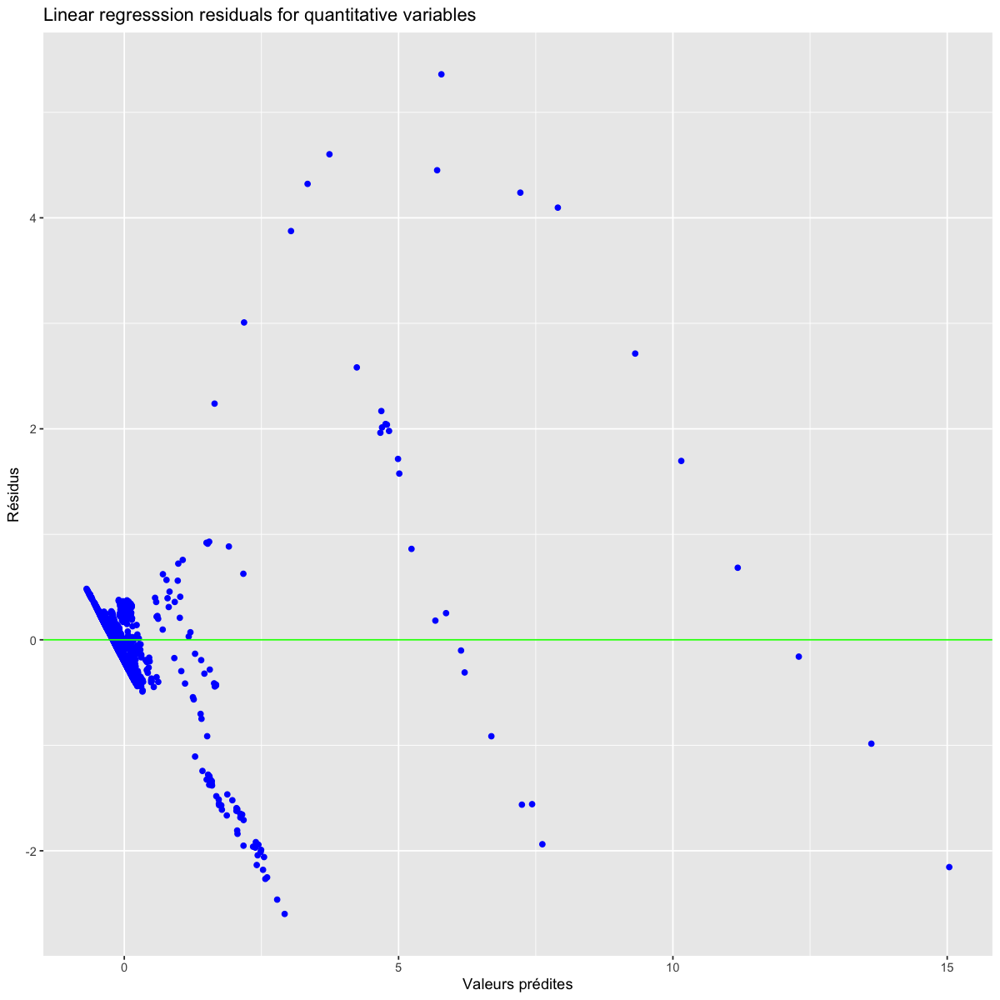

In [133]:
# Train a linear regression model
linear_reg <- lm(co2_Emissions ~ ., data = train[,-c(1,2)])

# Make predictions on the testing set
Y_pred <- predict(linear_reg, newdata = test[,-c(1,2)])

# Evaluate the model performance
Y_test = test[,11]
mse = MSE(Y_test,Y_pred)
r2 = R2(Y_test,Y_pred)
cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

# Extraction des résidus et des valeurs ajustées de ce modèle
res.lm.1 <- linear_reg$residuals
fit.lm.1 <- linear_reg$fitted.values

#-----------------#

options(repr.plot.width = 10, repr.plot.height = 10)

# Plot residuals
gplot.res(fit.lm.1,res.lm.1,"Linear regresssion residuals for quantitative variables")

#-----------------#

results_df <- add_model_results(results_df, "Linear regression on quantitative data",r2,mse)
predictions_df[, LM_quanti := Y_pred]

In [34]:
summary(linear_reg)


Call:
lm(formula = co2_Emissions ~ ., data = train[, -c(1, 2)])

Residuals:
    Min      1Q  Median      3Q     Max 
-2.5988 -0.0988  0.0139  0.1289  5.3607 

Coefficients:
                                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)                        -0.002616   0.009063  -0.289  0.77287    
Electricity_access                  0.055965   0.020561   2.722  0.00654 ** 
Clean_cooking_access               -0.103725   0.023206  -4.470 8.21e-06 ***
Renewable_energy_comsumption_share -0.065858   0.020526  -3.209  0.00135 ** 
Nuclear_Electricity                 0.294093   0.010940  26.883  < 2e-16 ***
Renewable_electricity               0.744281   0.012935  57.538  < 2e-16 ***
Low_carbon_electricity             -0.116079   0.011872  -9.778  < 2e-16 ***
Energy_per_capita                  -0.046350   0.016091  -2.880  0.00401 ** 
Energy_intensity_level              0.050895   0.010939   4.653 3.47e-06 ***
GDP_growth                          0.026840   0.009912 

In [35]:
# Get the model coefficients
coef_lm <- coef(linear_reg)

# Create a vector with the corresponding coefficients and column names
coef_lm <- as.vector(coef_lm)
names(coef_lm)[1] <- "Intercept"
names(coef_lm)[2:15] <- colnames(train[,-c(1,2,11)])  

print(coef_lm)

                         Intercept                 Electricity_access 
                      -0.002616050                        0.055964546 
              Clean_cooking_access Renewable_energy_comsumption_share 
                      -0.103725196                       -0.065857832 
               Nuclear_Electricity              Renewable_electricity 
                       0.294092605                        0.744281235 
            Low_carbon_electricity                  Energy_per_capita 
                      -0.116078796                       -0.046349696 
            Energy_intensity_level                         GDP_growth 
                       0.050895222                        0.026839993 
                    GDP_per_capita                            Density 
                      -0.026436732                        0.002796187 
                         Land_Area                           Latitude 
                      -0.026864439                       -0.001880562 
      

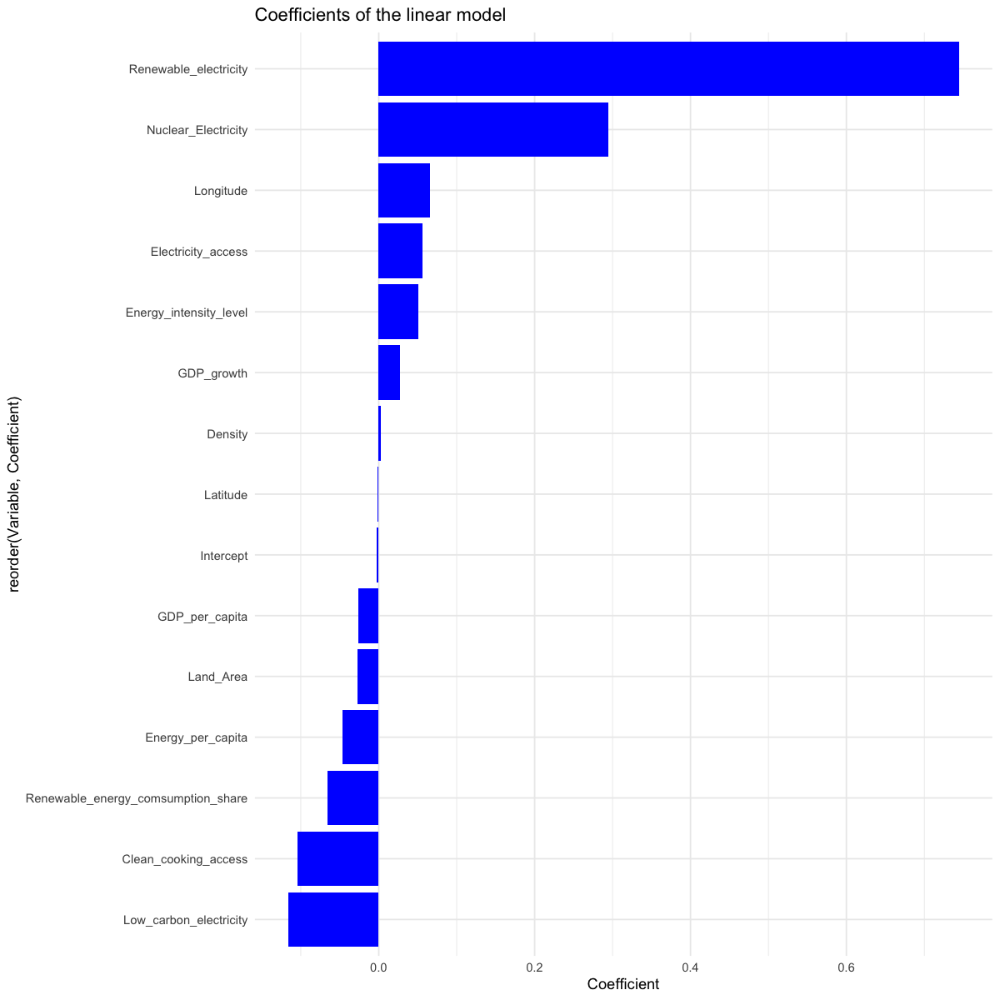

In [36]:
# Graph of Coefficients of the linear model

options(repr.plot.width = 10, repr.plot.height = 10)

#----------------#

coef_df <- data.frame(Coefficient = coef_lm, Variable = names(coef_lm))
ggplot(coef_df, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
  geom_bar(stat = "identity", fill = "blue") +
  labs(title = "Coefficients of the linear model", x = "Coefficient") +
  theme_minimal()

### 2.2 - Linear regression with the [original data+dummies] dataset

MSE = 0.03809092 
R2 = 0.9400711 


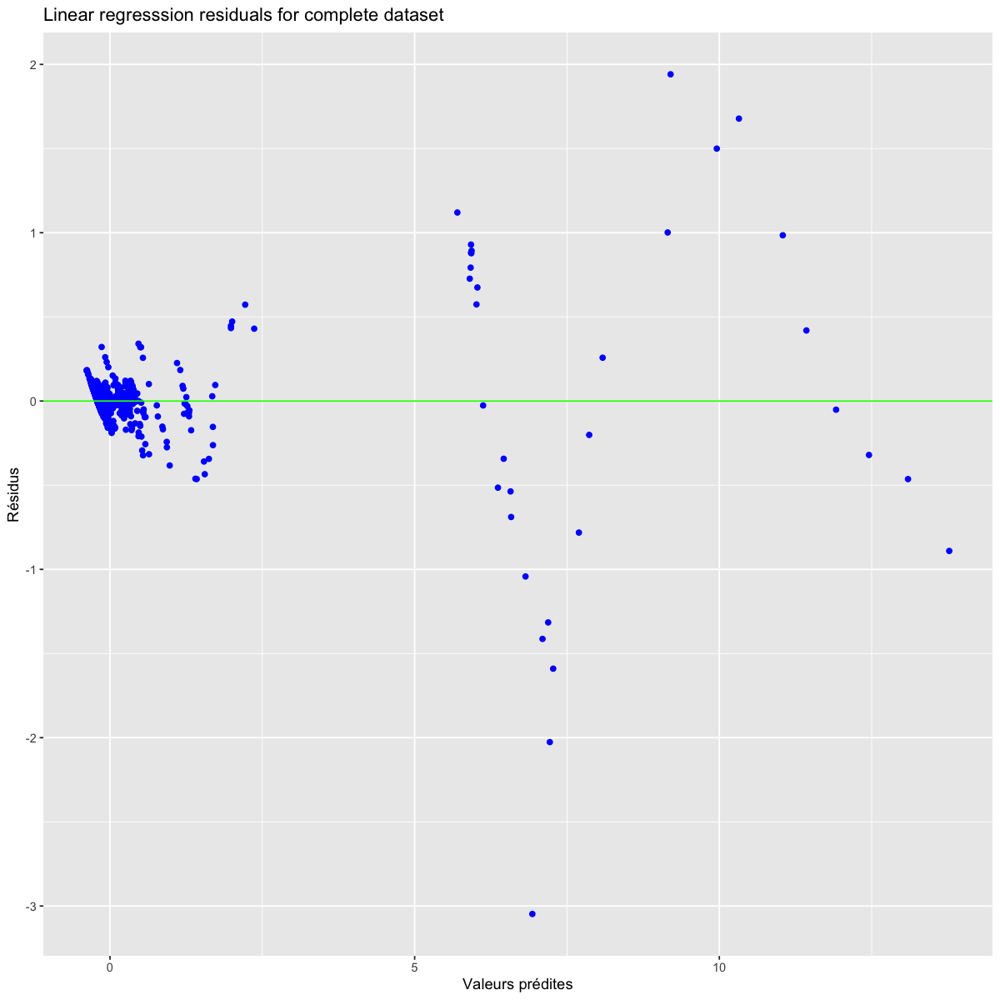

In [137]:
# Train a linear regression model
linear_reg2 <- aov(co2_Emissions ~ . -1 , data = train)

# Make predictions on the testing set
Y_pred2 <- predict(linear_reg2, newdata = test)

# Evaluate the model performance
Y_test = test[,11]
mse = MSE(Y_test,Y_pred2)
r2 = R2(Y_test,Y_pred2)
cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

# Extraction des résidus et des valeurs ajustées de ce modèle
res.lm.2 <- linear_reg2$residuals
fit.lm.2 <- linear_reg2$fitted.values

#-----------------#

options(repr.plot.width = 10, repr.plot.height = 10)

# Plot residuals
gplot.res(fit.lm.2,res.lm.2,"Linear regresssion residuals for complete dataset")

#-----------------#

results_df <- add_model_results(results_df, "Linear regression on full data",r2,mse)
predictions_df[, LM_full := Y_pred2]

In [38]:
summary(linear_reg2)

                                     Df Sum Sq Mean Sq  F value   Pr(>F)    
Entity                              148 2375.1   16.05  704.649  < 2e-16 ***
Year                                 19    1.3    0.07    2.951 1.91e-05 ***
Electricity_access                    1    0.0    0.00    0.008   0.9268    
Clean_cooking_access                  1    6.5    6.47  284.149  < 2e-16 ***
Renewable_energy_comsumption_share    1    0.5    0.47   20.850 5.25e-06 ***
Nuclear_Electricity                   1   20.7   20.65  906.939  < 2e-16 ***
Renewable_electricity                 1   49.2   49.17 2158.899  < 2e-16 ***
Low_carbon_electricity                1    0.1    0.08    3.347   0.0675 .  
Energy_per_capita                     1    0.4    0.44   19.518 1.05e-05 ***
Energy_intensity_level                1    0.0    0.00    0.032   0.8571    
GDP_growth                            1    0.0    0.00    0.025   0.8734    
GDP_per_capita                        1    0.1    0.14    6.047   0.0140 *  

In [39]:
# Get the model coefficients
coef_lm2 <- coef(linear_reg2)
names <- names(coef_lm2)

# Create a vector with the corresponding coefficients and column names
coef_lm2 <- as.vector(coef_lm2)
names(coef_lm2) <- names

print(coef_lm2)

                 EntityAfghanistan                      EntityAlgeria 
                      0.0375250462                      -0.2200910414 
                      EntityAngola          EntityAntigua and Barbuda 
                      0.1161281982                      -0.4098336052 
                   EntityArgentina                      EntityArmenia 
                     -0.2569922417                      -0.2849236376 
                   EntityAustralia                      EntityAustria 
                     -0.0547572907                      -0.3229727174 
                  EntityAzerbaijan                      EntityBahrain 
                     -0.3042055773                      -0.7035676889 
                  EntityBangladesh                     EntityBarbados 
                      0.1638143400                      -0.3580653724 
                     EntityBelarus                      EntityBelgium 
                     -0.3096399158                      -0.3323852252 
      

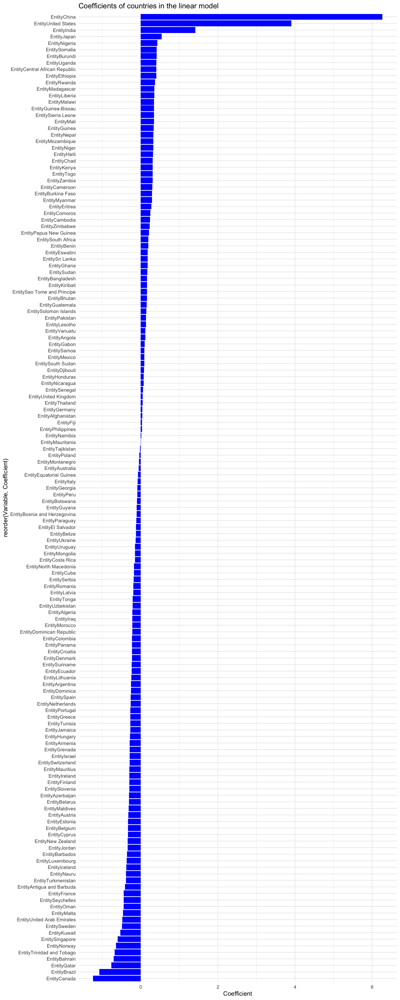

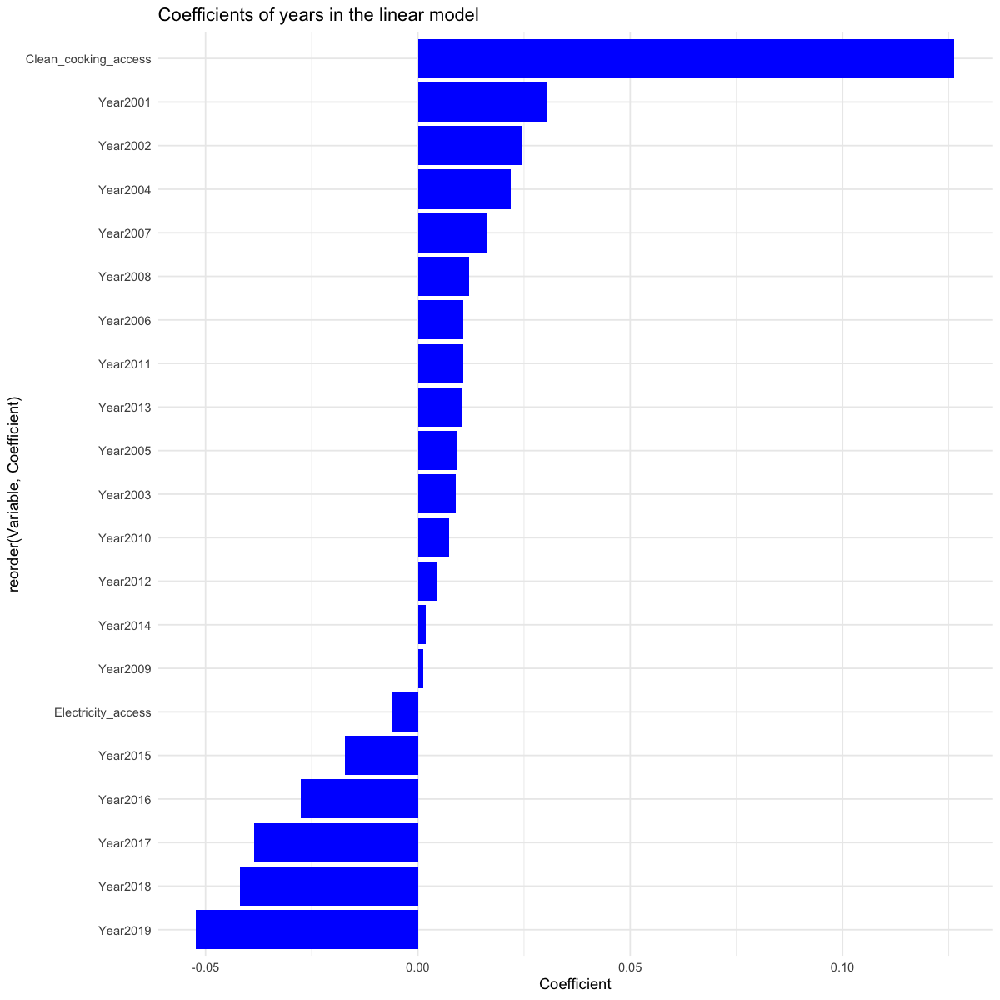

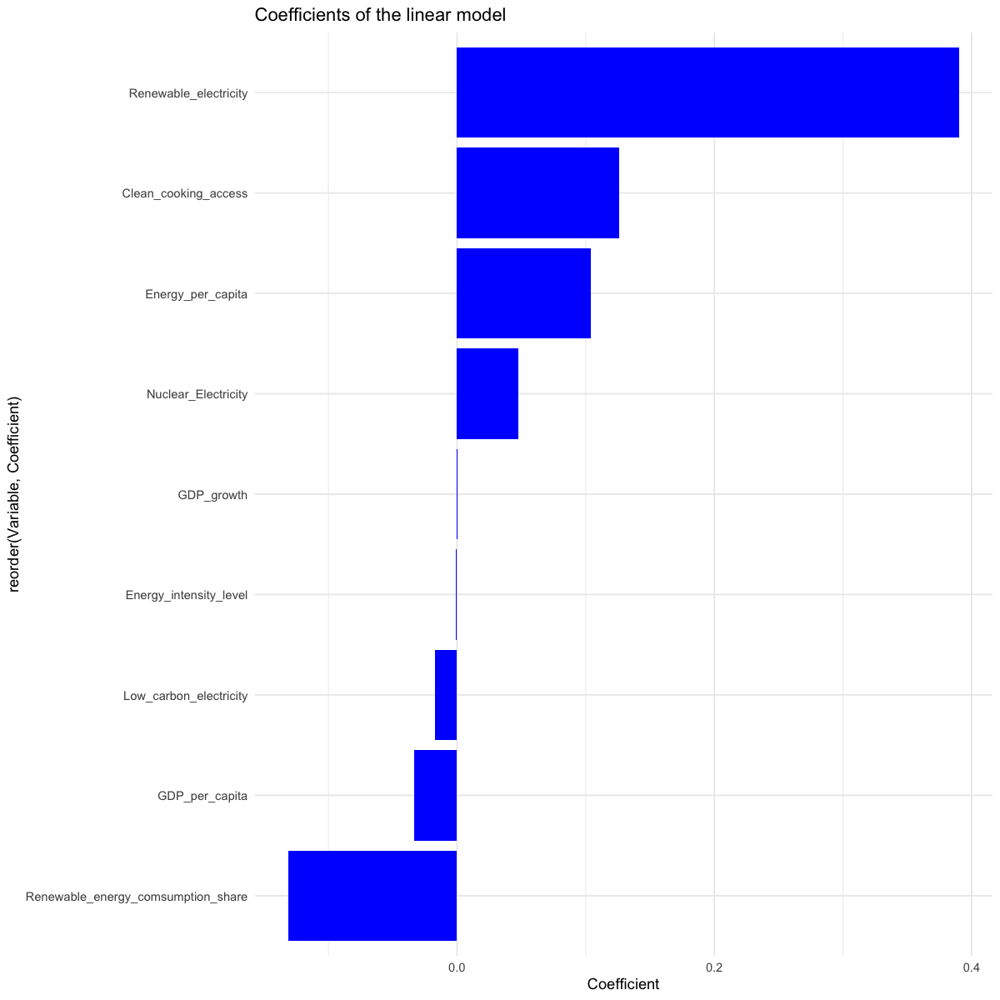

In [40]:
# Graph of Coefficients of the linear model

A <- length(countries)
B <- length(years)
C <- length(coef_lm2)

#----------------#

coef_df2_countries <- data.frame(Coefficient = coef_lm2[1:A], Variable = names(coef_lm2[1:A]))
coef_df2_years <- data.frame(Coefficient = coef_lm2[(A+1):(A+1+B)], Variable = names(coef_lm2[(A+1):(A+1+B)]))
coef_df2 <- data.frame(Coefficient = coef_lm2[(A+B+1):C], Variable = names(coef_lm2[(A+B+1):C]))

#----------------#

options(repr.plot.width = 10, repr.plot.height = 25)

ggplot(coef_df2_countries, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
    geom_bar(stat = "identity", fill = "blue") +
    labs(title = "Coefficients of countries in the linear model", x = "Coefficient") +
    theme_minimal()

#----------------#

options(repr.plot.width = 10, repr.plot.height = 10)

ggplot(coef_df2_years, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
    geom_bar(stat = "identity", fill = "blue") +
    labs(title = "Coefficients of years in the linear model", x = "Coefficient") +
    theme_minimal()

ggplot(coef_df2, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
    geom_bar(stat = "identity", fill = "blue") +
    labs(title = "Coefficients of the linear model", x = "Coefficient") +
    theme_minimal()


# 3 - Lasso Regression

### 3.1 - Lasso Regression On quantitative data

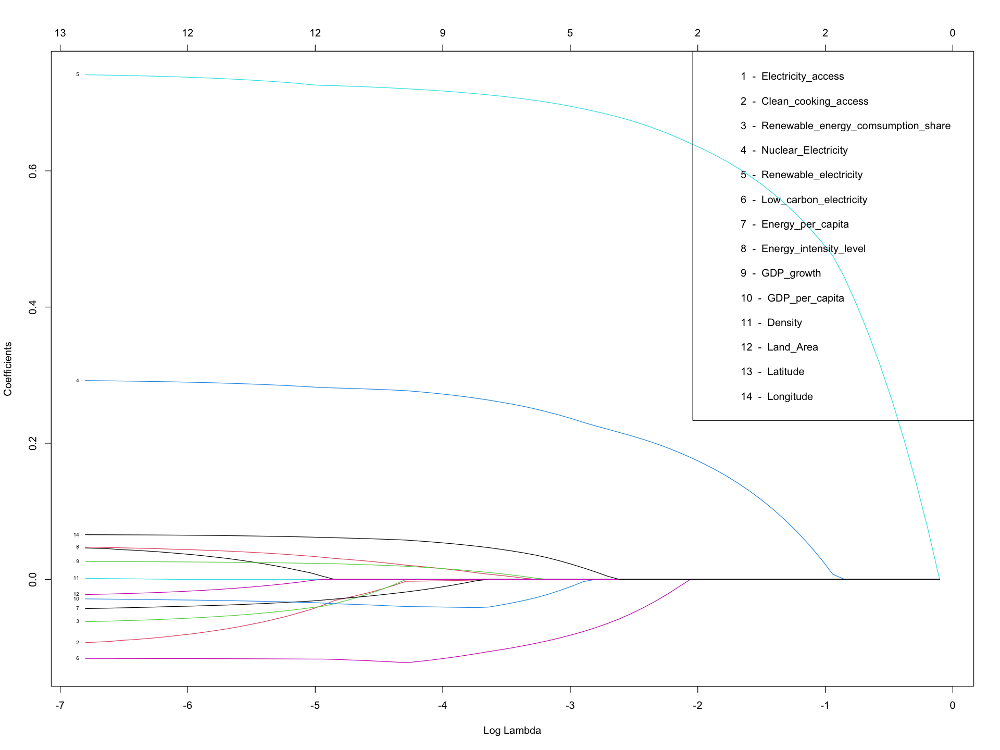

In [41]:
# Variable selection by L1 regularisation on quantitative data

options(repr.plot.width = 16, repr.plot.height = 12)

#-------------#
x.mat.1 <- as.matrix(train[,-c(1,2,11)])

reg.lasso.quanti <- glmnet(y = train[,11],
                           x = x.mat.1)
plot(reg.lasso.quanti, xvar = "lambda", label = TRUE)
legend("topright", inset = c(-0.35, 0),
       legend = paste(1:ncol(x.mat.1), " - ", colnames(x.mat.1)))

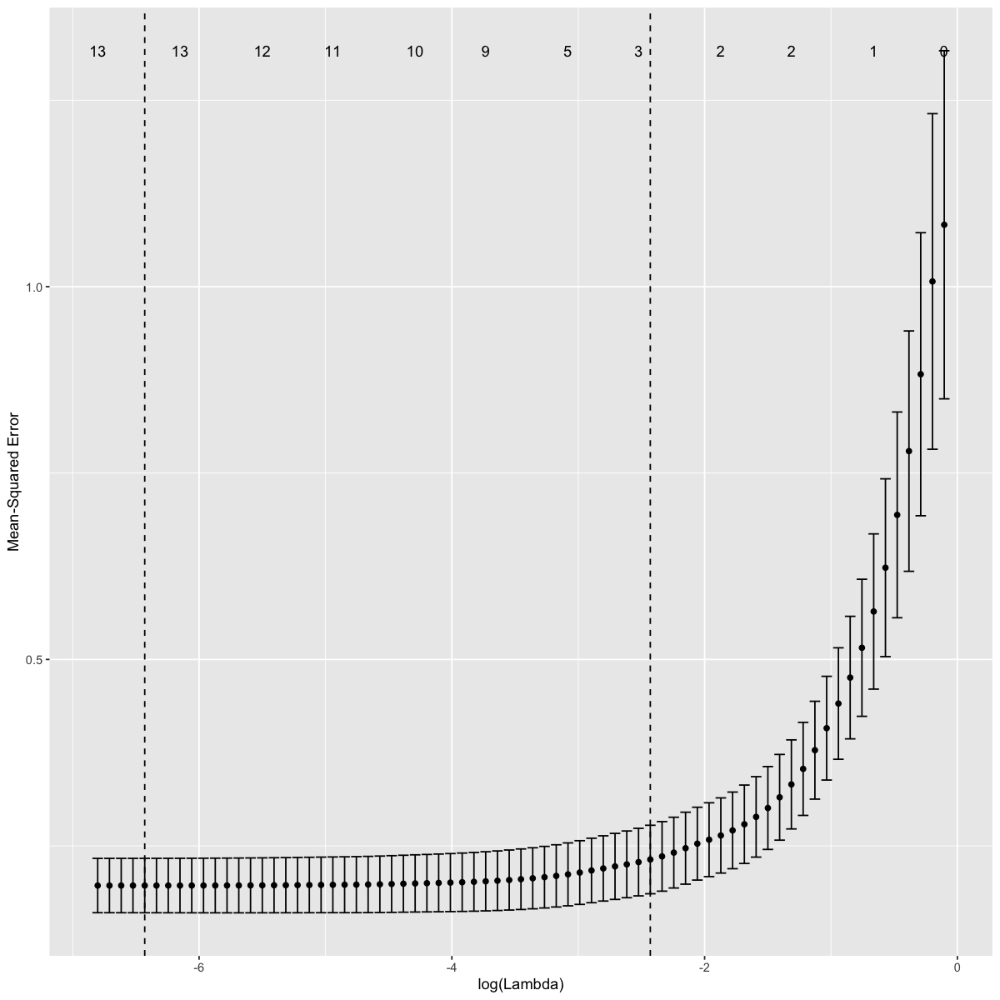

In [42]:
# Cross-validation to select the regularization parameter

options(repr.plot.width = 10, repr.plot.height = 10)

#-------------#

reg.lasso.cv <- cv.glmnet(y = train[, 11], x = x.mat.1)

autoplot(reg.lasso.cv)

[1] "CV estimate of lambda (1se) : 0.088"

[1] "CV estimate of lambda (min) : 0.002"

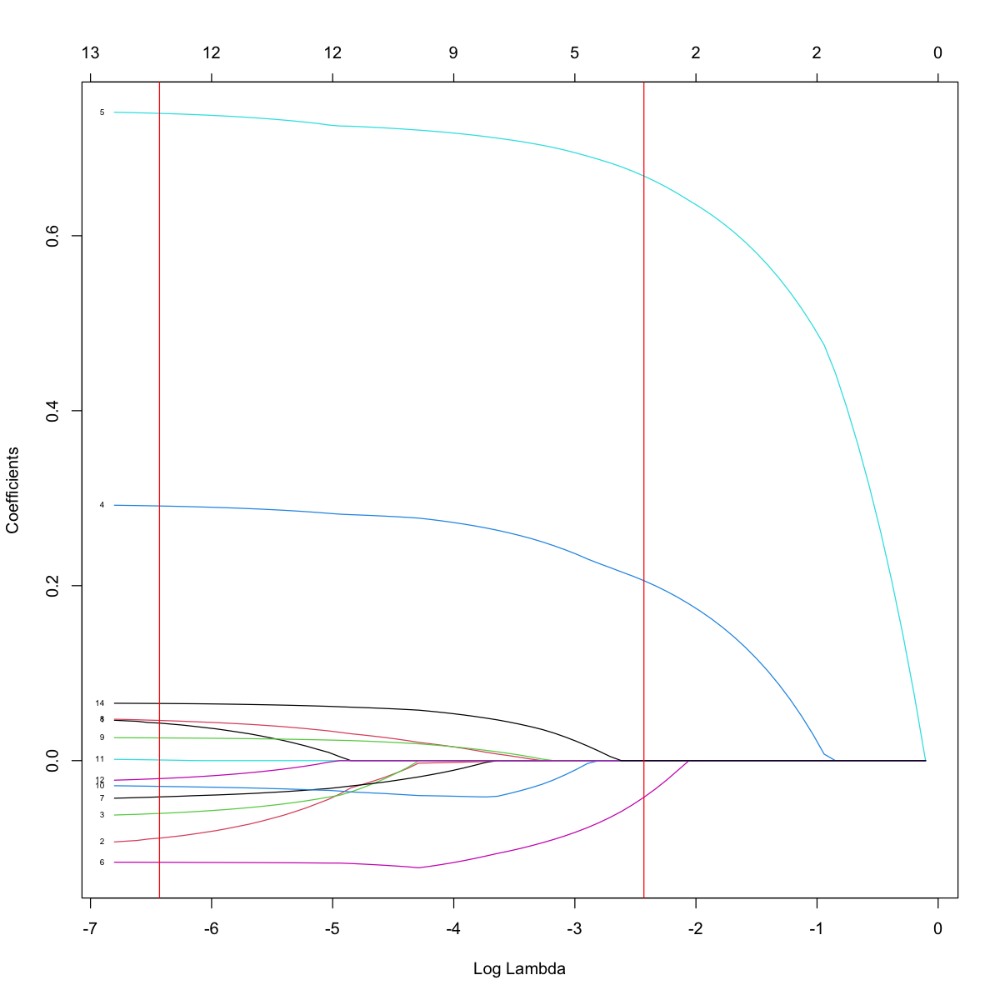

In [43]:
# CV estimate of lambda
paste("CV estimate of lambda (1se) :", round(reg.lasso.cv$lambda.1se, 3))
paste("CV estimate of lambda (min) :", round(reg.lasso.cv$lambda.min, 3))

plot(reg.lasso.quanti, xvar = "lambda", label = TRUE)
abline(v=log(reg.lasso.cv$lambda.1se),col="red")
abline(v=log(reg.lasso.cv$lambda.min),col="red")

In [44]:
# Get the model coefficients
coef_lasso_1se <- coef(reg.lasso.cv, s="lambda.1se")

# Create a vector with the corresponding coefficients and column names
coef_lasso_1se <- as.vector(coef_lasso_1se)

coef_lasso_1se

[1] -0.002095625  0.000000000  0.000000000  0.000000000  0.205739502
 [6]  0.668254499 -0.041878326  0.000000000  0.000000000  0.000000000
[11]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000

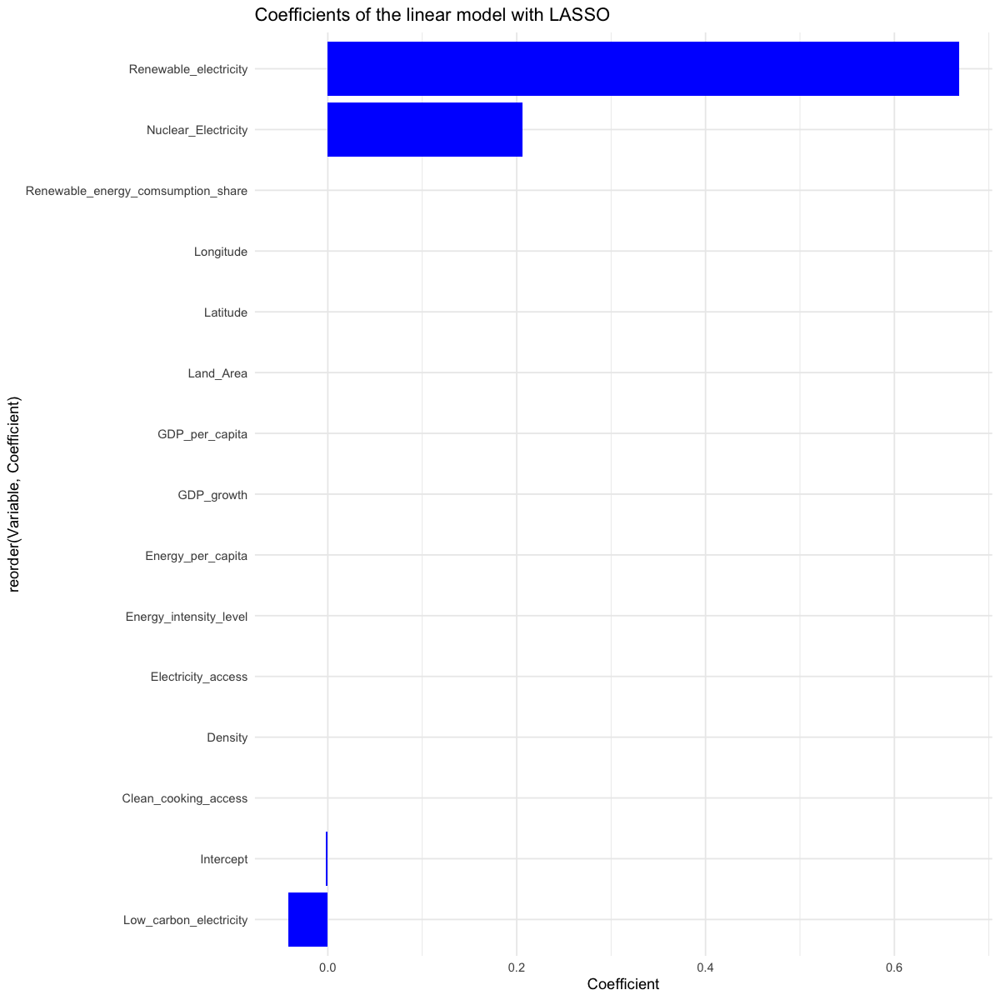

In [45]:
# Graph of Coefficients of the linear model with LASSO penalization

options(repr.plot.width = 10, repr.plot.height = 10)

#----------------#

coef_lasso_1se <- data.frame(Coefficient = coef_lasso_1se, Variable = names(coef_lm))
ggplot(coef_lasso_1se, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
  geom_bar(stat = "identity", fill = "blue") +
  labs(title = "Coefficients of the linear model with LASSO", x = "Coefficient") +
  theme_minimal()

In [46]:
# Get the model coefficients
coef_lasso_min <- coef(reg.lasso.cv, s="lambda.min")

# Create a vector with the corresponding coefficients and column names
coef_lasso_min <- as.vector(coef_lasso_min)

coef_lasso_min

[1] -0.0026128967  0.0429334564 -0.0886147369 -0.0603261760  0.2911172491
 [6]  0.7398910897 -0.1161893141 -0.0414558163  0.0459636011  0.0259901825
[11] -0.0294227073  0.0007792634 -0.0205388575  0.0000000000  0.0653506043

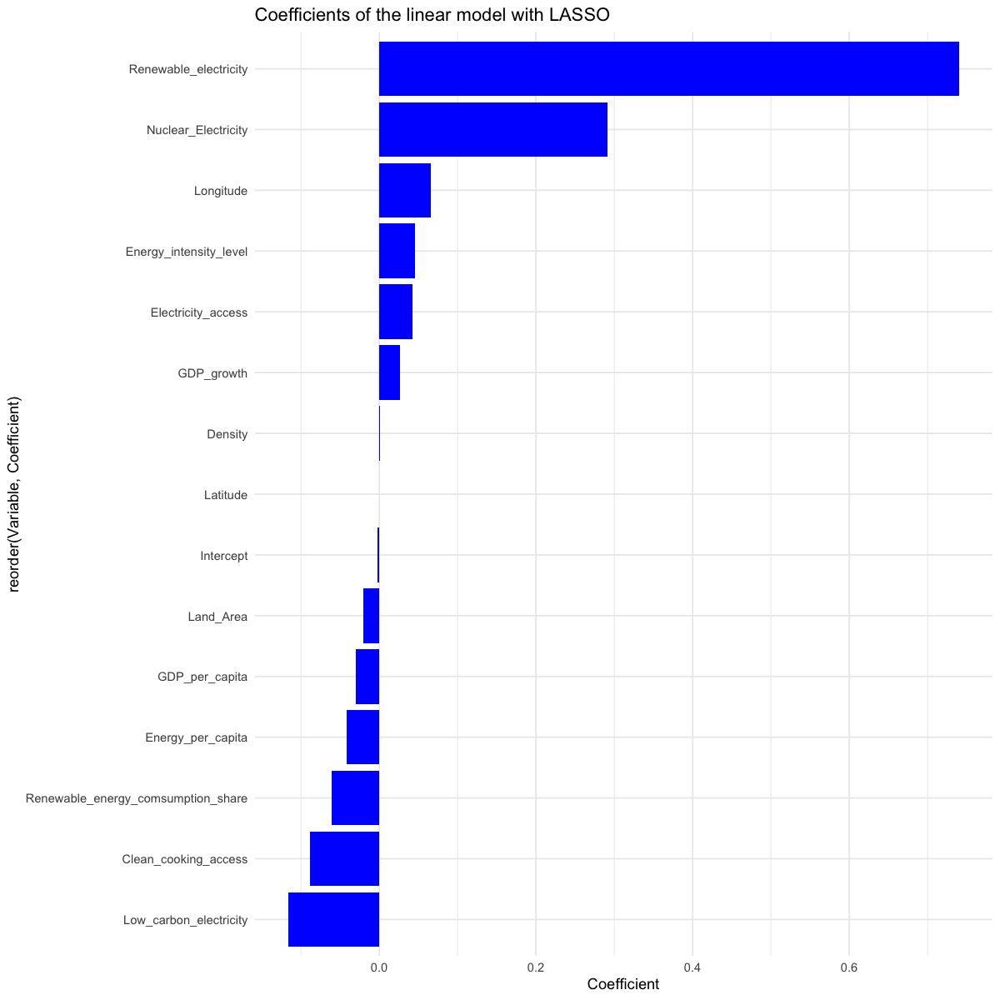

In [47]:
# Graph of Coefficients of the linear model with LASSO penalization

options(repr.plot.width = 10, repr.plot.height = 10)

#----------------#

coef_lasso_min <- data.frame(Coefficient = coef_lasso_min, Variable = names(coef_lm))
ggplot(coef_lasso_min, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
  geom_bar(stat = "identity", fill = "blue") +
  labs(title = "Coefficients of the linear model with LASSO", x = "Coefficient") +
  theme_minimal()

In [139]:
train[,-"co2_Emissions"]

ERROR: Error in -"co2_Emissions": argument incorrect pour un opérateur unitaire


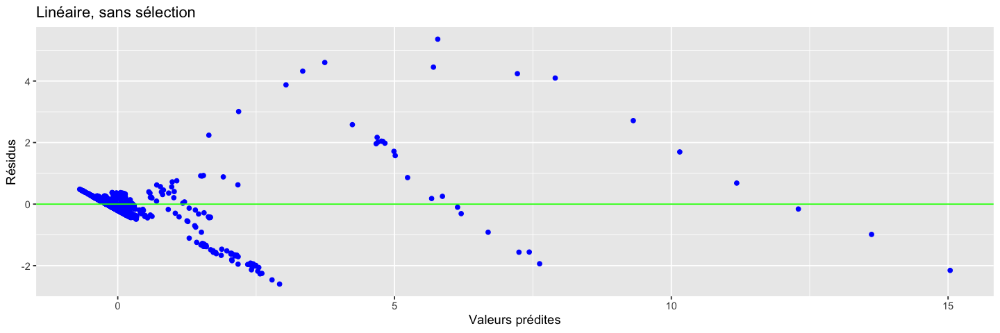

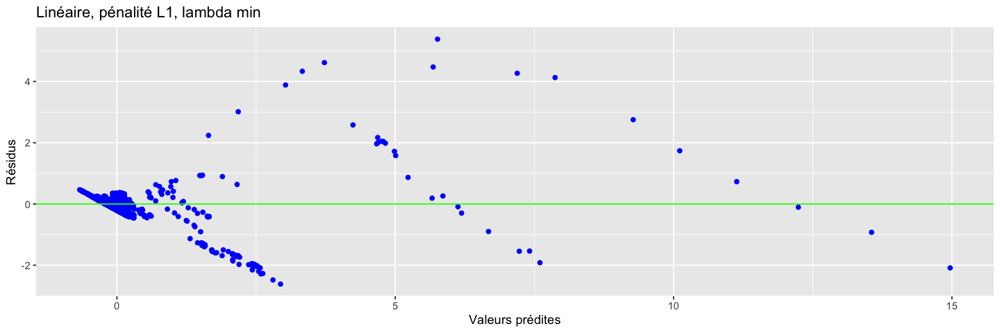

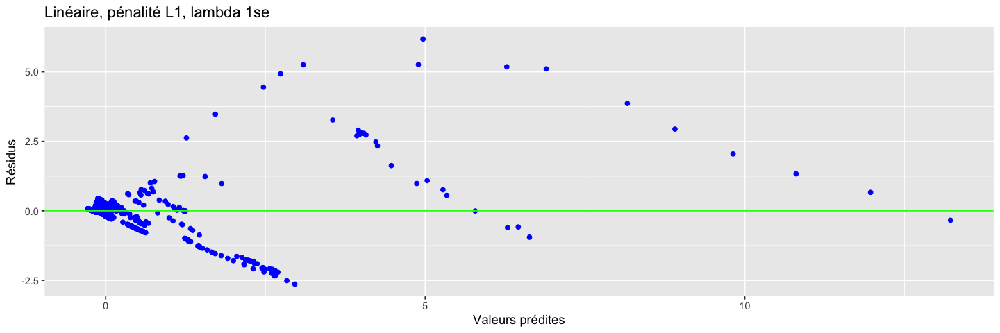

In [48]:
# Extraction of adjusted values and residuals

fit.lasso.min <- predict(reg.lasso.cv, s = "lambda.min", newx = x.mat.1)
res.lasso.min <- train$co2_Emissions - fit.lasso.min

fit.lasso.1se <- predict(reg.lasso.cv, s = "lambda.1se", newx = x.mat.1)
res.lasso.1se <- train$co2_Emissions - fit.lasso.1se 

# Residuals graph
options(repr.plot.width = 12, repr.plot.height = 4)
par(mfrow = c(1, 3))
gplot.res(fit.lm.1, res.lm.1, "Linéaire, sans sélection")
gplot.res(fit.lasso.min, res.lasso.min, "Linéaire, pénalité L1, lambda min")
gplot.res(fit.lasso.1se, res.lasso.1se, "Linéaire, pénalité L1, lambda 1se") 

In [49]:
x.mat.1.test <- as.matrix(test[,-c(1,2,11)])
fit.lasso.min.test <- predict(reg.lasso.cv, s = "lambda.min", newx = x.mat.1.test)

# Evaluate the model performance

Y_test = test[,11]
mse = MSE(Y_test,fit.lasso.min.test)
r2 = R2(Y_test,fit.lasso.min.test)
cat("LASSO with cp min : \n")
cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

results_df <- add_model_results(results_df, "LASSO on quanti cp.min",r2,mse)

LASSO with cp min : 
MSE = 0.1800102 
R2 = 0.716788 


In [50]:
fit.lasso.1se.test <- predict(reg.lasso.cv, s = "lambda.1se", newx = x.mat.1.test)

# Evaluate the model performance

Y_test = test[,11]
mse = MSE(Y_test,fit.lasso.1se.test)
r2 = R2(Y_test,fit.lasso.1se.test)
cat("LASSO with cp min : \n")
cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

results_df <- add_model_results(results_df, "LASSO on quanti cp.1se",r2,mse)

LASSO with cp min : 
MSE = 0.2126124 
R2 = 0.6654946 


### 3.2 - Lasso Regression on our complete dataset

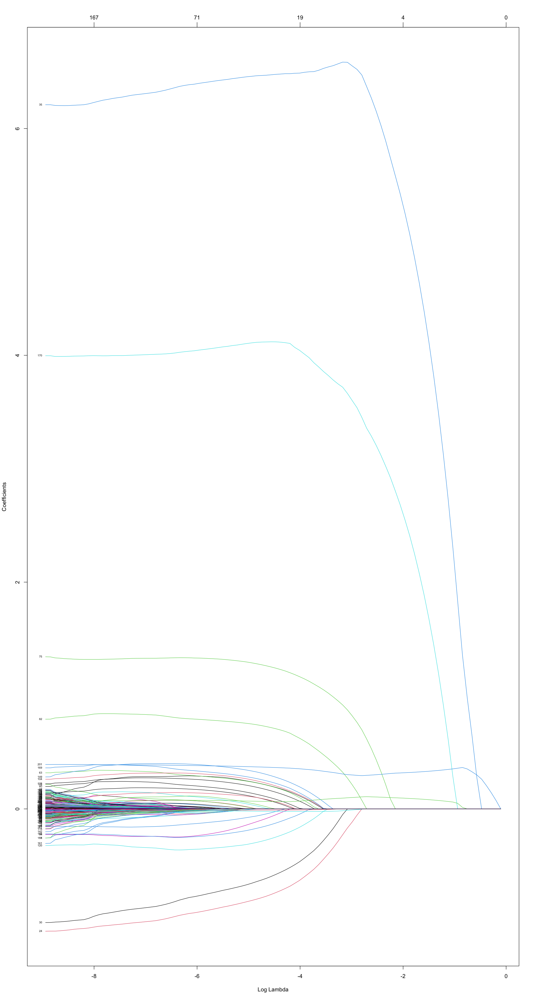

In [51]:
# Variable selection by L1 regularisation on full data

options(repr.plot.width = 16, repr.plot.height = 30)

#-------------#

x.mat.2 <- model.matrix(co2_Emissions ~ . - 1, data = train)

reg.lasso2 <- glmnet(y = train[,11],
                           x = x.mat.2)
plot(reg.lasso2, xvar = "lambda", label = TRUE)
#legend("topright", inset = c(-0.35, 0),
#       legend = paste(1:ncol(x.mat.2), " - ", colnames(x.mat.2)))

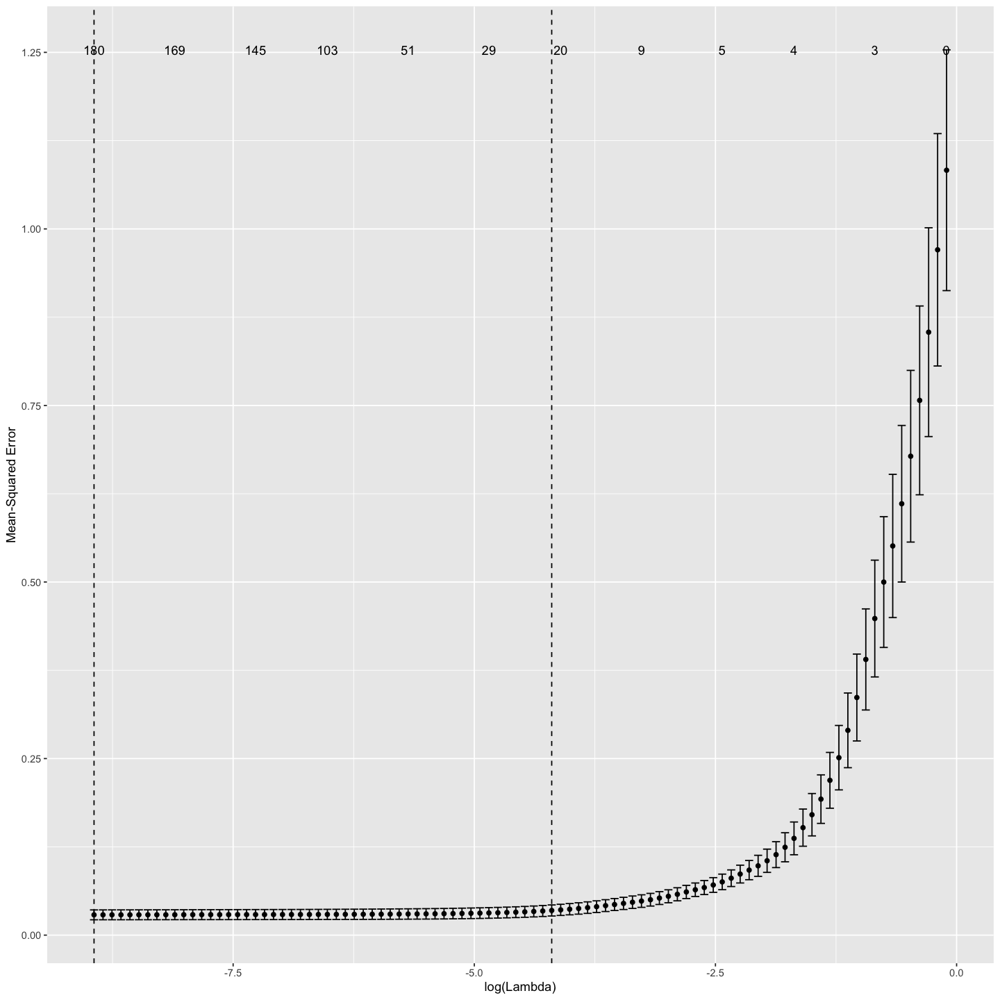

In [52]:
# Cross-validation to select the regularization parameter

options(repr.plot.width = 12, repr.plot.height = 12)

#-------------#

reg.lasso.cv2 <- cv.glmnet(y = train[, 11], x = x.mat.2)

autoplot(reg.lasso.cv2)

[1] "CV estimate of lambda : 0.015"

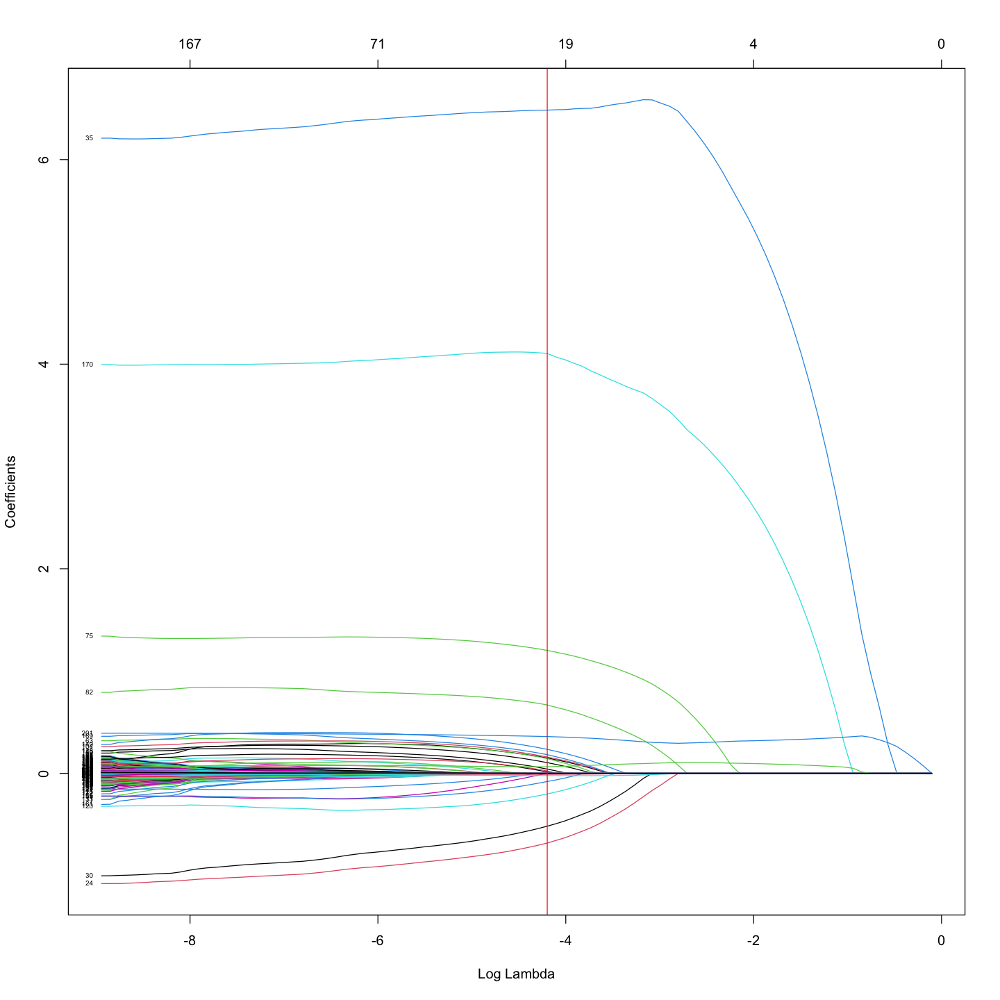

In [53]:
# CV estimate of lambda
paste("CV estimate of lambda :", round(reg.lasso.cv2$lambda.1se, 3))

plot(reg.lasso2, xvar = "lambda", label = TRUE)
abline(v=log(reg.lasso.cv2$lambda.1se),col="red")

In [54]:
# Get the model coefficients
coef_lasso2 <- coef(reg.lasso.cv2, s="lambda.1se")

# Create a vector with the corresponding coefficients and column names
coef_lasso2 <- as.vector(coef_lasso2)

coef_lasso2

[1] -0.081424088  0.000000000  0.000000000  0.000000000  0.000000000
  [6]  0.000000000  0.000000000  0.000000000  0.000000000  0.149412430
 [11]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [16]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [21]  0.000000000  0.000000000  0.000000000  0.000000000 -0.681671092
 [26]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [31] -0.516830870  0.000000000  0.000000000  0.000000000  0.000000000
 [36]  6.483380827  0.000000000  0.000000000  0.000000000  0.000000000
 [41]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [46]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [51]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [56]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [61]  0.000000000  0.000000000  0.000000000  0.143610425  0.000000000
 [66]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [71]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [76]  1.201158502  0.000000000  0.000000000  0.000000000  0.000000000
 [81]  0.041175626  0.000000000  0.668071747  0.000000000  0.000000000
 [86]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [91]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
 [96]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[101]  0.000000000  0.000000000  0.000000000  0.000000000  0.159168935
[106]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[111]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[116]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[121] -0.202132933  0.000000000  0.000000000  0.000000000  0.000000000
[126]  0.000000000  0.000000000  0.000000000  0.104394495  0.000000000
[131]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[136]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[141]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[146]  0.000000000  0.000000000  0.000000000  0.000000000  0.234131549
[151]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[156] -0.080142099  0.000000000  0.000000000  0.012689953  0.000000000
[161]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[166]  0.000000000  0.000000000  0.023200329  0.000000000  0.182280793
[171]  4.104795956  0.000000000  0.000000000  0.000000000  0.000000000
[176]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[181]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[186]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[191]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[196]  0.000000000  0.000000000  0.000000000  0.000000000 -0.009905338
[201]  0.064097166  0.359518471 -0.022436255  0.000000000  0.000000000
[206]  0.000000000  0.000000000  0.000000000  0.000000000  0.000000000
[211]  0.000000000

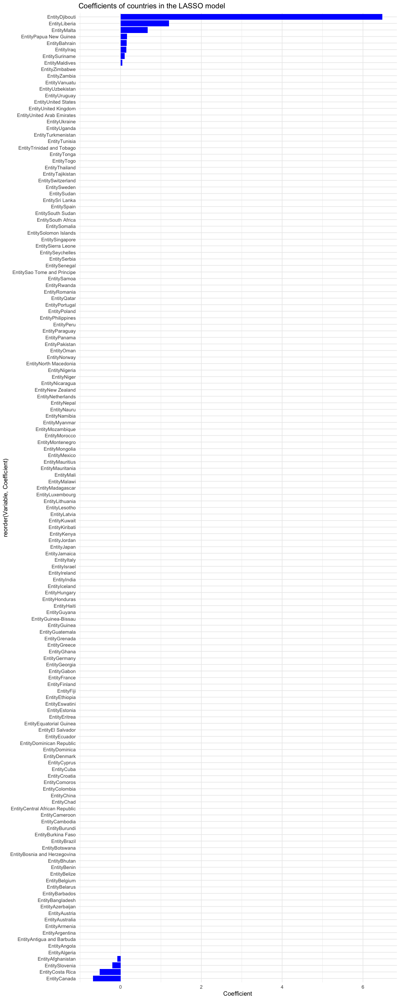

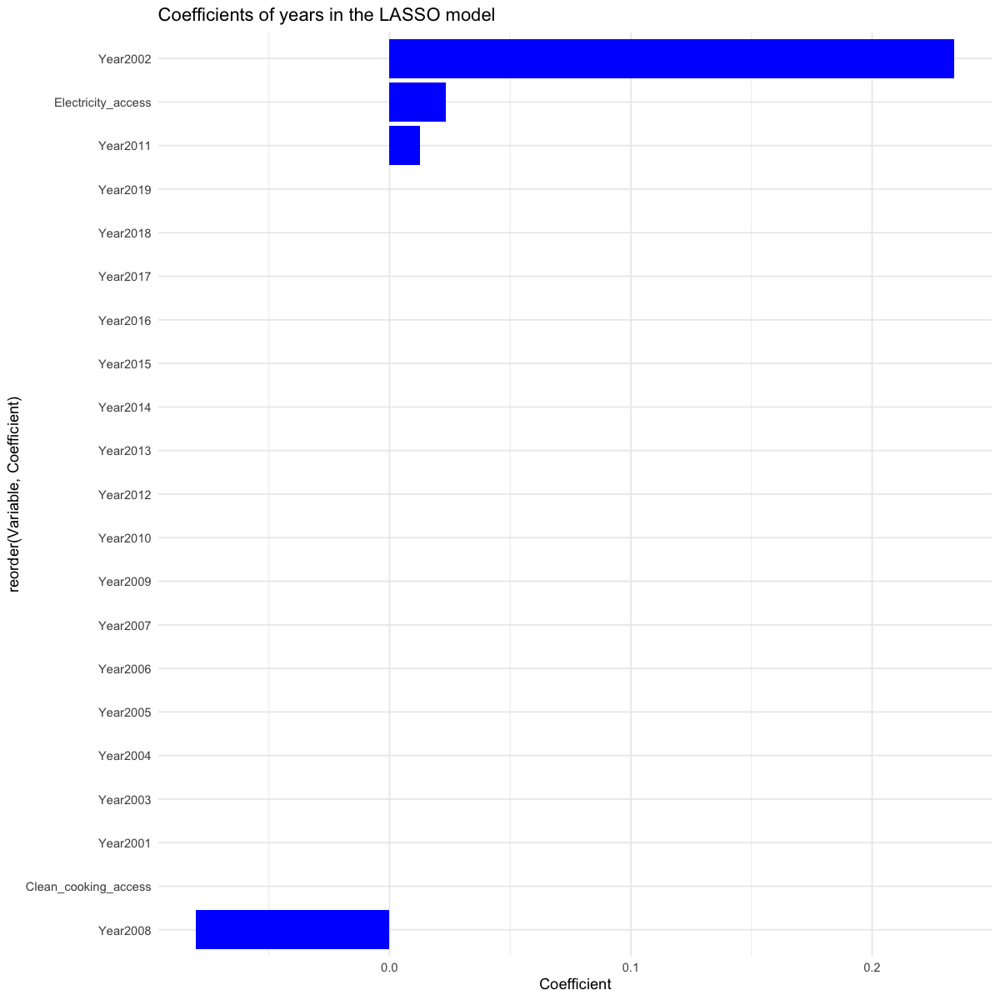

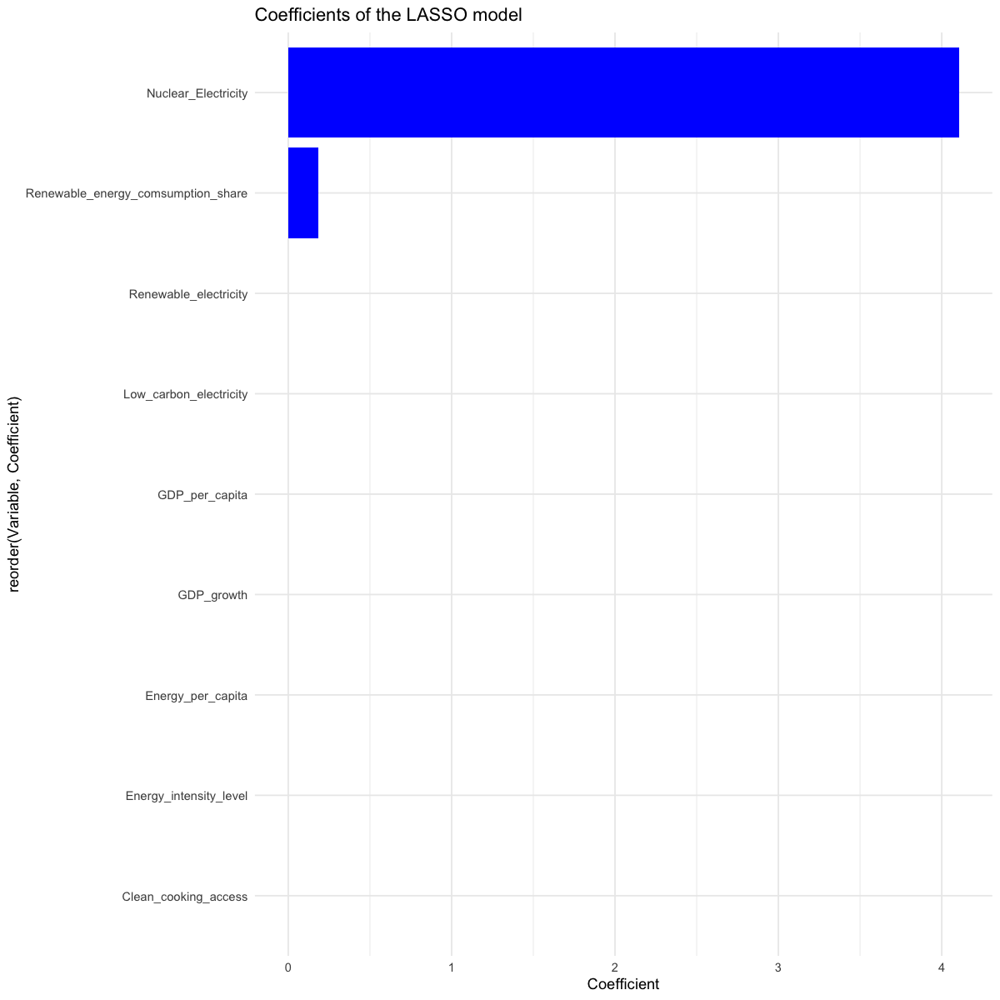

In [55]:
# Graph of Coefficients of the linear model with LASSO penalization

#----------------#

coef_lasso2_countries <- data.frame(Coefficient = coef_lasso2[1:A], Variable = names(coef_lm2[1:A]))
coef_lasso2_years <- data.frame(Coefficient = coef_lasso2[(A+1):(A+1+B)], Variable = names(coef_lm2[(A+1):(A+1+B)]))
coef_lasso2 <- data.frame(Coefficient = coef_lasso2[(A+B+1):C], Variable = names(coef_lm2[(A+B+1):C]))

#----------------#

options(repr.plot.width = 10, repr.plot.height = 25)

ggplot(coef_lasso2_countries, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
    geom_bar(stat = "identity", fill = "blue") +
    labs(title = "Coefficients of countries in the LASSO model", x = "Coefficient") +
    theme_minimal()

#----------------#

options(repr.plot.width = 10, repr.plot.height = 10)

ggplot(coef_lasso2_years, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
    geom_bar(stat = "identity", fill = "blue") +
    labs(title = "Coefficients of years in the LASSO model", x = "Coefficient") +
    theme_minimal()

ggplot(coef_lasso2, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
    geom_bar(stat = "identity", fill = "blue") +
    labs(title = "Coefficients of the LASSO model", x = "Coefficient") +
    theme_minimal()


[1] "CV estimate of lambda : 0.000131"

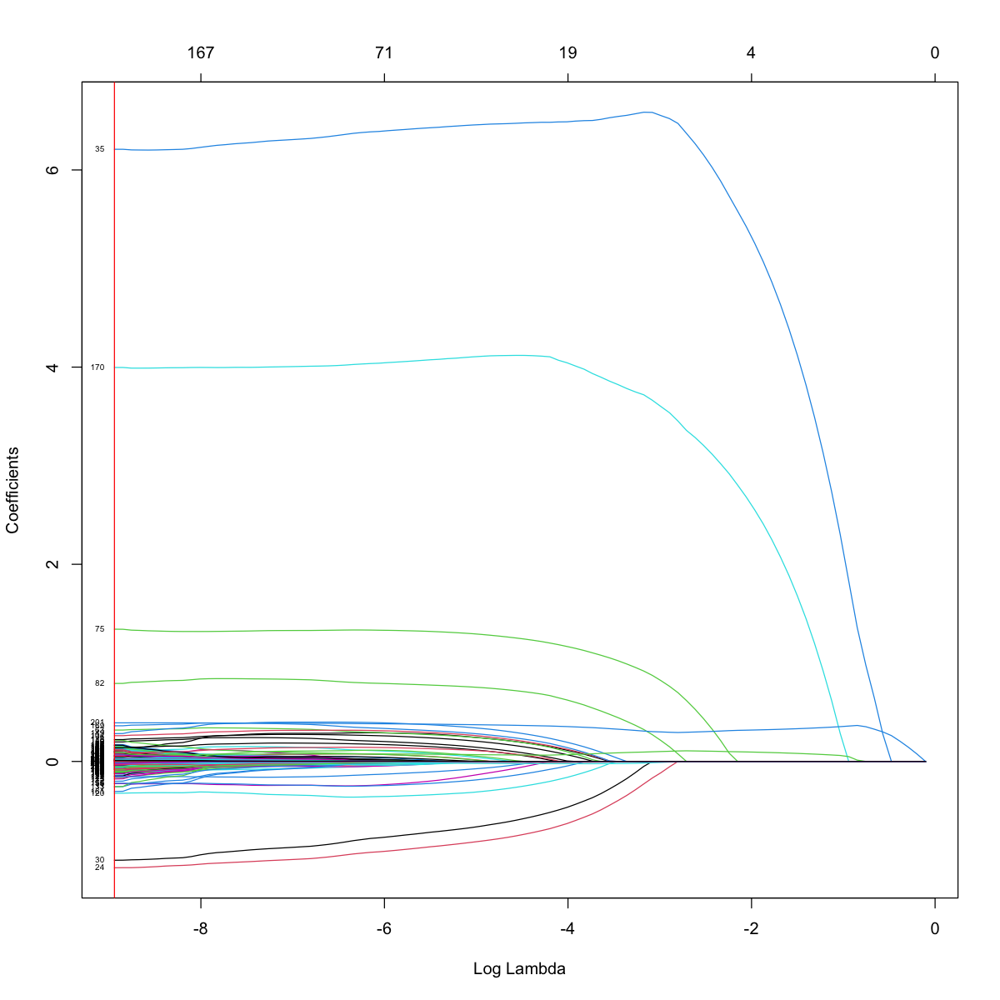

In [56]:
# CV estimate of lambda
paste("CV estimate of lambda :", round(reg.lasso.cv2$lambda.min, 6))

plot(reg.lasso2, xvar = "lambda", label = TRUE)
abline(v=log(reg.lasso.cv2$lambda.min),col="red")

In [57]:
# Get the model coefficients
coef_lasso2_2 <- coef(reg.lasso.cv2, s="lambda.min")

# Create a vector with the corresponding coefficients and column names
coef_lasso2_2 <- as.vector(coef_lasso2_2)

coef_lasso2_2

[1] -9.087111e-02 -6.641239e-04  0.000000e+00 -1.696818e-02  4.050425e-02
  [6] -1.387752e-01 -1.141623e-01 -7.772246e-02  0.000000e+00  1.011042e-01
 [11] -4.800530e-02 -8.874444e-02  0.000000e+00 -2.563538e-01  9.274406e-02
 [16] -9.714315e-02 -5.810962e-02  5.409556e-03 -2.809038e-03  4.410410e-02
 [21]  0.000000e+00  1.011303e-01 -3.312548e-02 -8.033880e-02 -1.078604e+00
 [26]  0.000000e+00  1.089073e-01  1.733597e-01  7.498772e-02  1.225789e-01
 [31] -1.002044e+00  0.000000e+00  1.635379e-01  1.018088e-01  0.000000e+00
 [36]  6.209654e+00 -1.101046e-01  5.655723e-02  0.000000e+00 -4.594687e-03
 [41] -1.739727e-02 -1.763873e-02 -6.671028e-02  0.000000e+00  6.214602e-02
 [46] -1.415464e-02 -7.647573e-02 -4.739011e-02 -7.146233e-02  0.000000e+00
 [51] -7.506854e-03 -6.891415e-02  8.850865e-02 -6.541657e-02  6.458866e-02
 [56]  1.549851e-01 -4.336177e-02 -1.988304e-02 -2.254841e-01  0.000000e+00
 [61]  8.992533e-02  0.000000e+00 -4.816348e-03  3.182590e-01  5.478284e-02
 [66] -6.458355e-03 -8.556500e-02  9.385395e-02  1.312466e-01  1.281637e-01
 [71] -4.667124e-02  1.456321e-01  4.962707e-02 -3.119786e-02 -4.290779e-02
 [76]  1.341617e+00  0.000000e+00 -1.444740e-02  2.956972e-02 -4.033452e-03
 [81]  1.977469e-01 -8.361555e-02  7.911510e-01 -1.083488e-01  0.000000e+00
 [86]  1.079944e-01  4.212236e-02 -1.483584e-01  0.000000e+00  8.182833e-03
 [91]  0.000000e+00  2.329339e-02  1.216768e-01  0.000000e+00 -1.227492e-02
 [96]  5.400925e-02  1.046642e-01  1.224243e-01  0.000000e+00 -1.003752e-01
[101]  1.267701e-01 -1.226831e-01 -1.533475e-02 -1.221399e-01  2.615387e-01
[106] -1.062068e-01  1.580605e-02 -2.963075e-02  7.411684e-02  1.063132e-01
[111] -2.755438e-02 -1.720941e-01  1.623305e-01  9.342365e-02  0.000000e+00
[116] -1.777854e-01  4.702345e-02  1.074977e-01  2.165735e-01 -4.946607e-02
[121] -3.225556e-01 -1.574230e-01  8.433295e-02 -5.838486e-02  2.449483e-02
[126] -1.529791e-01 -5.583165e-02  8.226247e-03  2.218035e-01 -3.495540e-02
[131]  0.000000e+00 -2.563331e-01 -2.004496e-02  1.491442e-01  0.000000e+00
[136]  0.000000e+00  0.000000e+00  2.830772e-02  1.520577e-02  0.000000e+00
[141]  1.573866e-02 -3.993183e-02 -2.012182e-01  1.357211e-01 -1.534578e-02
[146]  0.000000e+00 -4.020247e-02 -1.873130e-02  1.457049e-01  2.821627e-01
[151] -3.276279e-02 -5.063878e-03  5.962813e-02  5.441099e-02 -7.747562e-02
[156] -2.208414e-01  2.251584e-02  4.406880e-03  1.379510e-01  1.197216e-01
[161] -1.100289e-01 -3.045942e-01 -6.291157e-02  0.000000e+00 -1.239664e-01
[166]  0.000000e+00  1.654570e-01  8.382857e-02 -8.500735e-02  3.619183e-01
[171]  3.996438e+00 -3.687285e-02 -2.106249e-02 -2.962899e-02  0.000000e+00
[176]  9.268374e-02  7.008522e-02  2.520853e-02  2.090287e-02  9.121631e-03
[181]  2.579698e-02  1.657441e-02  2.075043e-02  3.042342e-02  2.824709e-02
[186]  1.531851e-02  2.517558e-02  3.211354e-02  2.639075e-02  3.450696e-02
[191]  2.595946e-02  7.236692e-03  0.000000e+00 -1.010789e-02 -9.954724e-03
[196] -2.001673e-02  0.000000e+00  5.139371e-05  2.076686e-02 -7.506352e-02
[201]  6.205859e-02  3.917573e-01 -1.691586e-02  6.405536e-02  9.251940e-04
[206] -3.070087e-04 -5.285459e-02 -1.896633e-02  2.029345e-02 -2.287329e-02
[211]  1.018013e-02

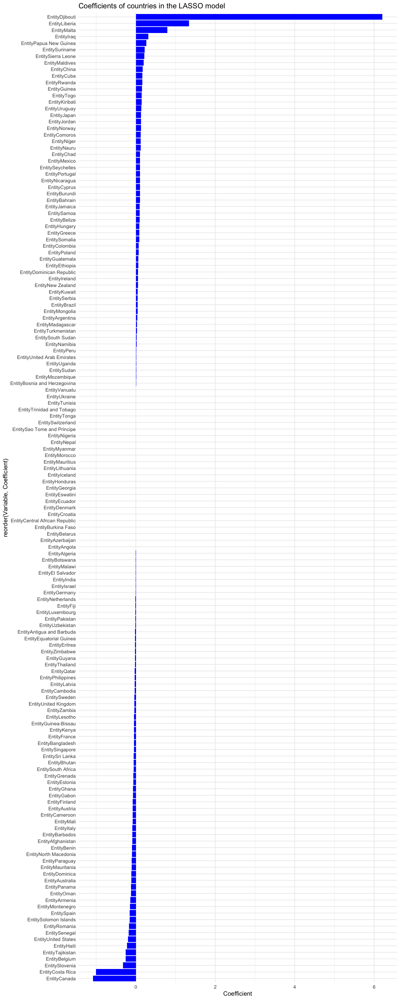

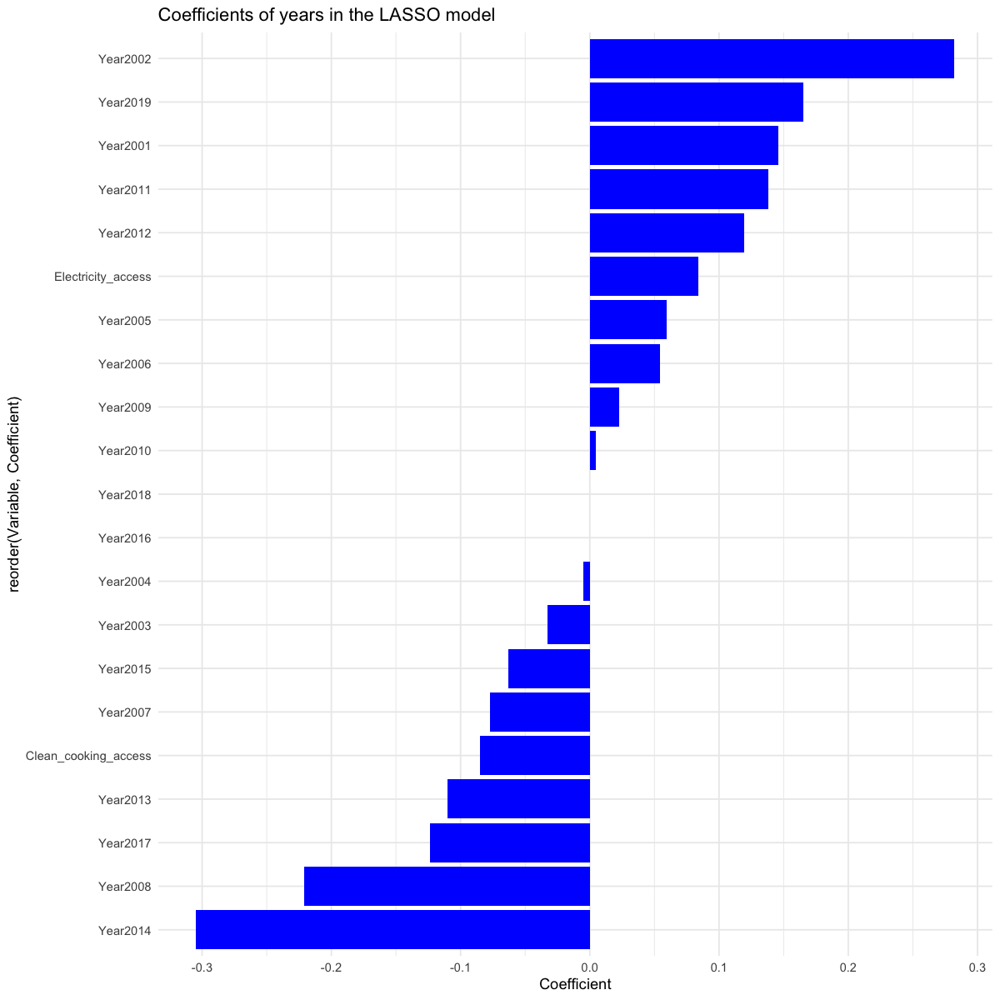

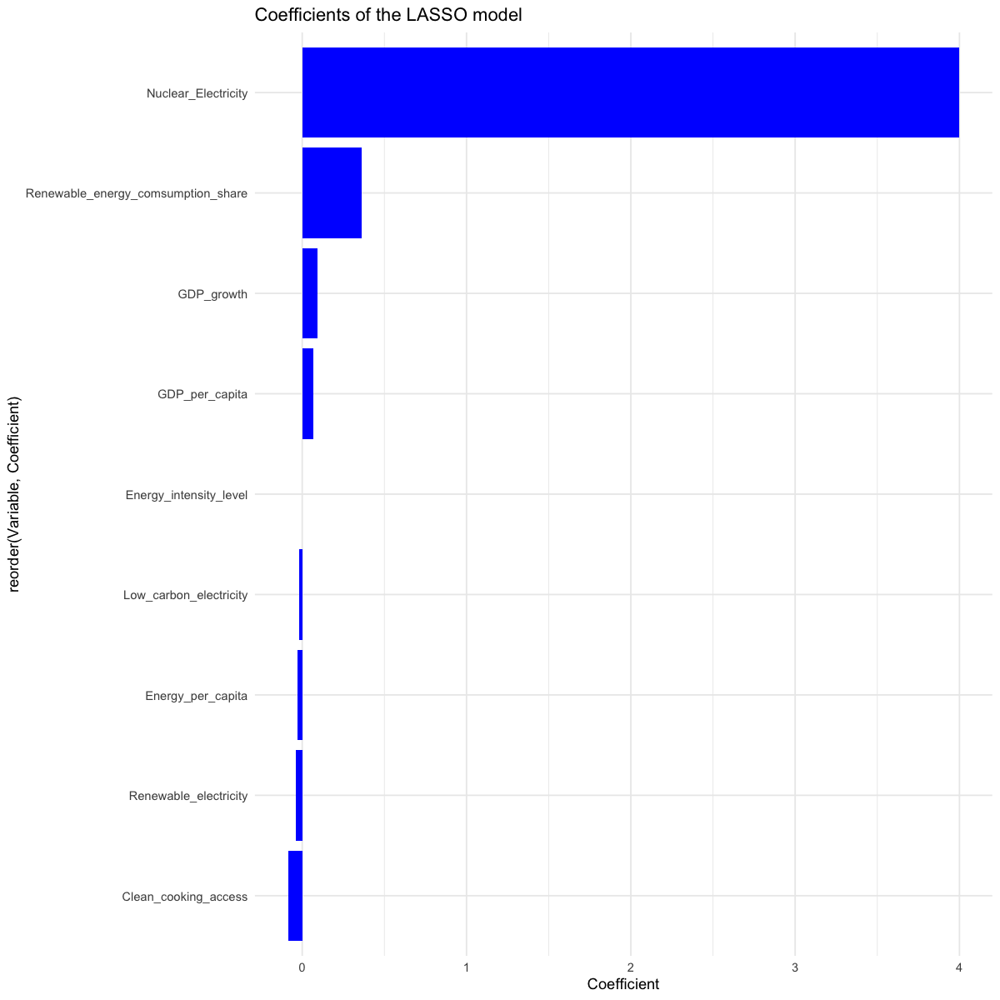

In [58]:
# Graph of Coefficients of the linear model with LASSO penalization

#----------------#

coef_lasso2_2_countries <- data.frame(Coefficient = coef_lasso2_2[1:A], Variable = names(coef_lm2[1:A]))
coef_lasso2_2_years <- data.frame(Coefficient = coef_lasso2_2[(A+1):(A+1+B)], Variable = names(coef_lm2[(A+1):(A+1+B)]))
coef_lasso2_2 <- data.frame(Coefficient = coef_lasso2_2[(A+B+1):C], Variable = names(coef_lm2[(A+B+1):C]))

#----------------#

options(repr.plot.width = 10, repr.plot.height = 25)

ggplot(coef_lasso2_2_countries, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
    geom_bar(stat = "identity", fill = "blue") +
    labs(title = "Coefficients of countries in the LASSO model", x = "Coefficient") +
    theme_minimal()

#----------------#

options(repr.plot.width = 10, repr.plot.height = 10)

ggplot(coef_lasso2_2_years, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
    geom_bar(stat = "identity", fill = "blue") +
    labs(title = "Coefficients of years in the LASSO model", x = "Coefficient") +
    theme_minimal()

ggplot(coef_lasso2_2, aes(x = Coefficient, y = reorder(Variable, Coefficient))) +
    geom_bar(stat = "identity", fill = "blue") +
    labs(title = "Coefficients of the LASSO model", x = "Coefficient") +
    theme_minimal()


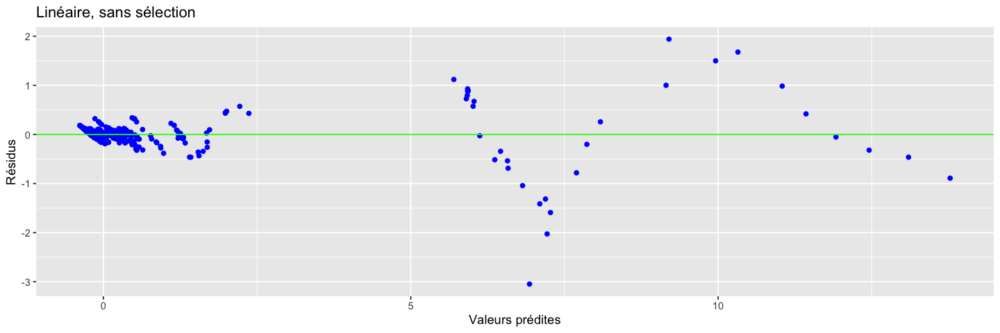

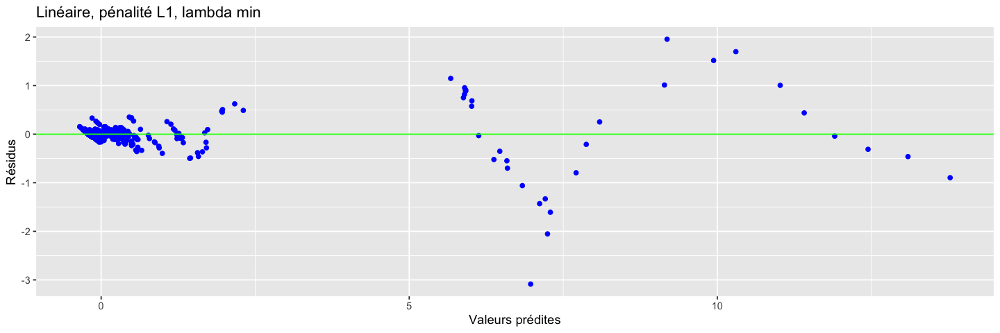

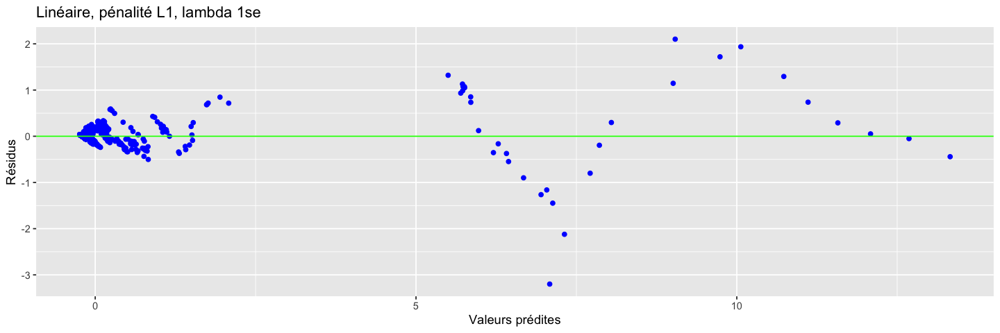

In [59]:
# Extraction of adjusted values and residuals

fit.lasso2.min <- predict(reg.lasso.cv2, s = "lambda.min", newx = x.mat.2)
res.lasso2.min <- train$co2_Emissions - fit.lasso2.min

fit.lasso2.1se <- predict(reg.lasso.cv2, s = "lambda.1se", newx = x.mat.2)
res.lasso2.1se <- train$co2_Emissions - fit.lasso2.1se 

# Residuals graph

options(repr.plot.width = 12, repr.plot.height = 4)
par(mfrow = c(1, 3))
gplot.res(fit.lm.2, res.lm.2, "Linéaire, sans sélection")
gplot.res(fit.lasso2.min, res.lasso2.min, "Linéaire, pénalité L1, lambda min")
gplot.res(fit.lasso2.1se, res.lasso2.1se, "Linéaire, pénalité L1, lambda 1se") 

In [60]:
V=10 ; nV=floor(nrow(train)/V)
S=sample(1:nrow(train),replace=FALSE)
error.CV = c()
for(v in 1:V)
{ # Rq : les deux dernières obs sont tjs dans l'échantillon d'apprentissage...
    train.learn=train[-c(S[(nV*(v-1)):(nV*v)]),] 
    train.valid=train[c(S[(nV*(v-1)):(nV*v)]),]
    error.CV=c(error.CV,mean((train.valid$co2_Emissions-predict(aov(co2_Emissions ~ ., data=train.learn),newdata=train.valid))^2))
}
mean(error.CV)

[1] 0.02854397

In [61]:
x.mat.2.test <- model.matrix(co2_Emissions ~ . - 1, data = test)
fit.lasso2.min.test <- predict(reg.lasso.cv2, s = "lambda.min", newx = x.mat.2.test)

# Evaluate the model performance

Y_test = test[,11]
mse = MSE(Y_test,fit.lasso2.min.test)
r2 = R2(Y_test,fit.lasso2.min.test)
cat("LASSO with cp min : \n")
cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

results_df <- add_model_results(results_df, "LASSO on full data cp.min",r2,mse)

LASSO with cp min : 
MSE = 0.03861702 
R2 = 0.9392434 


In [62]:
fit.lasso2.1se.test <- predict(reg.lasso.cv2, s = "lambda.1se", newx = x.mat.2.test)

# Evaluate the model performance

mse = MSE(Y_test,fit.lasso2.1se.test)
r2 = R2(Y_test,fit.lasso2.1se.test)
cat("LASSO with cp 1se : \n")
cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

results_df <- add_model_results(results_df, "LASSO on full data cp.1se",r2,mse)

LASSO with cp 1se : 
MSE = 0.04511126 
R2 = 0.929026 


# 4 - Support Vector Regression

In [63]:
library(e1071)

In [64]:
svm.reg0 = svm(co2_Emissions~.,data=train)
summary(svm.reg0)


Call:
svm(formula = co2_Emissions ~ ., data = train)


Parameters:
   SVM-Type:  eps-regression 
 SVM-Kernel:  radial 
       cost:  1 
      gamma:  0.004761905 
    epsilon:  0.1 


Number of Support Vectors:  322






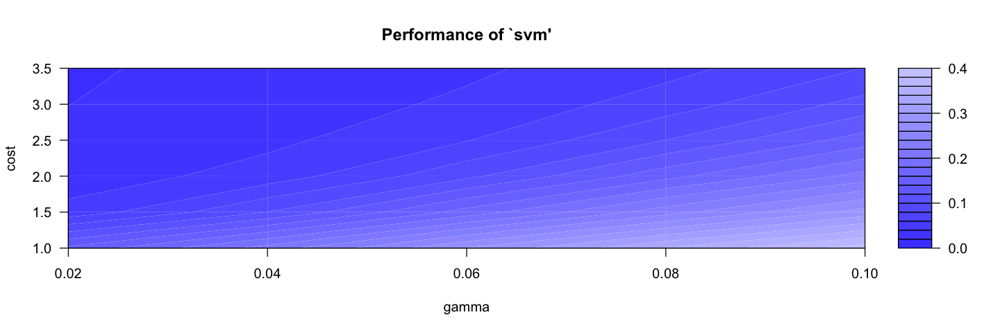

In [65]:
#set.seed(2021)
svm.reg.tune = tune.svm(co2_Emissions~., data = train, cost = c(1, 1.5, 2, 2.5, 3, 3.5), 
    gamma = seq(0.02, 0.1, by = 0.02))
plot(svm.reg.tune)

In [66]:
best_cost <- svm.reg.tune$best.parameters$cost
best_gamma <- svm.reg.tune$best.parameters$gamm
svm_param<-svm(co2_Emissions~., data = train, cost = best_cost, 
    gamma = best_gamma)
summary(svm_param)


Call:
svm(formula = co2_Emissions ~ ., data = train, cost = best_cost, 
    gamma = best_gamma)


Parameters:
   SVM-Type:  eps-regression 
 SVM-Kernel:  radial 
       cost:  3.5 
      gamma:  0.02 
    epsilon:  0.1 


Number of Support Vectors:  244






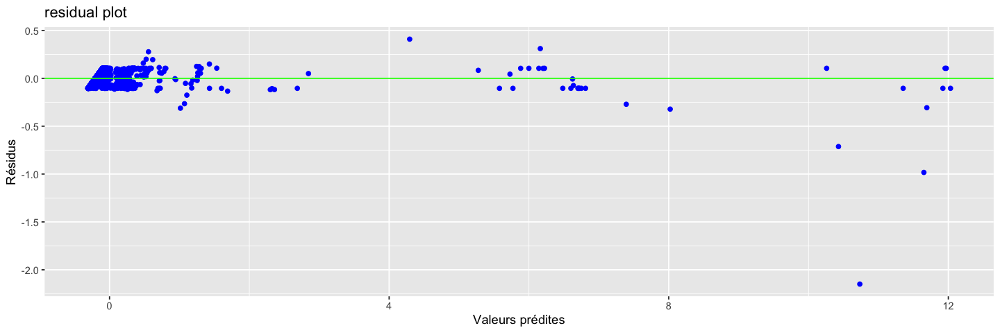

In [67]:
# calcul et graphe des résidus
fit.svmr=fit.svmr=svm_param$fitted
res.svmr=fit.svmr-train[,"co2_Emissions"]
gplot.res(fit.svmr,res.svmr,titre="residual plot")

In [68]:
pred.svmr=predict(svm_param,newdata=test)
# Erreur quadratique moyenne de prévision
sum((pred.svmr-test[,"co2_Emissions"])^2)/nrow(test)
r_squared<-R2(test[,"co2_Emissions"],pred.svmr)
cat("r score : ",r_squared,"\n")

[1] 0.009644275

r score :  0.9848266 


In [69]:
svm_model <- svm(co2_Emissions ~ ., data = X_train_P)
summary(svm_model)


Call:
svm(formula = co2_Emissions ~ ., data = X_train_P)


Parameters:
   SVM-Type:  eps-regression 
 SVM-Kernel:  radial 
       cost:  1 
      gamma:  0.004739336 
    epsilon:  0.1 


Number of Support Vectors:  260






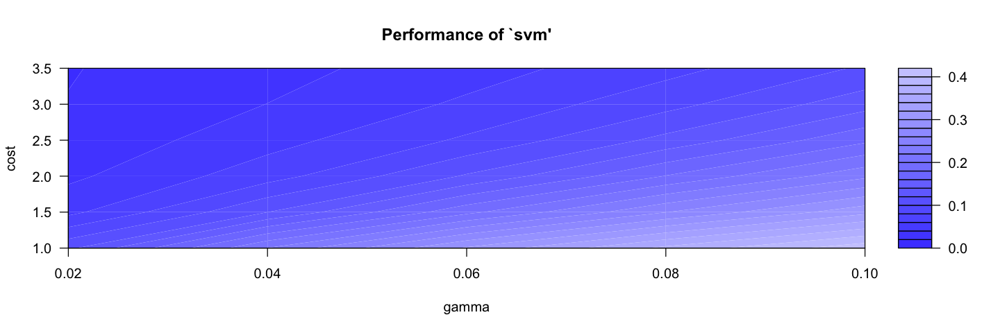

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘EntityChile’ and ‘EntityCongo’ and ‘EntityCzechia’ and ‘EntityEgypt’ and ‘EntityFrench.Guiana’ and ‘EntityGambia’ and ‘EntityIndonesia’ and ‘EntityKazakhstan’ and ‘EntityKyrgyzstan’ and ‘EntityLebanon’ and ‘EntityLibya’ and ‘EntityMalaysia’ and ‘EntityNew.Caledonia’ and ‘EntityPuerto.Rico’ and ‘EntitySaint.Kitts.and.Nevis’ and ‘EntitySaint.Lucia’ and ‘EntitySaint.Vincent.and.the.Grenadines’ and ‘EntitySaudi.Arabia’ and ‘EntitySlovakia’ and ‘EntityTurkey’ and ‘EntityTuvalu’ and ‘EntityYemen’ constant. Cannot scale data.”
Warning message in svm.default(x, y, scale = scale, ..., na.action = na.action):
“Variable(s) ‘Year2020’ and ‘EntityAlbania’ and ‘EntityAruba’ and ‘EntityBahamas’ and ‘EntityBermuda’ and ‘EntityBulgaria’ and ‘EntityCayman.Islands’ and ‘En

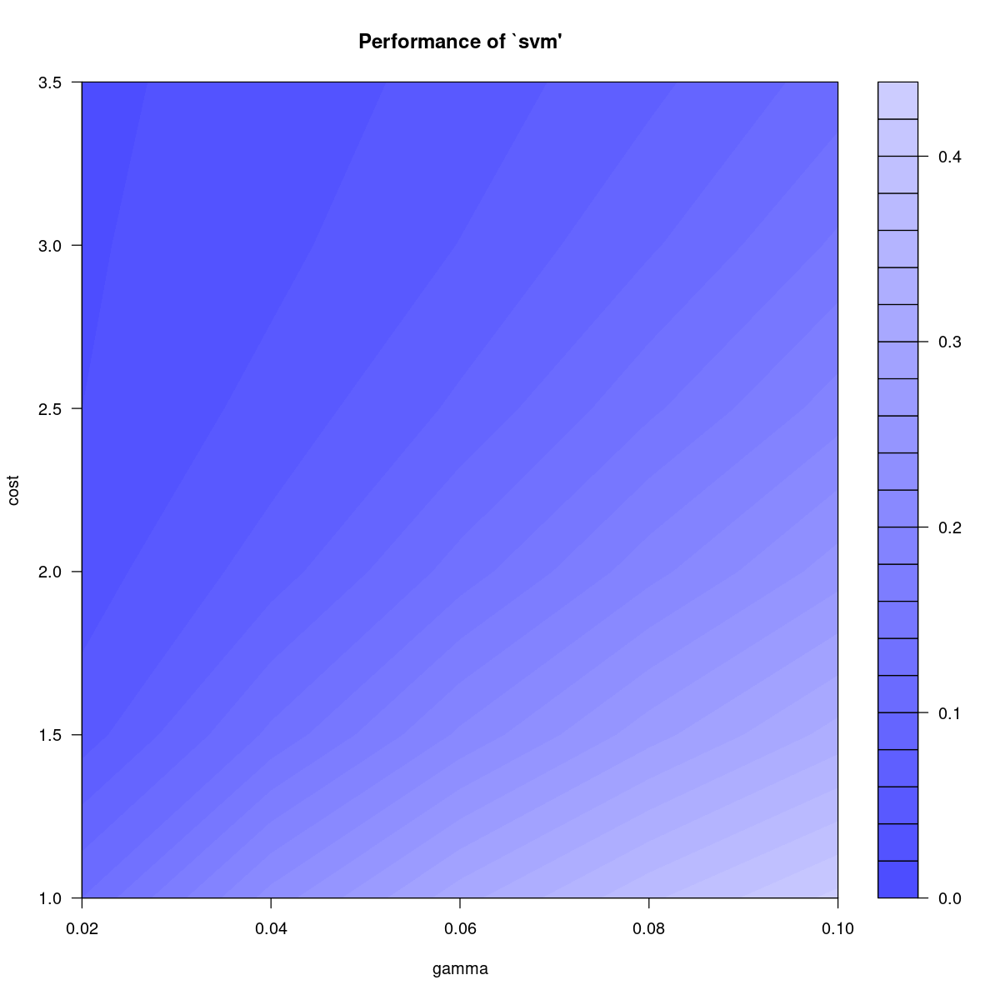

In [70]:
svm.reg.tune_mod = tune.svm(co2_Emissions~., data = X_train_P, cost = c(1, 1.5, 2, 2.5, 3, 3.5), 
    gamma = seq(0.02, 0.1, by = 0.02))
plot(svm.reg.tune_mod)

In [71]:
best_cost <- svm.reg.tune_mod$best.parameters$cost
best_gamma <- svm.reg.tune_mod$best.parameters$gamm
svm_param_mod<-svm(co2_Emissions~., data = X_train_P, cost = best_cost, 
    gamma = best_gamma)
summary(svm_param_mod)


Call:
svm(formula = co2_Emissions ~ ., data = X_train_P, cost = best_cost, 
    gamma = best_gamma)


Parameters:
   SVM-Type:  eps-regression 
 SVM-Kernel:  radial 
       cost:  3.5 
      gamma:  0.02 
    epsilon:  0.1 


Number of Support Vectors:  215






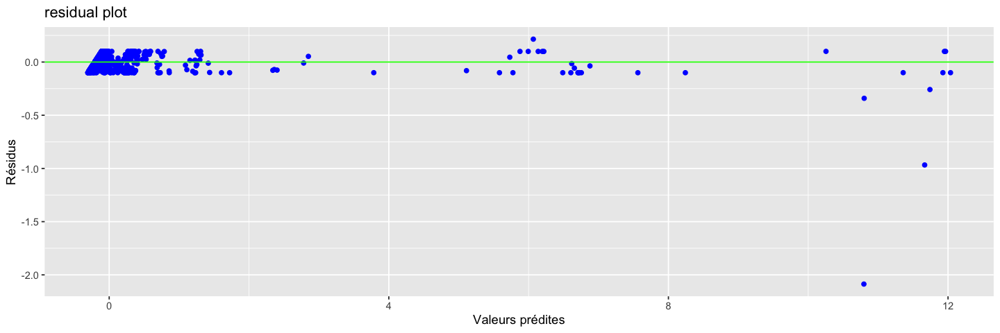

In [72]:
# calcul et graphe des résidus
fit.svmr_mod=fit.svmr=svm_param_mod$fitted
res.svmr_mod=fit.svmr_mod-X_train_P[,"co2_Emissions"]
gplot.res(fit.svmr_mod,res.svmr_mod,titre="residual plot")

In [73]:
pred.svmr_test=predict(svm_param_mod,newdata=X_test_P)
# Erreur quadratique moyenne de prévision
sum((pred.svmr_test-X_test_P[,"co2_Emissions"])^2)/nrow(X_test_P)
r_squared<-R2(X_test_P[,"co2_Emissions"],pred.svmr_test)
cat("r score : ",r_squared,"\n")

[1] 0.007715964

r score :  0.9878604 


# 5 - CART and Random Forest

## 5.1 - Regression tree

In [74]:
library(rpart)

### 5.1.1 - Regression tree on quantitative data

In [75]:
tree.reg.1=rpart(co2_Emissions~.,data=train[,-c(1,2)],control=rpart.control(cp=0.001))

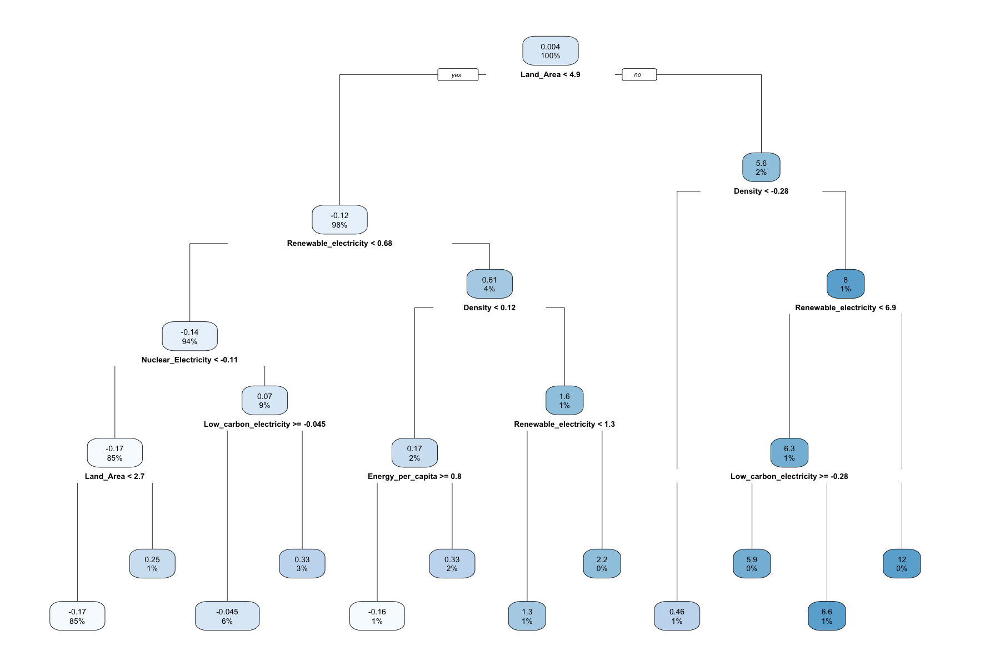

In [76]:
library(rpart.plot)
options(repr.plot.width = 15, repr.plot.height = 10)
rpart.plot(tree.reg.1)

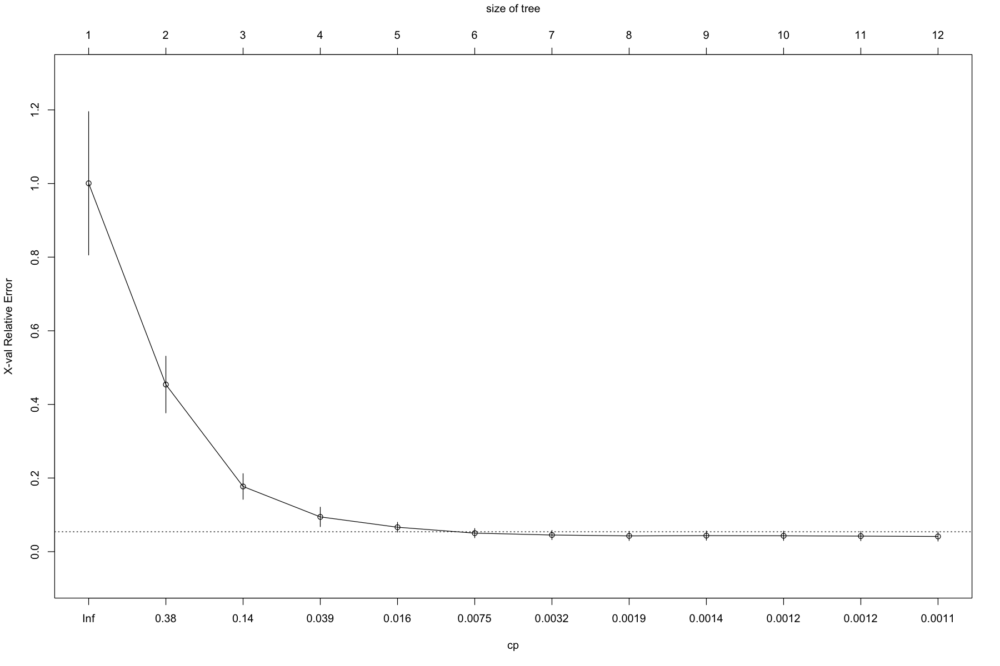

In [77]:
xmat.1<-xpred.rpart(tree.reg.1,xval=10) 
# one row for each observation and one column for each complexity value

# Cross-validation error par valeur de CP
CVerr<-apply((xmat.1-train[,"co2_Emissions"])^2,2,sum) # le 2 signifie qu'on prend les colonnes de xmat

plotcp(tree.reg.1)

In [78]:
# Searching min CP
which.min(CVerr)

0.001085665 
         12

[1] 0.001085665

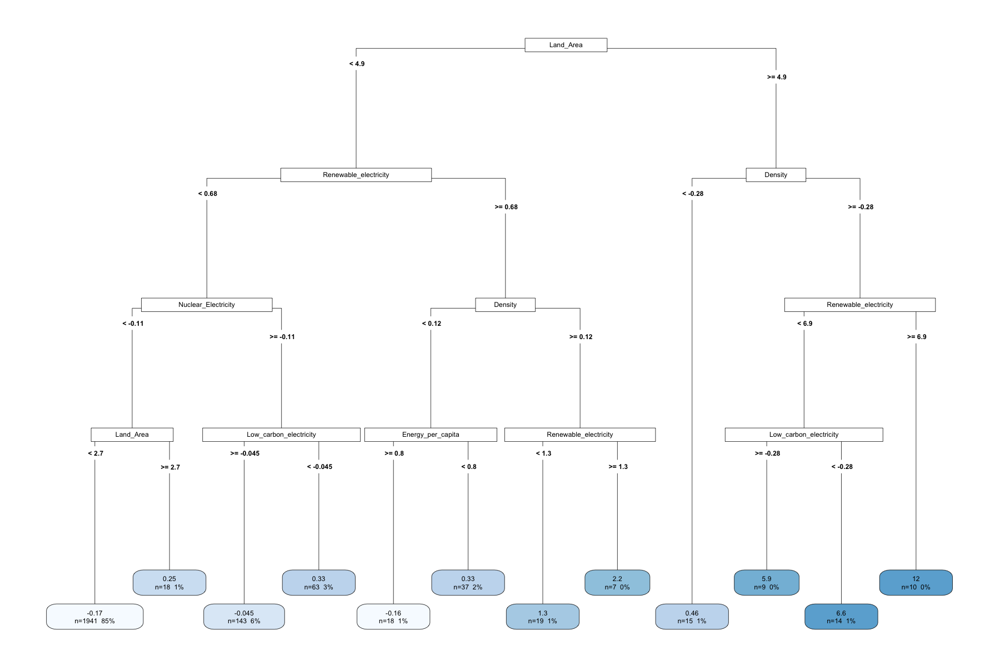

In [79]:
# Tree with min CP
as.numeric(attributes(which.min(CVerr))$names)
tree.reg.1.1=rpart(co2_Emissions~.,data=train[,-c(1,2)],control=rpart.control(cp=as.numeric(attributes(which.min(CVerr))$names)))
rpart.plot(tree.reg.1.1,type=5,extra=101)

Le chargement a nécessité le package : grid

Le chargement a nécessité le package : libcoin

Le chargement a nécessité le package : mvtnorm



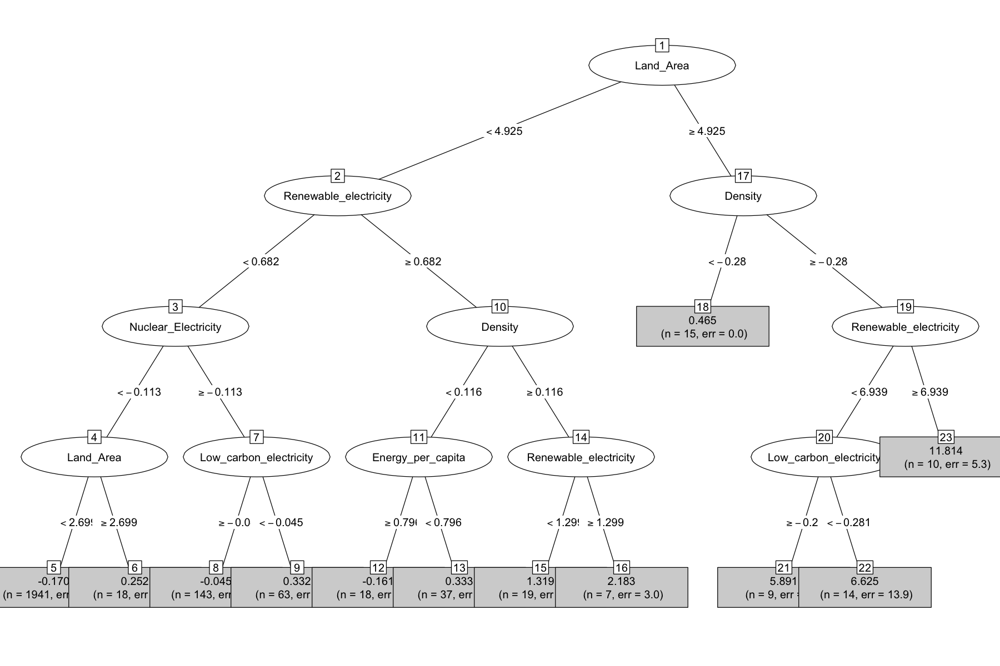

In [80]:
# Graphic construction of the tree
library(partykit)
plot(as.party(tree.reg.1.1), type="simple")

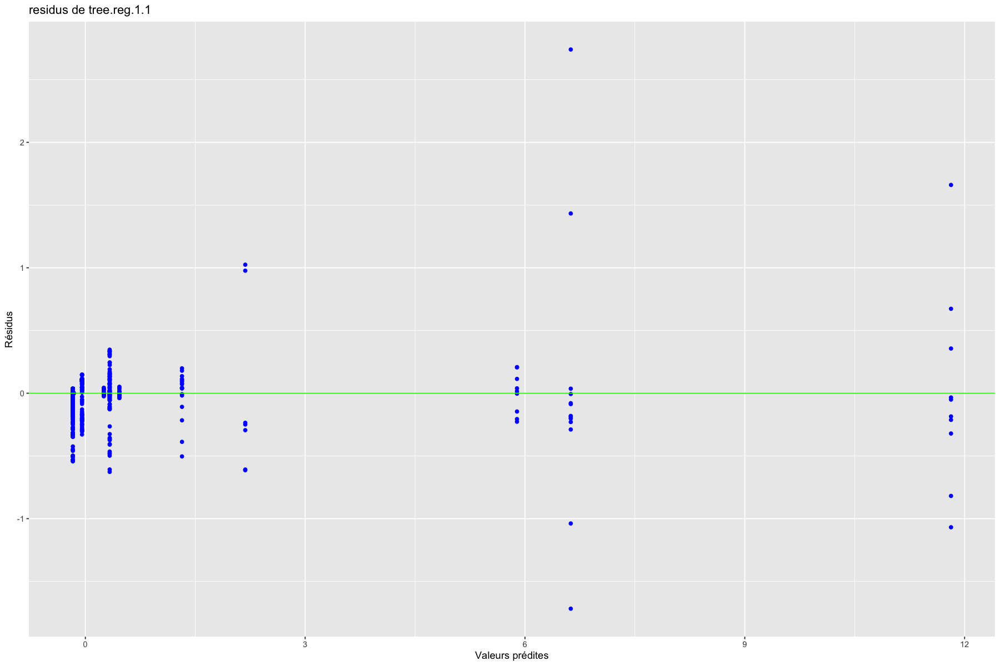

In [81]:
# Residuals graph
fit.tree.1=predict(tree.reg.1.1)
res.tree.1=fit.tree.1-train[,"co2_Emissions"]
gplot.res(fit.tree.1,res.tree.1,"residus de tree.reg.1.1")

In [82]:
# Predictions

pred.treer.1 = predict(tree.reg.1.1,newdata=test[,-c(1,2)])

# Evaluate the model performance

mse = MSE(Y_test,pred.treer.1)
r2 = R2(Y_test,pred.treer.1)

cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

results_df <- add_model_results(results_df, "CART on quanti",r2,mse)

MSE = 0.05313514 
R2 = 0.9164019 


### 5.1.2 - Regression tree on our complete dataset

In [83]:
train_dummies <- model.matrix(~.-1,data=train)
train_dummies <- data.frame(train_dummies)

test_dummies <- model.matrix(~.-1,data=test)
test_dummies <- data.frame(test_dummies)

In [84]:
tree.reg.2=rpart(co2_Emissions~.,data=train_dummies,control=rpart.control(cp=0.001))

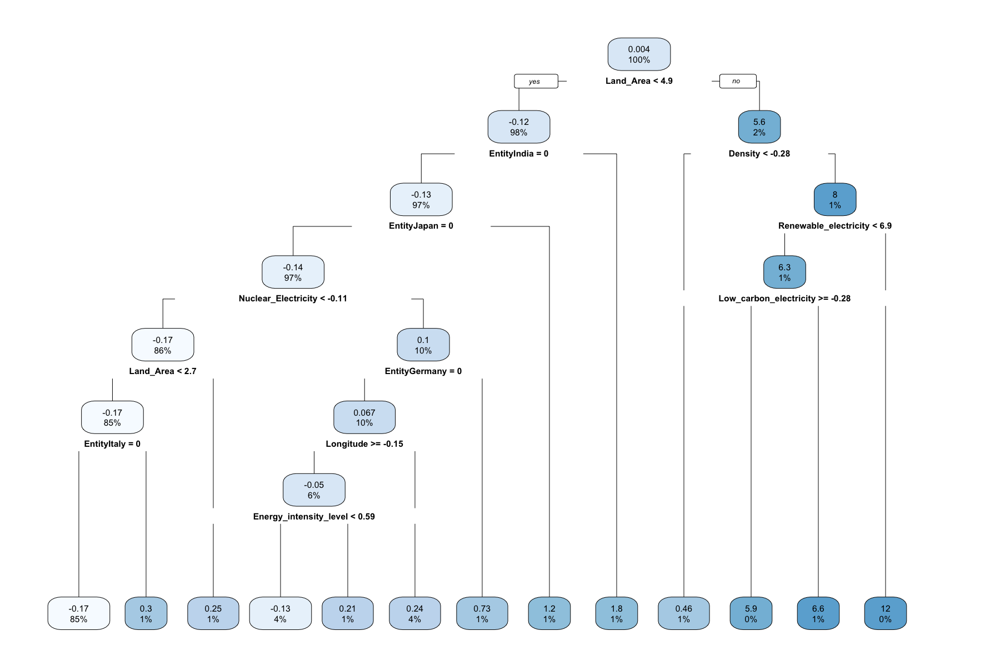

In [85]:
options(repr.plot.width = 15, repr.plot.height = 10)
rpart.plot(tree.reg.2)

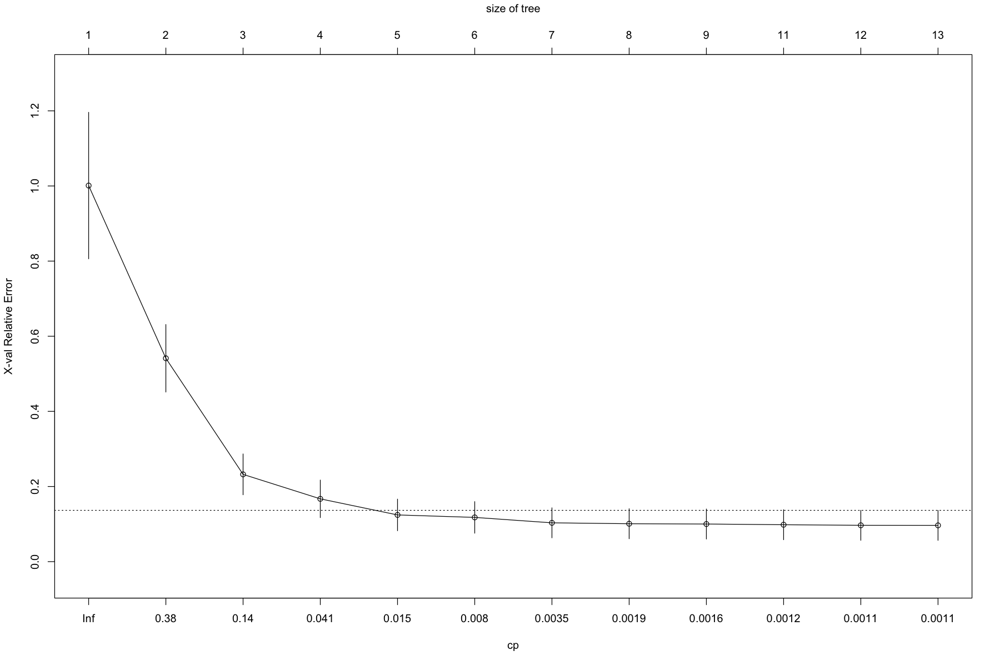

In [86]:
xmat.2<-xpred.rpart(tree.reg.2,xval=10) 
# one row for each observation and one column for each complexity value

# Cross-validation error par valeur de CP
#help(apply)
CVerr<-apply((xmat.2-train[,"co2_Emissions"])^2,2,sum) # le 2 signifie qu'on prend les colonnes de xmat

plotcp(tree.reg.2)

In [87]:
# Searching min CP
which.min(CVerr)

0.001054576 
         12

[1] 0.001054576

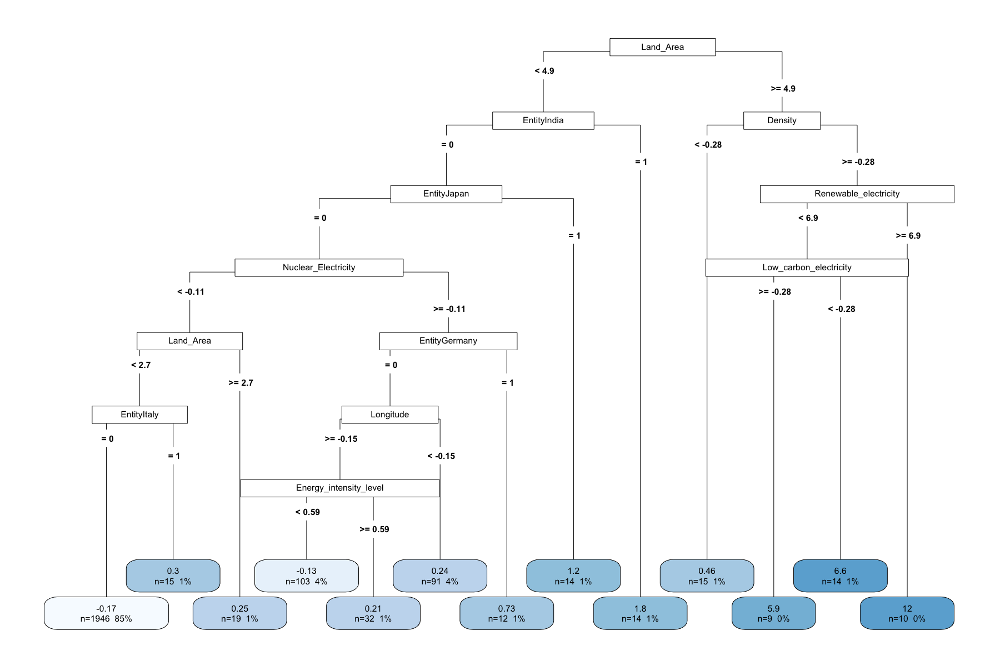

In [88]:
# Tree with min CP
as.numeric(attributes(which.min(CVerr))$names)
tree.reg.2.2=rpart(co2_Emissions~.,data=train_dummies,control=rpart.control(cp=as.numeric(attributes(which.min(CVerr))$names)))
rpart.plot(tree.reg.2.2,type=5,extra=101)

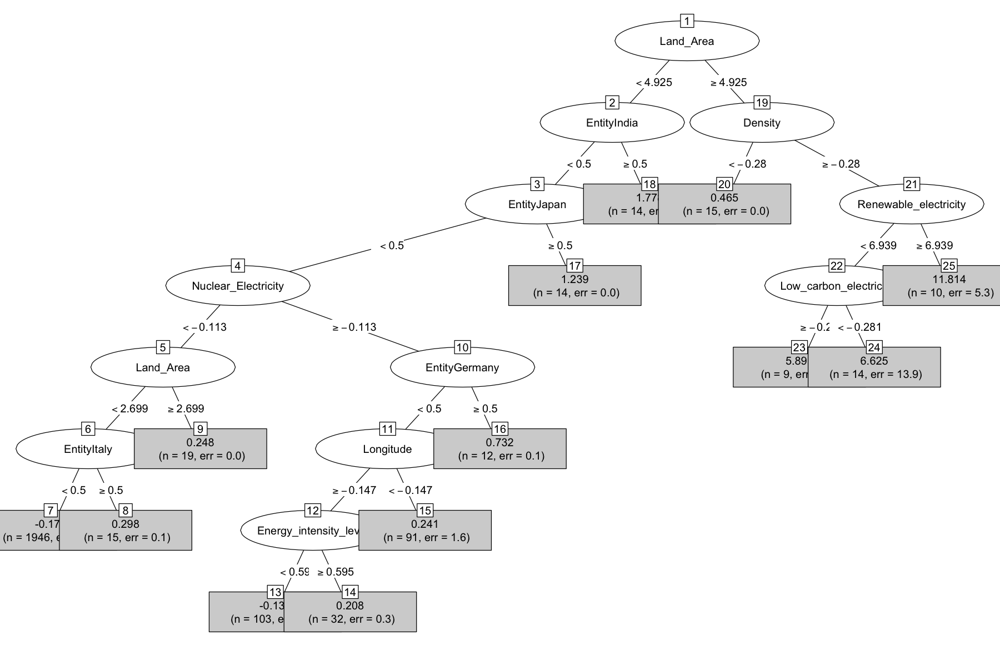

In [89]:
plot(as.party(tree.reg.2.2), type="simple")

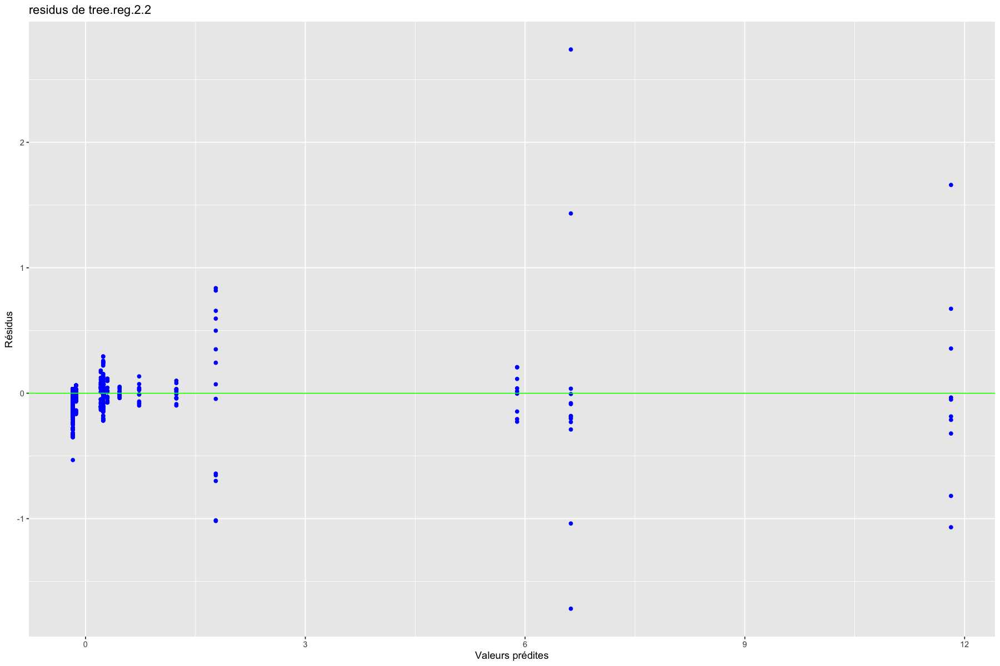

In [90]:
# Residuals graph
fit.tree.2=predict(tree.reg.2.2)
res.tree.2=fit.tree.2-train[,"co2_Emissions"]
gplot.res(fit.tree.2,res.tree.2,"residus de tree.reg.2.2")

In [91]:
# Predictions

pred.treer.2=predict(tree.reg.2.2,newdata=test_dummies)

# Evaluate the model performance

mse = MSE(Y_test,pred.treer.1)
r2 = R2(Y_test,pred.treer.1)

cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

results_df <- add_model_results(results_df, "CART on full data",r2,mse)

MSE = 0.05313514 
R2 = 0.9164019 


## 5.2 - Random Forest 

In [92]:
library(randomForest)

randomForest 4.7-1.1

Type rfNews() to see new features/changes/bug fixes.


Attachement du package : ‘randomForest’


L'objet suivant est masqué depuis ‘package:gridExtra’:

    combine


L'objet suivant est masqué depuis ‘package:dplyr’:

    combine


L'objet suivant est masqué depuis ‘package:ggplot2’:

    margin




### 5.2.1 - Random Forest on quantitative data

In [93]:
mtry <- ceiling(ncol(train[,-c(1,2)])/3)

rf.reg.1=randomForest(co2_Emissions~., data=train[,-c(1,2)],xtest=test[,-c(1,2,11)],ytest=test[,11],ntree=1000,do.trace=50,importance=TRUE,mtry=mtry)
attributes(rf.reg.1)
rf.reg.1$mtry

     |      Out-of-bag   |       Test set    |
Tree |      MSE  %Var(y) |      MSE  %Var(y) |
  50 |  0.01058     0.97 | 0.002411     0.38 |
 100 |  0.01016     0.93 | 0.002742     0.43 |
 150 | 0.009371     0.86 | 0.002909     0.46 |
 200 |  0.01078     0.99 | 0.001791     0.28 |
 250 |  0.01032     0.95 | 0.002014     0.32 |
 300 | 0.009643     0.88 | 0.002097     0.33 |
 350 |  0.01004     0.92 | 0.002299     0.36 |
 400 |  0.01008     0.92 | 0.002222     0.35 |
 450 |  0.01025     0.94 | 0.002334     0.37 |
 500 |  0.01049     0.96 | 0.002182     0.34 |
 550 |  0.01053     0.97 | 0.002223     0.35 |
 600 |  0.01046     0.96 | 0.002038     0.32 |
 650 |  0.01005     0.92 | 0.002063     0.32 |
 700 |  0.01024     0.94 | 0.002112     0.33 |
 750 |  0.01062     0.97 | 0.002181     0.34 |
 800 |  0.01061     0.97 | 0.002291     0.36 |
 850 |  0.01068     0.98 | 0.002433     0.38 |
 900 |  0.01022     0.94 | 0.002539     0.40 |
 950 |  0.01016     0.93 | 0.002548     0.40 |
1000 | 0.0098

$names
 [1] "call"            "type"            "predicted"       "mse"            
 [5] "rsq"             "oob.times"       "importance"      "importanceSD"   
 [9] "localImportance" "proximity"       "ntree"           "mtry"           
[13] "forest"          "coefs"           "y"               "test"           
[17] "inbag"           "terms"          

$class
[1] "randomForest.formula" "randomForest"

[1] 5

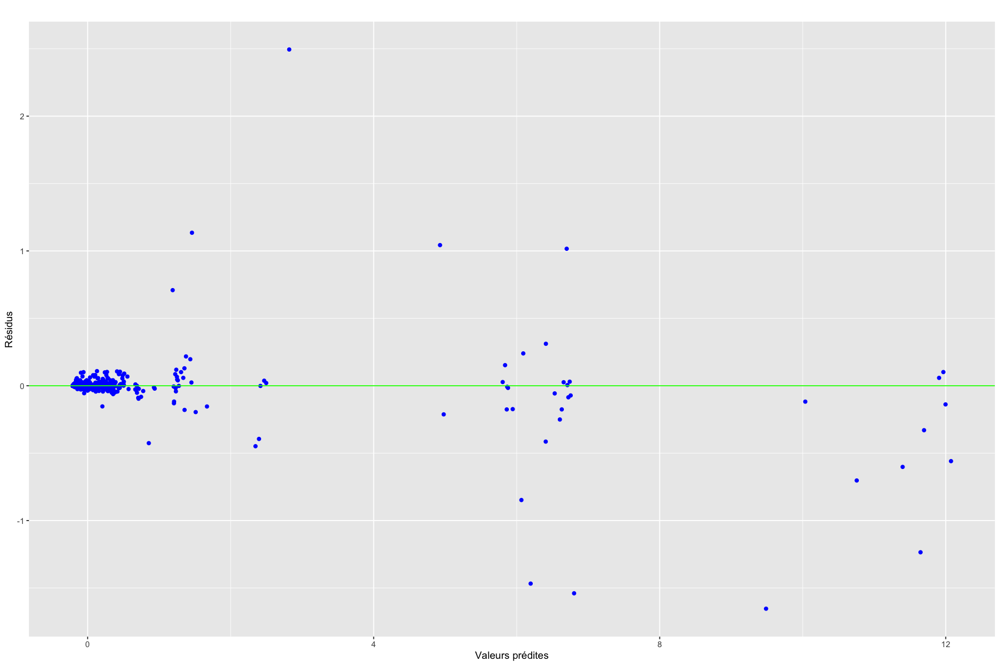

In [94]:
fit.rfr.1=rf.reg.1$predicted
res.rfr.1=fit.rfr.1-train[,11]
gplot.res(fit.rfr.1,res.rfr.1,titre="")

Land_Area              Renewable_electricity 
                             33.12                              28.66 
               Nuclear_Electricity                          Longitude 
                             18.95                              17.60 
                           Density             Low_carbon_electricity 
                             13.81                              13.70 
Renewable_energy_comsumption_share                           Latitude 
                             13.11                              12.12 
                 Energy_per_capita                     GDP_per_capita 
                             10.65                               9.53 
            Energy_intensity_level                         GDP_growth 
                              9.26                               7.57 
              Clean_cooking_access                 Electricity_access 
                              6.28                               5.62

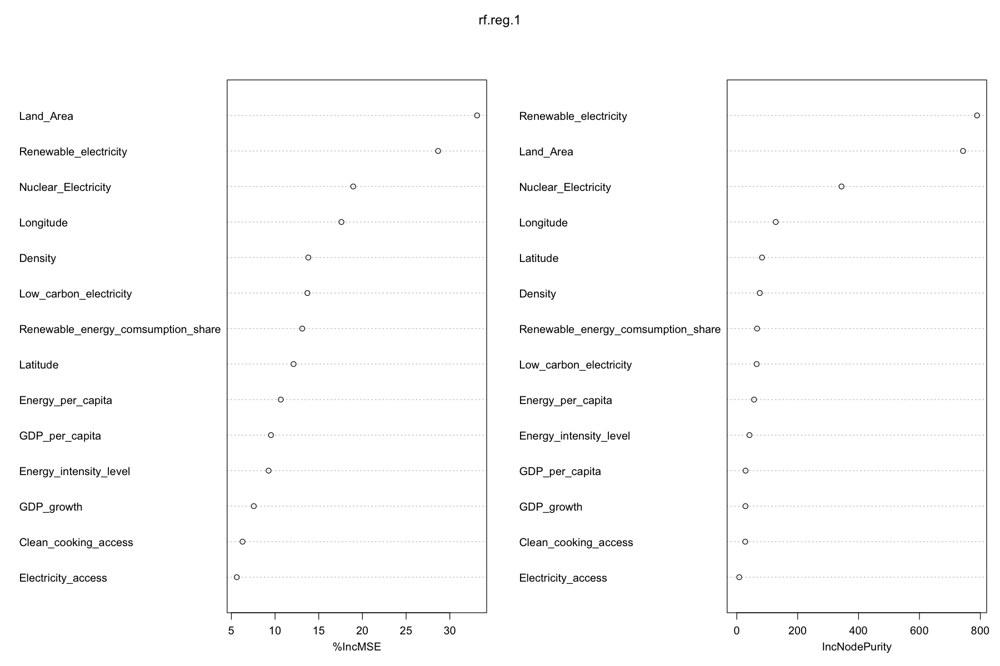

In [95]:
sort(round(importance(rf.reg.1), 2)[,1], decreasing=TRUE)
varImpPlot(rf.reg.1)

Le chargement a nécessité le package : randomForestSRC


 randomForestSRC 3.2.3 
 
 Type rfsrc.news() to see new features, changes, and bug fixes. 
 



Attachement du package : ‘randomForestSRC’


Les objets suivants sont masqués depuis ‘package:e1071’:

    impute, tune


L'objet suivant est masqué depuis ‘package:purrr’:

    partial




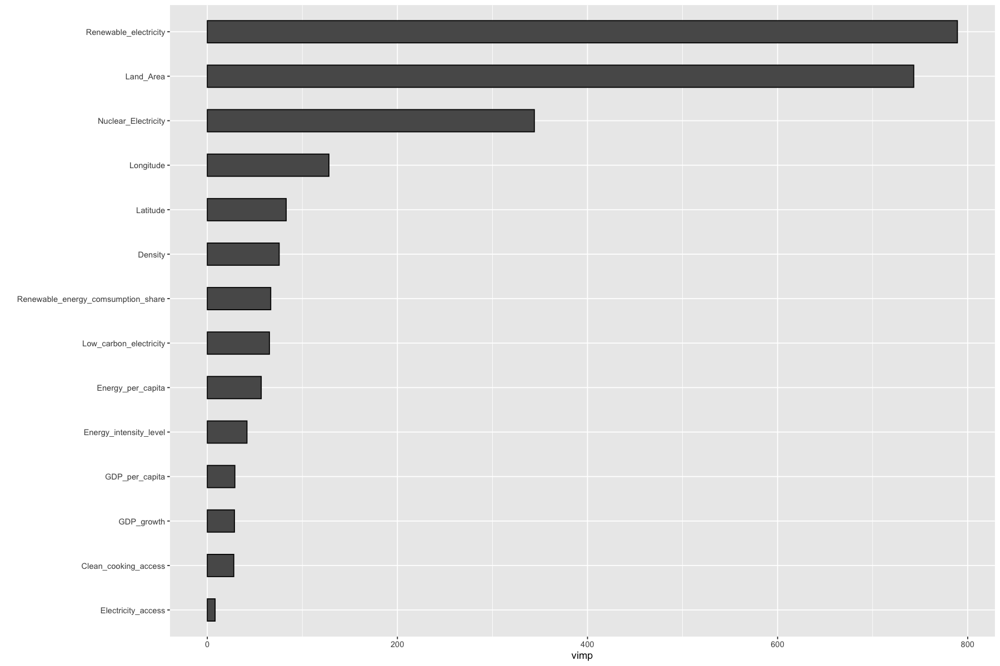

In [96]:
library(ggRandomForests)
plot(gg_vimp(rf.reg.1))

In [97]:
pred.rfr.1=rf.reg.1$test$predicted

# Evaluate the model performance

mse = MSE(Y_test,pred.rfr.1)
r2 = R2(Y_test,pred.rfr.1)

cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

results_df <- add_model_results(results_df, "Random Forest on quanti",r2,mse)

MSE = 0.002578024 
R2 = 0.995944 


### 5.2.2 - Random Forest on our complete dataset

In [98]:
mtry <- ceiling(ncol(train_dummies)/3)

rf.reg.2=randomForest(co2_Emissions~., data=train_dummies,xtest=test_dummies[,-205],ytest=test_dummies[,205],ntree=1000,do.trace=50,importance=TRUE,mtry=mtry)
attributes(rf.reg.2)
rf.reg.2$mtry

     |      Out-of-bag   |       Test set    |
Tree |      MSE  %Var(y) |      MSE  %Var(y) |
  50 |  0.01109     1.02 |  0.01341     2.11 |
 100 | 0.008748     0.80 | 0.006903     1.09 |
 150 | 0.008603     0.79 | 0.006423     1.01 |
 200 |   0.0093     0.85 | 0.006055     0.95 |
 250 | 0.009708     0.89 |  0.00635     1.00 |
 300 |   0.0101     0.93 | 0.006304     0.99 |
 350 | 0.009883     0.91 | 0.006939     1.09 |
 400 | 0.009145     0.84 | 0.007845     1.23 |
 450 | 0.008795     0.81 | 0.007943     1.25 |
 500 | 0.008487     0.78 |  0.00744     1.17 |
 550 | 0.008733     0.80 | 0.007642     1.20 |
 600 | 0.009016     0.83 | 0.007895     1.24 |
 650 | 0.008947     0.82 | 0.008269     1.30 |
 700 | 0.008449     0.77 | 0.007661     1.21 |
 750 | 0.008352     0.77 | 0.007719     1.21 |
 800 | 0.008414     0.77 | 0.007899     1.24 |
 850 | 0.008461     0.78 | 0.007681     1.21 |
 900 | 0.008737     0.80 | 0.007744     1.22 |
 950 | 0.008741     0.80 | 0.007887     1.24 |
1000 | 0.0087

$names
 [1] "call"            "type"            "predicted"       "mse"            
 [5] "rsq"             "oob.times"       "importance"      "importanceSD"   
 [9] "localImportance" "proximity"       "ntree"           "mtry"           
[13] "forest"          "coefs"           "y"               "test"           
[17] "inbag"           "terms"          

$class
[1] "randomForest.formula" "randomForest"

[1] 71

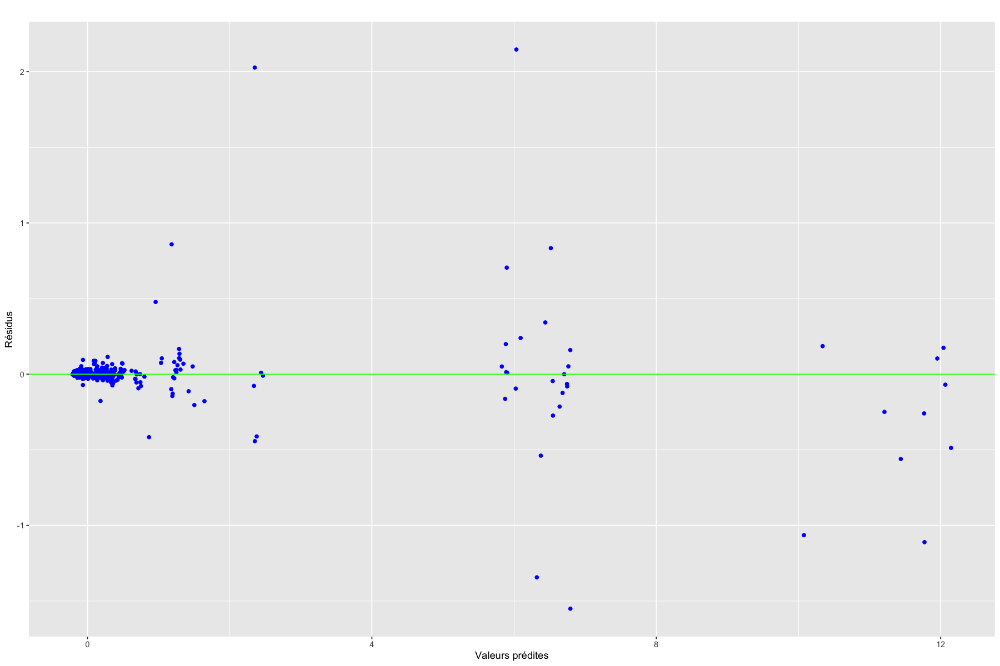

In [99]:
fit.rfr.2=rf.reg.2$predicted
res.rfr.2=fit.rfr.2-train_dummies[,205]
gplot.res(fit.rfr.2,res.rfr.2,titre="")

EntityNigeria                           EntityPoland 
                                 31.33                                  30.80 
                        EntityThailand             EntityUnited.Arab.Emirates 
                                 30.10                                  25.49 
                             Land_Area                  Renewable_electricity 
                                 24.31                                  23.31 
                           EntityChina                            EntityIndia 
                                 21.58                                  20.92 
                           EntityItaly                       EntityBangladesh 
                                 20.47                                  19.82 
                         EntityGermany                            EntityJapan 
                                 18.32                                  17.63 
              EntityDominican.Republic                    EntityUnited.States 
                                 17.52                                  17.51 
                   Nuclear_Electricity                           EntityAngola 
                                 17.36                                  17.34 
                          EntityIsrael                          EntitySenegal 
                                 15.35                                  15.07 
                     EntityPhilippines                          EntityJamaica 
                                 14.26                                  13.45 
                           EntityBenin                     EntitySouth.Africa 
                                 13.42                                  13.40 
             EntityTrinidad.and.Tobago                      EntityNetherlands 
                                 13.33                                  13.24 
                            EntityIraq                              Longitude 
                                 12.61                                  12.60 
    Renewable_energy_comsumption_share                             EntityCuba 
                                 12.32                                  11.74 
                  EntityUnited.Kingdom                                Density 
                                 11.57                                  11.49 
                       EntityMauritius                             EntityTogo 
                                 11.44                                  11.39 
                          EntityGreece                      Energy_per_capita 
                                 11.13                                  10.92 
                Low_carbon_electricity                            EntityKenya 
                                 10.74                                  10.36 
                        EntityEthiopia                        EntityAustralia 
                                 10.22                                  10.21 
                         EntityBelarus                        EntityArgentina 
                                  9.78                                   9.76 
                           EntitySudan                           EntityMexico 
                                  9.35                                   9.28 
                              Latitude                           EntityKuwait 
                                  9.03                                   9.02 
                       EntityNicaragua                           EntityLatvia 
                                  9.00                                   8.95 
                         EntityAlgeria                 Energy_intensity_level 
                                  8.93                                   8.85 
                       EntityLithuania                            EntitySpain 
                                  8.64                                   8.56 
                         EntityLiberia                       EntityUzbekist

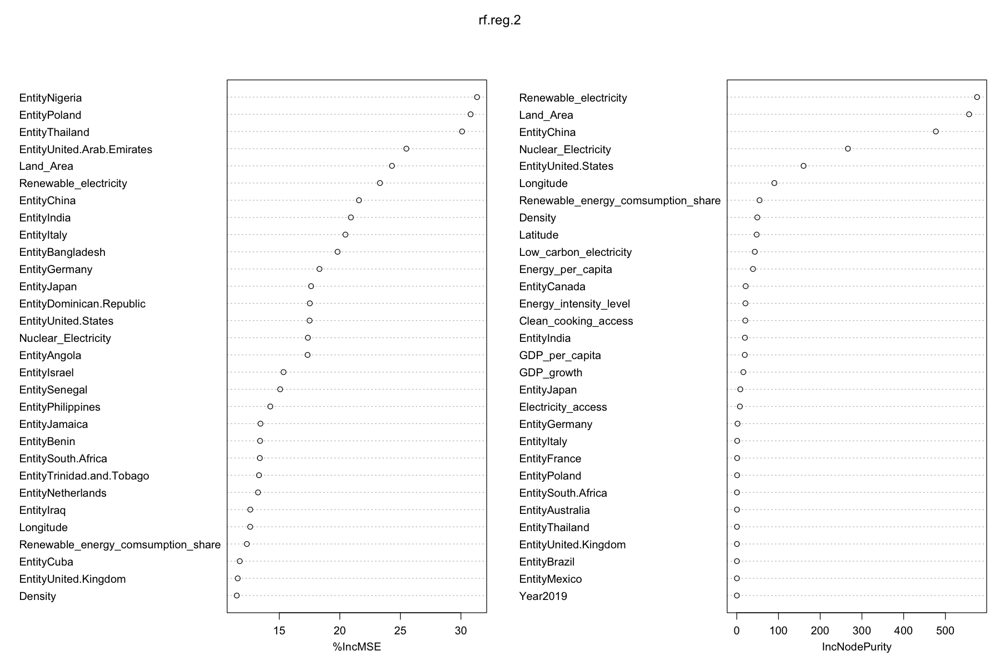

In [100]:
sort(round(importance(rf.reg.2), 2)[,1], decreasing=TRUE)
varImpPlot(rf.reg.2)

In [101]:
pred.rfr.2=rf.reg.2$test$predicted

# Evaluate the model performance

mse = MSE(Y_test,pred.rfr.2)
r2 = R2(Y_test,pred.rfr.2)

cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

results_df <- add_model_results(results_df, "Random Forest on full data",r2,mse)

MSE = 0.008034755 
R2 = 0.9873588 


# 6 - Boosting

In [102]:
library(gbm)

Loaded gbm 2.1.9

This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3



### 6.1 - Generalized Boosted Regression Modeling on quantitative data

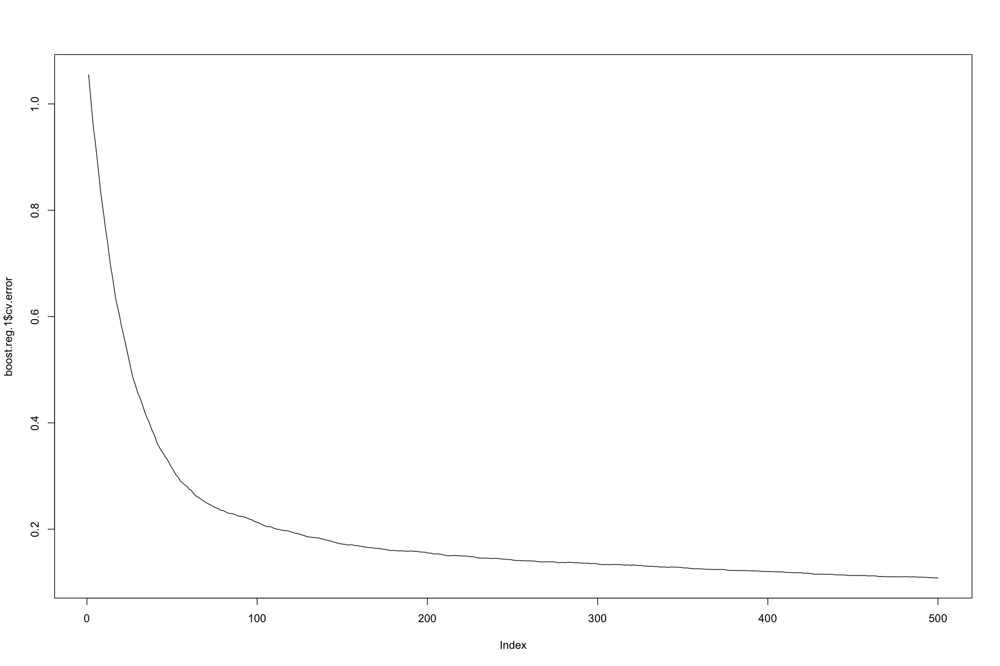

In [114]:
boost.reg.1 = gbm(co2_Emissions ~ ., data = train[,-c(1,2)], distribution = "gaussian", n.trees = 500, 
    cv.folds = 10, n.minobsinnode = 5, shrinkage = 0.03, verbose = FALSE)
# fixer verbose à FALSE pour éviter trop de sorties
plot(boost.reg.1$cv.error, type = "l")

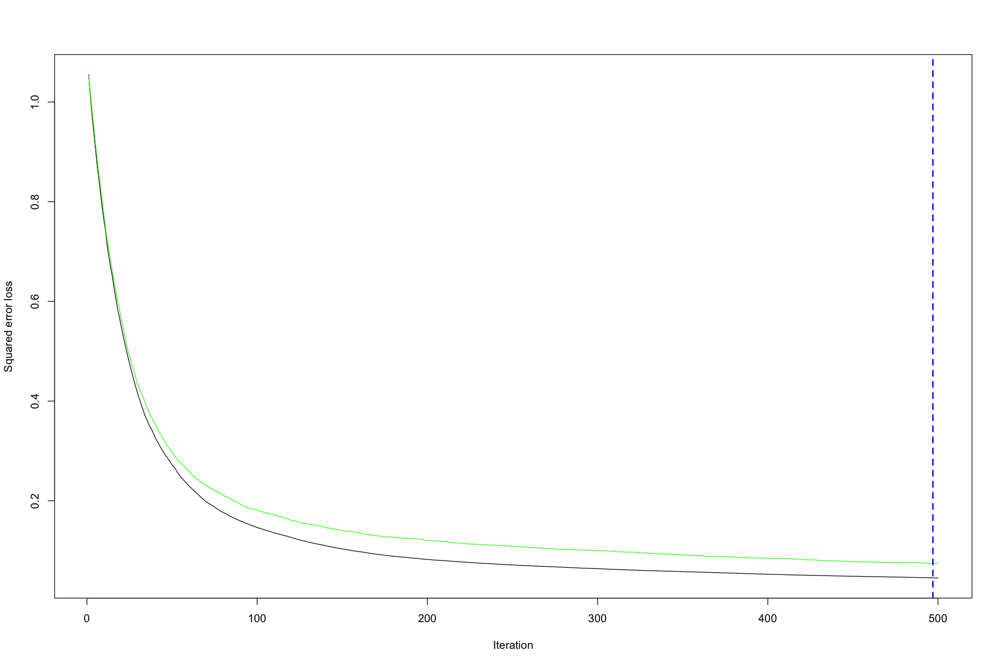

In [104]:
# nombre optimal d'itérations par valiation croisée
best.iter=gbm.perf(boost.reg.1,method="cv")

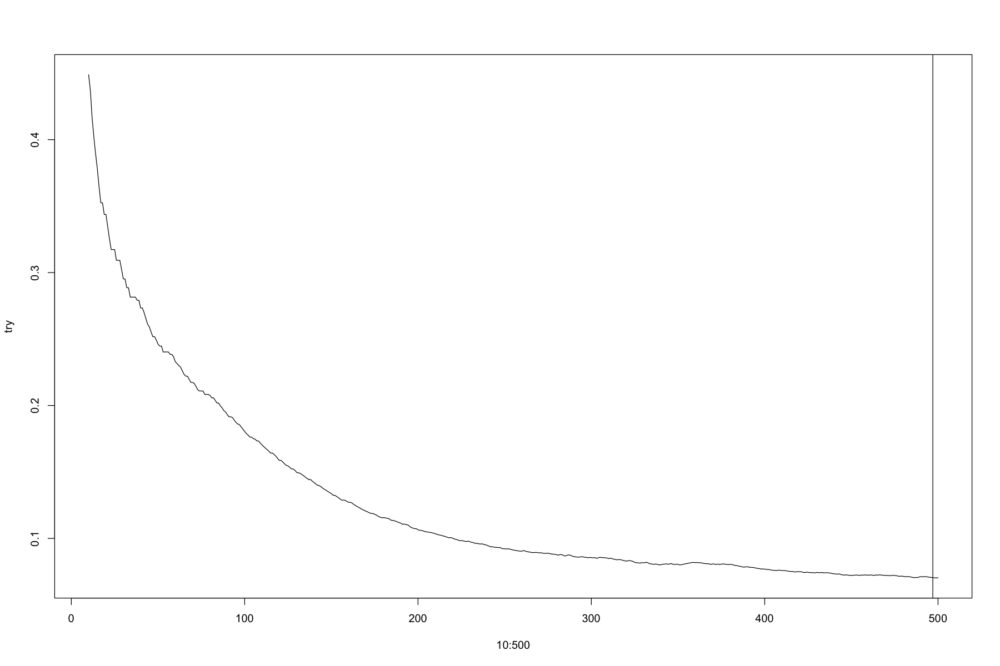

In [105]:
try=numeric()
for (i in 10:500){
pred.test.1=predict(boost.reg.1,newdata=test,n.trees=i)
err=sum((pred.test.1-test[,"co2_Emissions"])^2)/nrow(test[,-c(1,2)])
try=c(try,err)}
plot(10:500,try,type="l")
abline(v=best.iter)

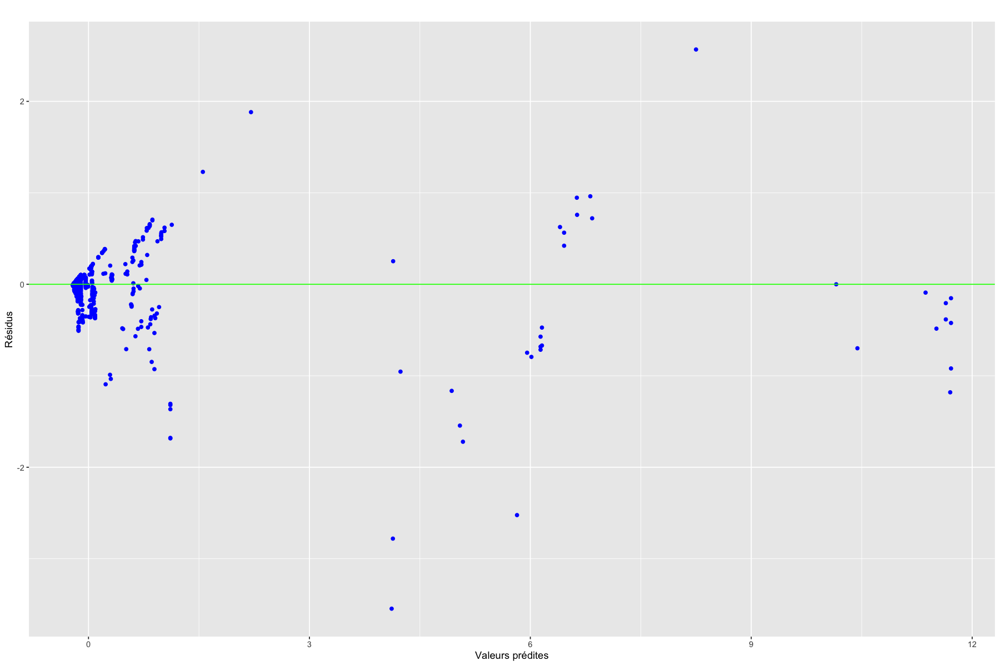

In [106]:
fit.boostr.1=boost.reg.1$fit
res.boostr.1=fit.boostr.1-train[,"co2_Emissions"]
gplot.res(fit.boostr.1,res.boostr.1,titre="")

In [107]:
pred.boostr.1.test=predict(boost.reg.1,newdata=test[,-c(1,2)],n.trees=best.iter)

# Evaluate the model performance

mse = MSE(Y_test,pred.boostr.1.test)
r2 = R2(Y_test,pred.boostr.1.test)

cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

results_df <- add_model_results(results_df, "GBM on quanti",r2,mse)

MSE = 0.07051066 
R2 = 0.8890648 


### 6.2 - Generalized Boosted Regression Modeling on our complete dataset

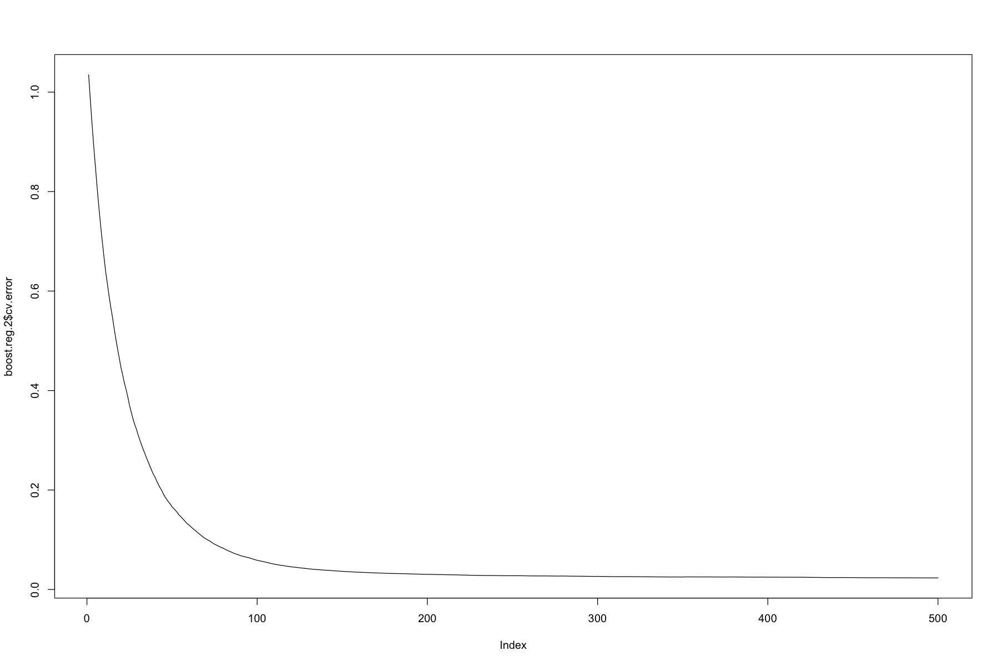

In [108]:
boost.reg.2 = gbm(co2_Emissions ~ ., data = train, distribution = "gaussian", n.trees = 500, 
    cv.folds = 10, n.minobsinnode = 5, shrinkage = 0.03, verbose = FALSE)
# fixer verbose à FALSE pour éviter trop de sorties
plot(boost.reg.2$cv.error, type = "l")

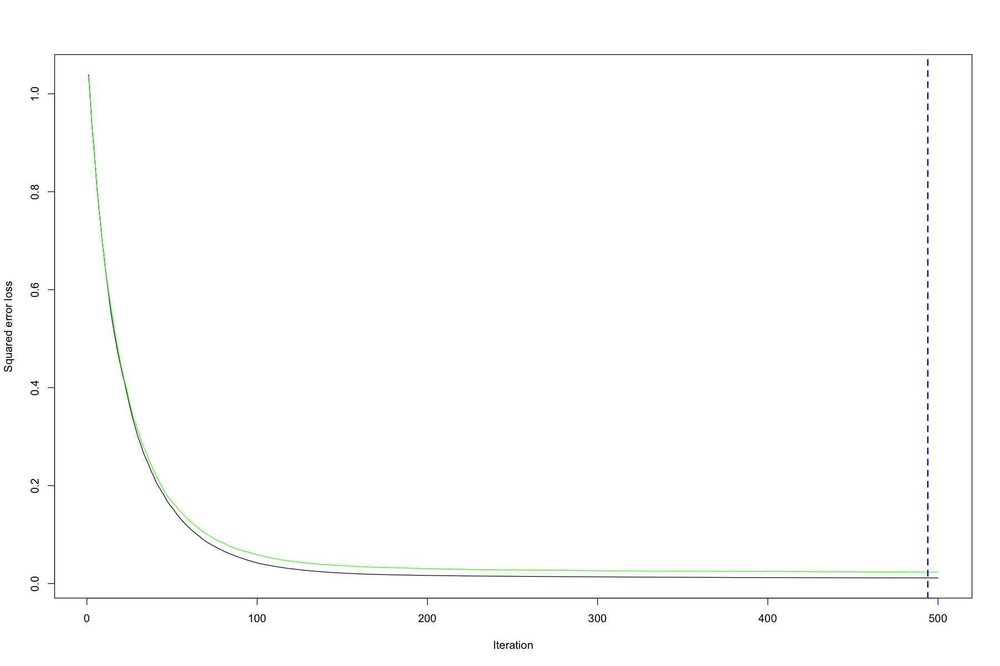

In [109]:
# nombre optimal d'itérations par valiation croisée
best.iter.2=gbm.perf(boost.reg.2,method="cv")

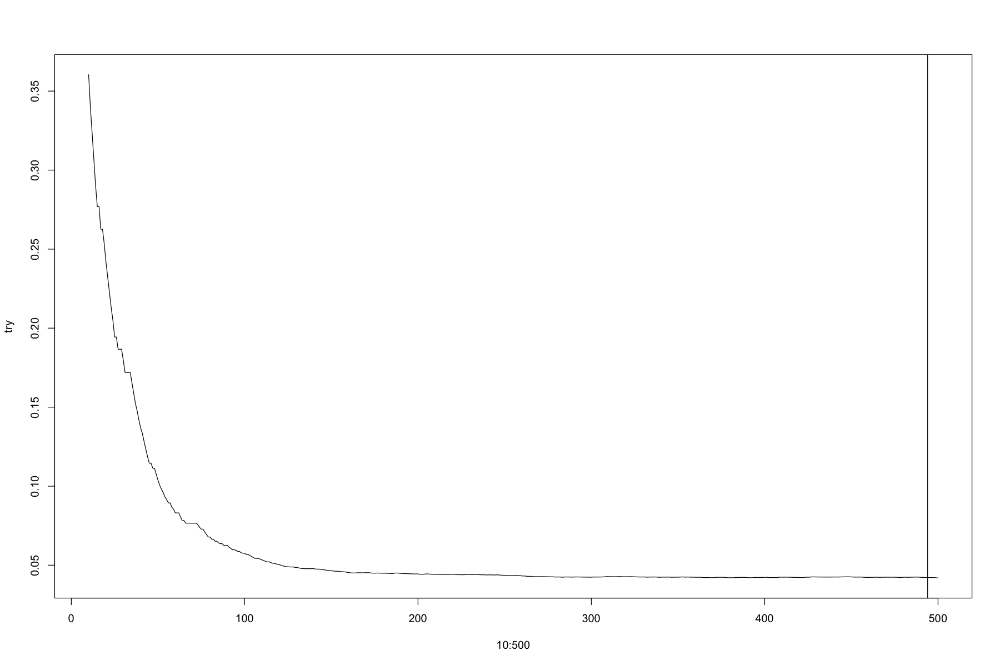

In [110]:
try=numeric()
for (i in 10:500){
pred.test.2=predict(boost.reg.2,newdata=test,n.trees=i)
err=sum((pred.test.2-test[,"co2_Emissions"])^2)/nrow(test[,-c(1,2)])
try=c(try,err)}
plot(10:500,try,type="l")
abline(v=best.iter.2)

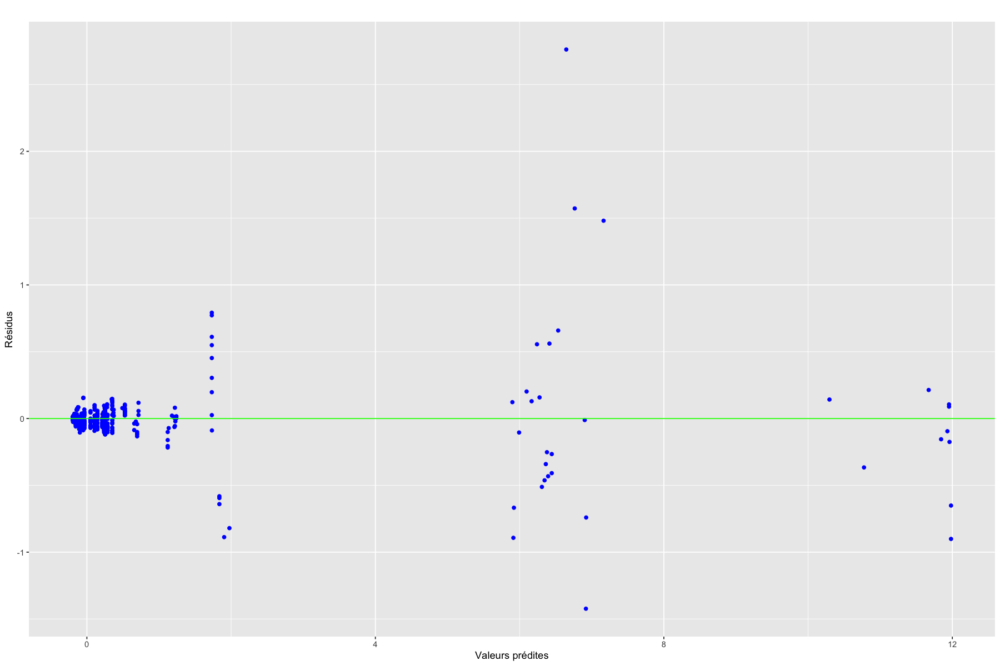

In [111]:
fit.boostr.2=boost.reg.2$fit
res.boostr.2=fit.boostr.2-train[,"co2_Emissions"]
gplot.res(fit.boostr.2,res.boostr.2,titre="")

In [112]:
pred.boostr.2.test=predict(boost.reg.2,newdata=test,n.trees=best.iter.2)

# Evaluate the model performance

mse = MSE(Y_test,pred.boostr.2.test)
r2 = R2(Y_test,pred.boostr.2.test)

cat("MSE =", mse, "\n")
cat("R2 =",r2, "\n")

results_df <- add_model_results(results_df, "GBM on full data",r2,mse)

MSE = 0.0422191 
R2 = 0.9335762 


# 7 - Neural Network

### 7.1 - Fitting a Neural Network on the quantitative data

# weights:  97
initial  value 5212.781461 
iter  10 value 1921.438864
iter  20 value 1907.230652
iter  30 value 1867.913905
iter  40 value 1858.183847
iter  50 value 1856.328932
iter  60 value 1856.000631
iter  70 value 1855.950964
iter  80 value 1855.940605
final  value 1855.940360 
converged


a 14-6-1 network with 97 weights
options were - linear output units  decay=100
  b->h1  i1->h1  i2->h1  i3->h1  i4->h1  i5->h1  i6->h1  i7->h1  i8->h1  i9->h1 
  -0.27    0.02   -0.02   -0.02    0.18    0.25   -0.04   -0.02    0.02    0.01 
i10->h1 i11->h1 i12->h1 i13->h1 i14->h1 
   0.00    0.00    0.12    0.02    0.02 
  b->h2  i1->h2  i2->h2  i3->h2  i4->h2  i5->h2  i6->h2  i7->h2  i8->h2  i9->h2 
   0.34   -0.02    0.03    0.03   -0.20   -0.27    0.06    0.03   -0.02   -0.01 
i10->h2 i11->h2 i12->h2 i13->h2 i14->h2 
   0.01   -0.01   -0.11   -0.02   -0.04 
  b->h3  i1->h3  i2->h3  i3->h3  i4->h3  i5->h3  i6->h3  i7->h3  i8->h3  i9->h3 
  -0.27    0.02   -0.02   -0.02    0.18    0.25   -0.04   -0.02    0.02    0.01 
i10->h3 i11->h3 i12->h3 i13->h3 i14->h3 
   0.00    0.00    0.12    0.02    0.02 
  b->h4  i1->h4  i2->h4  i3->h4  i4->h4  i5->h4  i6->h4  i7->h4  i8->h4  i9->h4 
   0.34   -0.02    0.03    0.03   -0.20   -0.27    0.06    0.03   -0.02   -0.01 
i10->h4 i11->h4 i12->h4 i13

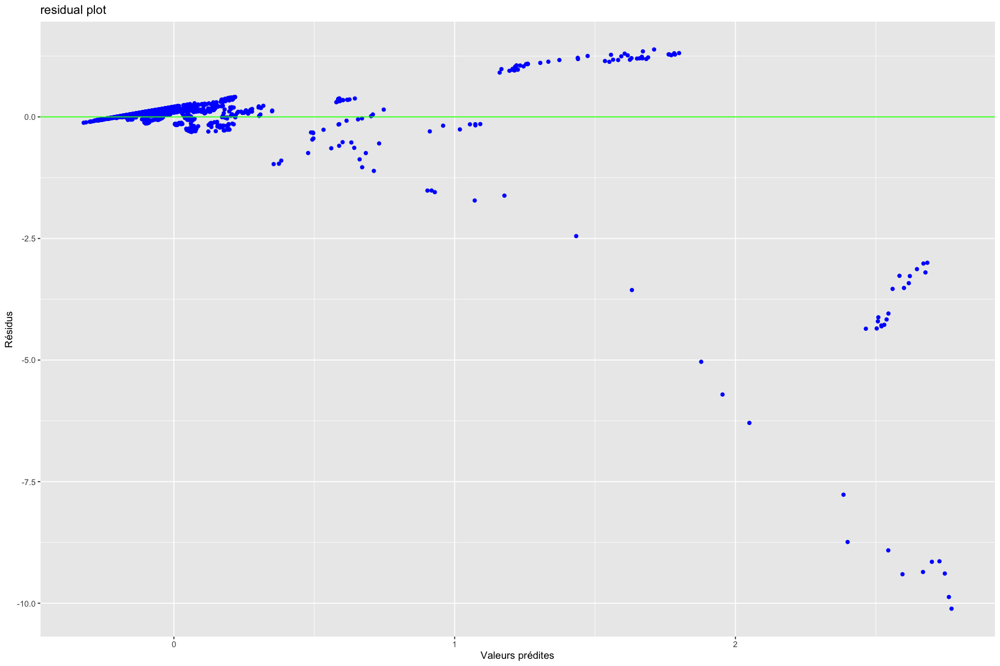

In [115]:
library(nnet)
# apprentissage
# attention au paramètre linout dans le cas de la régression
nnet.reg=nnet(co2_Emissions ~ ., data = train[,-c(1,2)],size=6,decay=100,linout=TRUE,maxit=10000)
summary(nnet.reg)
# calcul et graphe des résidus
fit.nnetr=predict(nnet.reg,data=train[,-c(1,2)])
res.nnetr=fit.nnetr-train[,"co2_Emissions"]
gplot.res(fit.nnetr,res.nnetr,titre="residual plot")

hidden_layer_sizes 6 
earning_rate_init 1 


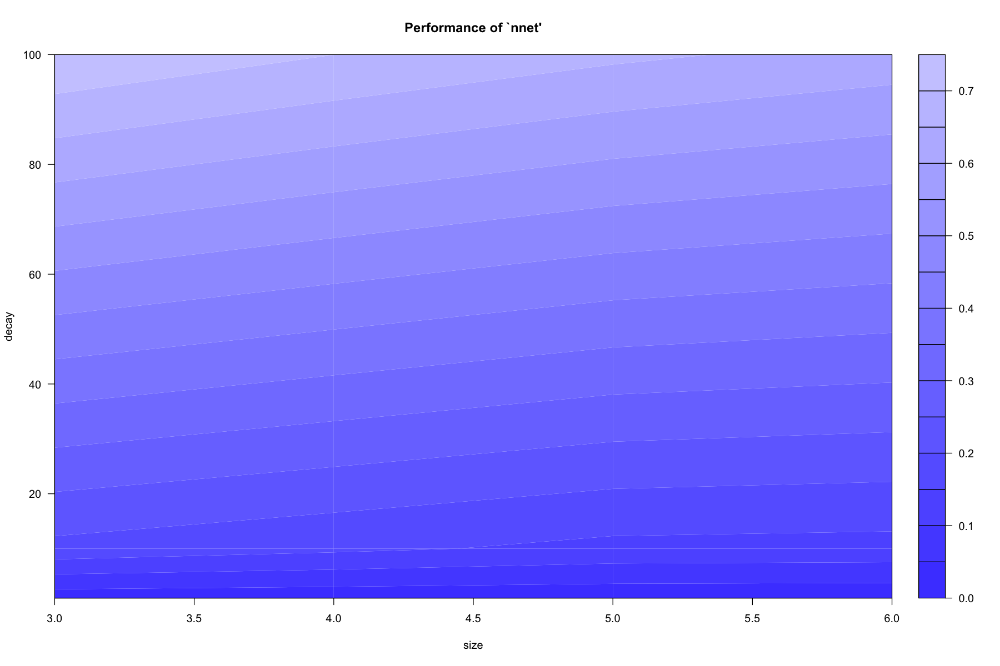

In [116]:
library(e1071)
tuning_reg<-tune.nnet(co2_Emissions~.,data=train[,-c(1,2)],size=c(3,4,5,6),decay=c(100,10,1),linout=TRUE,maxit=20000)

plot(tuning_reg)
cat("hidden_layer_sizes", tuning_reg$best.parameters$size, "\n")
cat("earning_rate_init",tuning_reg$best.parameters$decay,"\n")


# weights:  97
initial  value 6250.490659 
iter  10 value 1176.400869
iter  20 value 783.724813
iter  30 value 652.525275
iter  40 value 562.346599
iter  50 value 485.156990
iter  60 value 382.565962
iter  70 value 336.132118
iter  80 value 287.814598
iter  90 value 246.732096
iter 100 value 201.956216
iter 110 value 176.719595
iter 120 value 162.553447
iter 130 value 152.180036
iter 140 value 141.407549
iter 150 value 135.041348
iter 160 value 128.599565
iter 170 value 125.686784
iter 180 value 123.180169
iter 190 value 119.813569
iter 200 value 118.136228
iter 210 value 117.010856
iter 220 value 114.656901
iter 230 value 112.475230
iter 240 value 111.098244
iter 250 value 110.371010
iter 260 value 109.752383
iter 270 value 108.976873
iter 280 value 108.463852
iter 290 value 108.015392
iter 300 value 107.608208
iter 310 value 106.948686
iter 320 value 106.599185
iter 330 value 106.432994
iter 340 value 106.303380
iter 350 value 106.154808
iter 360 value 106.099769
iter 370 value 106.0

a 14-6-1 network with 97 weights
options were - linear output units  decay=1
  b->h1  i1->h1  i2->h1  i3->h1  i4->h1  i5->h1  i6->h1  i7->h1  i8->h1  i9->h1 
   0.74    0.11    0.38    0.28    0.66    0.43    1.02    0.21   -0.25   -0.12 
i10->h1 i11->h1 i12->h1 i13->h1 i14->h1 
   0.67   -0.13    0.25   -0.31   -0.17 
  b->h2  i1->h2  i2->h2  i3->h2  i4->h2  i5->h2  i6->h2  i7->h2  i8->h2  i9->h2 
   0.51    0.41    0.66   -0.04   -1.01    0.37    0.49    0.07   -0.56   -0.19 
i10->h2 i11->h2 i12->h2 i13->h2 i14->h2 
   0.36    0.01    0.37   -0.09   -0.27 
  b->h3  i1->h3  i2->h3  i3->h3  i4->h3  i5->h3  i6->h3  i7->h3  i8->h3  i9->h3 
  -3.01    0.02   -0.20   -0.04    0.60    0.47   -0.61   -0.33    0.06    0.07 
i10->h3 i11->h3 i12->h3 i13->h3 i14->h3 
  -0.17    0.09    0.01    0.40    0.01 
  b->h4  i1->h4  i2->h4  i3->h4  i4->h4  i5->h4  i6->h4  i7->h4  i8->h4  i9->h4 
   3.04   -0.08    0.39    0.20   -0.56   -0.41    0.64    0.20   -0.15   -0.05 
i10->h4 i11->h4 i12->h4 i13->

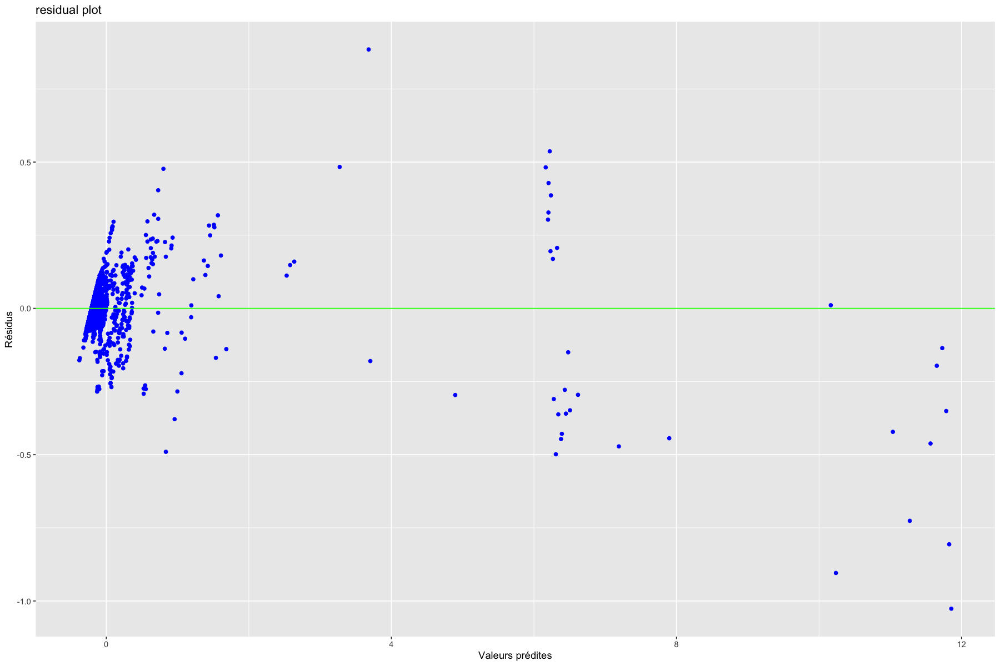

In [117]:
nnet.regparam<-nnet(co2_Emissions~.,data=train[,-c(1,2)],size=tuning_reg$best.parameters$size,decay=tuning_reg$best.parameters$decay,linout=TRUE,maxit=20000)
summary(nnet.regparam)
# calcul et graphe des résidus
fit.nnetrparam=predict(nnet.regparam,data=train)
res.nnetrparam=fit.nnetrparam-train[,"co2_Emissions"]
gplot.res(fit.nnetrparam,res.nnetrparam,titre="residual plot")

In [125]:
pred.nnetr=predict(nnet.regparam,newdata=test)
sum((pred.nnetr-test[,"co2_Emissions"])^2)/nrow(test)
MSE(test[,"co2_Emissions"],pred.nnetr)
r_squared<-R2(test[,"co2_Emissions"],pred.nnetr)
cat("r² :",r_squared,"\n")

[1] 0.006121132

[1] 0.006121132

r² : 0.9903696 


### 7.2 - Fitting a Neural Network on our complete dataset

# weights:  634
initial  value 3799.573485 
iter  10 value 2224.412909
iter  20 value 1637.488163
iter  30 value 1435.523403
iter  40 value 1234.334251
iter  50 value 1156.479538
iter  60 value 1092.030693
iter  70 value 1045.372861
iter  80 value 1021.009308
iter  90 value 997.679411
iter 100 value 970.852379
iter 110 value 933.883047
iter 120 value 878.978631
iter 130 value 810.065963
iter 140 value 769.759222
iter 150 value 729.932255
iter 160 value 713.296137
iter 170 value 706.343642
iter 180 value 702.180125
iter 190 value 699.985261
iter 200 value 698.167502
iter 210 value 697.307564
iter 220 value 696.892401
iter 230 value 696.589481
iter 240 value 696.383915
iter 250 value 696.213818
iter 260 value 695.978291
iter 270 value 695.800682
iter 280 value 695.704445
iter 290 value 695.650527
iter 300 value 695.618035
iter 310 value 695.580798
iter 320 value 695.495360
iter 330 value 695.468956
iter 340 value 695.459338
iter 350 value 695.456760
iter 360 value 695.454264
iter 370 val

a 209-3-1 network with 634 weights
options were - linear output units  decay=10
   b->h1   i1->h1   i2->h1   i3->h1   i4->h1   i5->h1   i6->h1   i7->h1 
   -1.82     0.00    -0.03     0.03    -0.01     0.03    -0.01     0.00 
  i8->h1   i9->h1  i10->h1  i11->h1  i12->h1  i13->h1  i14->h1  i15->h1 
    0.05     0.03    -0.07     0.00    -0.01    -0.10    -0.01    -0.07 
 i16->h1  i17->h1  i18->h1  i19->h1  i20->h1  i21->h1  i22->h1  i23->h1 
    0.04     0.02    -0.05     0.00     0.01    -0.04    -0.03    -0.61 
 i24->h1  i25->h1  i26->h1  i27->h1  i28->h1  i29->h1  i30->h1  i31->h1 
    0.00     0.00     0.01    -0.05     0.01    -0.54     0.00     0.01 
 i32->h1  i33->h1  i34->h1  i35->h1  i36->h1  i37->h1  i38->h1  i39->h1 
   -0.02     0.00     0.70     0.00    -0.07     0.00     0.03     0.02 
 i40->h1  i41->h1  i42->h1  i43->h1  i44->h1  i45->h1  i46->h1  i47->h1 
    0.00    -0.05     0.00     0.02    -0.04     0.00    -0.01     0.02 
 i48->h1  i49->h1  i50->h1  i51->h1  i52->h1

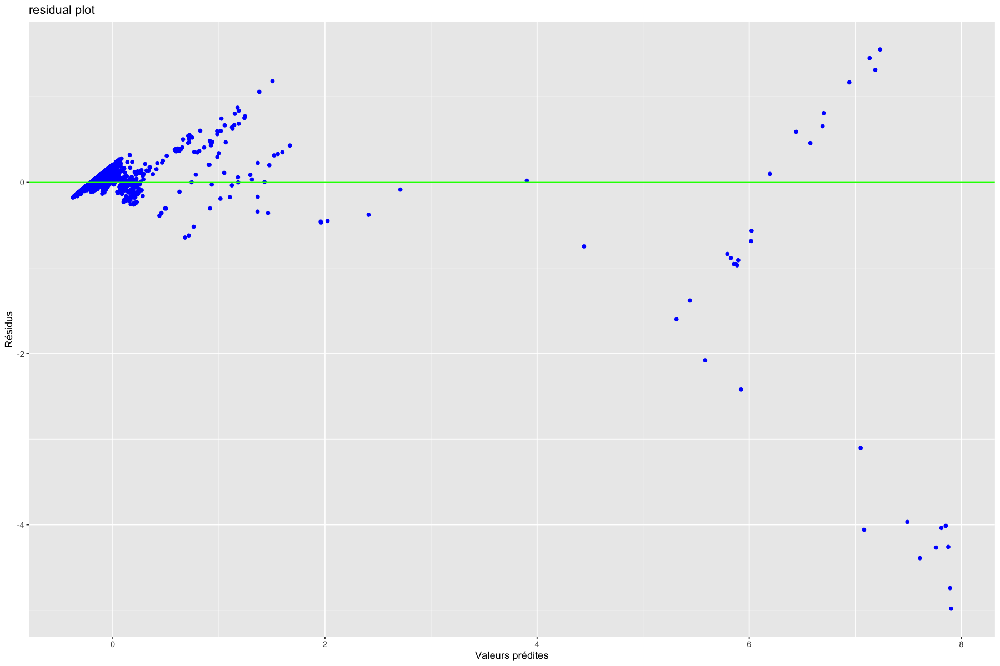

In [119]:
library(nnet)
# apprentissage
nnet.reg_full=nnet(co2_Emissions ~ ., data = train,size=3,decay=10,linout=TRUE,maxit=10000)
summary(nnet.reg_full)
# calcul et graphe des résidus
fit.nnetr_full=predict(nnet.reg_full,data=train)
res.nnetr_full=fit.nnetr_full-train[,"co2_Emissions"]
gplot.res(fit.nnetr_full,res.nnetr_full,titre="residual plot")

hidden_layer_sizes 2 
earning_rate_init 1 


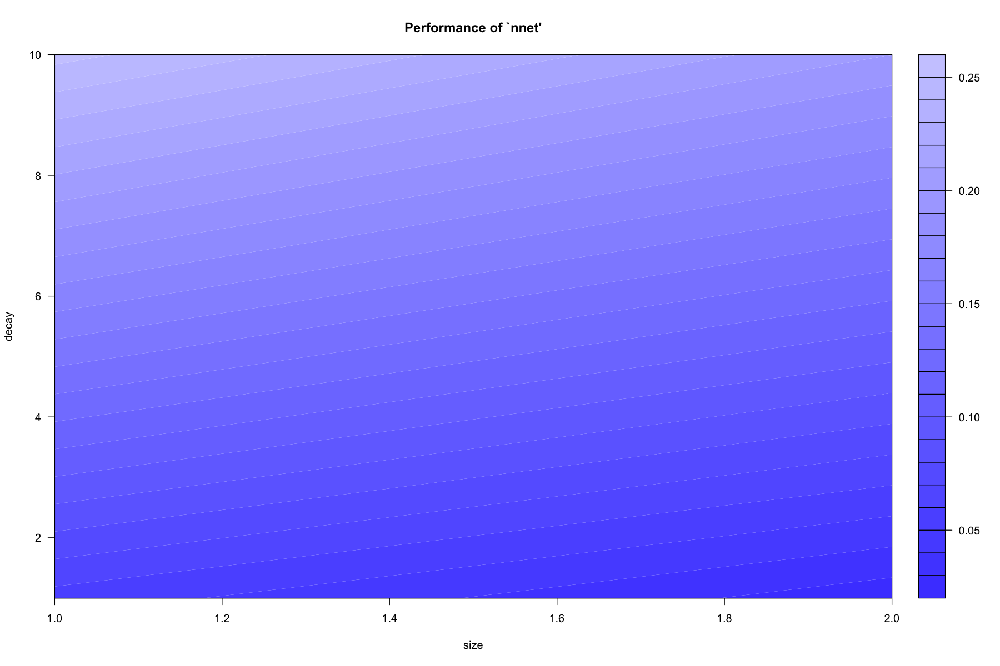

In [120]:
library(e1071)
#there is to much ponderations when I put size=(3,4,5,6) like above
tuning_reg_full<-tune.nnet(co2_Emissions~.,data=train,size=c(1,2),decay=c(10,1),linout=TRUE,maxit=200000)
plot(tuning_reg_full)
cat("hidden_layer_sizes", tuning_reg_full$best.parameters$size, "\n")
cat("earning_rate_init",tuning_reg_full$best.parameters$decay,"\n")

# weights:  423
initial  value 2600.190402 
iter  10 value 1973.919938
iter  20 value 1461.869566
iter  30 value 1279.008785
iter  40 value 1096.169798
iter  50 value 1006.796379
iter  60 value 913.099197
iter  70 value 817.375828
iter  80 value 685.461126
iter  90 value 632.069085
iter 100 value 581.408276
iter 110 value 521.589838
iter 120 value 488.264890
iter 130 value 448.492750
iter 140 value 414.437289
iter 150 value 392.597328
iter 160 value 365.787154
iter 170 value 344.919677
iter 180 value 327.684378
iter 190 value 312.526782
iter 200 value 298.109734
iter 210 value 291.176395
iter 220 value 286.817685
iter 230 value 283.183892
iter 240 value 281.375428
iter 250 value 280.666846
iter 260 value 280.186314
iter 270 value 279.863818
iter 280 value 279.533933
iter 290 value 279.093885
iter 300 value 278.667059
iter 310 value 277.831090
iter 320 value 276.197988
iter 330 value 273.717156
iter 340 value 272.420789
iter 350 value 271.483079
iter 360 value 270.185706
iter 370 value 

a 209-2-1 network with 423 weights
options were - linear output units  decay=1
   b->h1   i1->h1   i2->h1   i3->h1   i4->h1   i5->h1   i6->h1   i7->h1 
    1.65     0.00     0.06    -0.10     0.13    -0.02     0.09     0.00 
  i8->h1   i9->h1  i10->h1  i11->h1  i12->h1  i13->h1  i14->h1  i15->h1 
   -0.37    -0.11     0.17     0.00     0.20     0.09     0.09     0.14 
 i16->h1  i17->h1  i18->h1  i19->h1  i20->h1  i21->h1  i22->h1  i23->h1 
   -0.16    -0.08     0.05     0.00     0.00     0.06     0.08     1.16 
 i24->h1  i25->h1  i26->h1  i27->h1  i28->h1  i29->h1  i30->h1  i31->h1 
    0.00    -0.02    -0.07     0.07    -0.05     0.72     0.00    -0.07 
 i32->h1  i33->h1  i34->h1  i35->h1  i36->h1  i37->h1  i38->h1  i39->h1 
    0.02     0.00    -0.59     0.01     0.12     0.00    -0.17    -0.05 
 i40->h1  i41->h1  i42->h1  i43->h1  i44->h1  i45->h1  i46->h1  i47->h1 
    0.09     0.09     0.00    -0.06     0.08     0.05     0.08    -0.02 
 i48->h1  i49->h1  i50->h1  i51->h1  i52->h1 

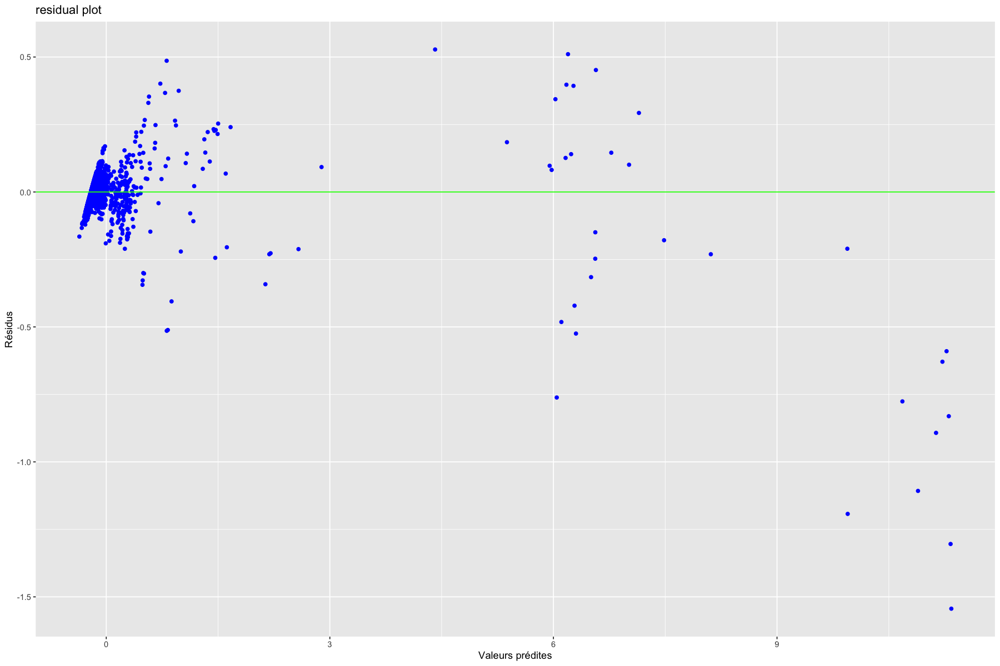

In [121]:
nnet.regparam_full<-nnet(co2_Emissions~.,data=train,size=tuning_reg_full$best.parameters$size,decay=tuning_reg_full$best.parameters$decay,linout=TRUE,maxit=20000)
summary(nnet.regparam_full)
# calcul et graphe des résidus
fit.nnetrparam_full=predict(nnet.regparam_full,data=train)
res.nnetr_full=fit.nnetrparam_full-train[,"co2_Emissions"]
gplot.res(fit.nnetrparam_full,res.nnetr_full,titre="residual plot")

In [122]:
pred.nnetr_full=predict(nnet.regparam_full,newdata=test)
sum((pred.nnetr_full-test[,"co2_Emissions"])^2)/nrow(test)
r_squared<-R2(test[,"co2_Emissions"],pred.nnetr_full)
print("r² :")
print(r_squared)

[1] 0.007545276

[1] "r² :"
[1] 0.9881289


### 7.3 - Prediction using PCA data + Dummies

# weights:  640
initial  value 3895.195573 
iter  10 value 1965.271207
iter  20 value 1674.791240
iter  30 value 1514.807855
iter  40 value 1228.721167
iter  50 value 1093.415653
iter  60 value 992.067428
iter  70 value 910.092221
iter  80 value 871.467862
iter  90 value 833.993999
iter 100 value 814.830410
iter 110 value 797.334412
iter 120 value 778.438121
iter 130 value 764.087304
iter 140 value 755.490247
iter 150 value 748.939845
iter 160 value 739.256580
iter 170 value 728.239046
iter 180 value 717.345621
iter 190 value 711.157726
iter 200 value 705.000566
iter 210 value 696.193806
iter 220 value 690.110220
iter 230 value 685.486087
iter 240 value 682.849389
iter 250 value 681.368241
iter 260 value 680.978709
iter 270 value 680.787855
iter 280 value 680.683984
iter 290 value 680.595814
iter 300 value 680.527231
iter 310 value 680.475622
iter 320 value 680.446278
iter 330 value 680.418177
iter 340 value 680.381999
iter 350 value 680.350842
iter 360 value 680.285191
iter 370 value 

a 211-3-1 network with 640 weights
options were - linear output units  decay=10
   b->h1   i1->h1   i2->h1   i3->h1   i4->h1   i5->h1   i6->h1   i7->h1 
    1.04    -0.09    -0.29    -0.02     0.05    -0.01    -0.03     0.05 
  i8->h1   i9->h1  i10->h1  i11->h1  i12->h1  i13->h1  i14->h1  i15->h1 
    0.06    -0.12     0.05     0.29     0.02     0.03     0.07     0.05 
 i16->h1  i17->h1  i18->h1  i19->h1  i20->h1  i21->h1  i22->h1  i23->h1 
    0.05     0.05     0.05     0.05     0.05     0.05     0.05     0.05 
 i24->h1  i25->h1  i26->h1  i27->h1  i28->h1  i29->h1  i30->h1  i31->h1 
    0.05     0.05     0.05     0.05     0.05     0.05     0.06     0.05 
 i32->h1  i33->h1  i34->h1  i35->h1  i36->h1  i37->h1  i38->h1  i39->h1 
    0.06     0.06     0.06     0.00     0.03     0.00    -0.03    -0.05 
 i40->h1  i41->h1  i42->h1  i43->h1  i44->h1  i45->h1  i46->h1  i47->h1 
    0.01    -0.02     0.00     0.00    -0.06     0.00     0.02     0.00 
 i48->h1  i49->h1  i50->h1  i51->h1  i52->h1

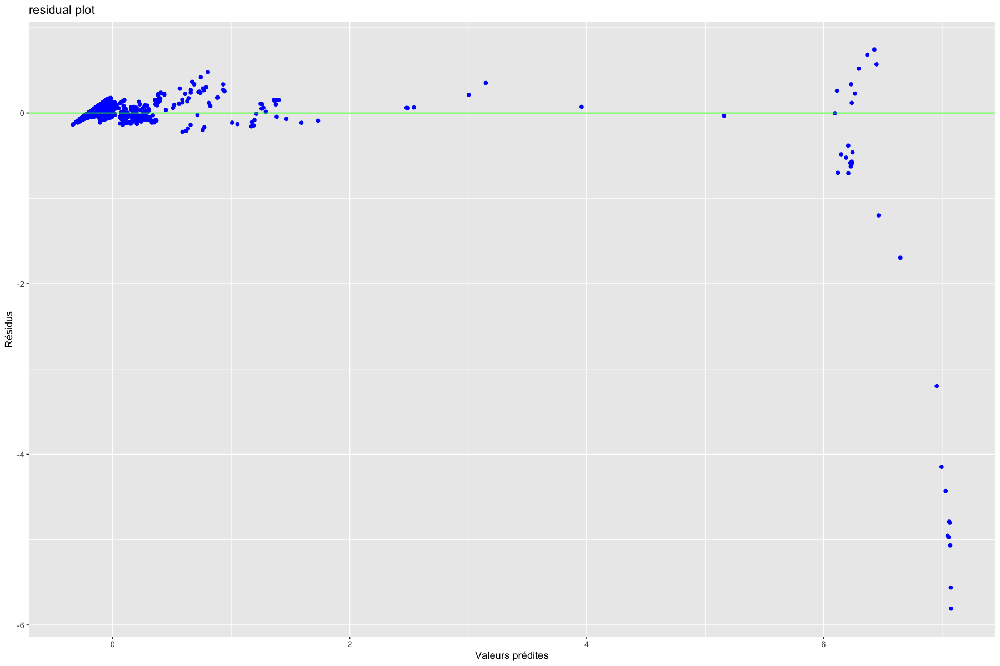

In [123]:
library(nnet)
# apprentissage
nnet.reg_P=nnet(co2_Emissions ~ ., data = X_train_P,size=3,decay=10,linout=TRUE,maxit=10000)
summary(nnet.reg_P)
# calcul et graphe des résidus
fit.nnetr_P=predict(nnet.reg_P,data=train)
res.nnetr_P=fit.nnetr_P-train[,"co2_Emissions"]
gplot.res(fit.nnetr_P,res.nnetr_P,titre="residual plot")

In [127]:
tuning_reg_P<-tune.nnet(co2_Emissions~.,data=X_train_P,size=c(1,2),decay=c(10,1),linout=TRUE,maxit=200000)
plot(tuning_reg_P)
cat("hidden_layer_sizes", tuning_reg_P$best.parameters$size, "\n")
cat("earning_rate_init",tuning_reg_P$best.parameters$decay,"\n")

In [126]:
nnet.regparam_P<-nnet(co2_Emissions~.,data=X_train_P,size=tuning_reg_P$best.parameters$size,decay=tuning_reg_P$best.parameters$decay,linout=TRUE,maxit=20000)
summary(nnet.regparam_P)
# calcul et graphe des résidus
fit.nnetrparam_P=predict(nnet.regparam_P,data=X_train_P)
res.nnetr_P=fit.nnetrparam_P-X_train_P[,"co2_Emissions"]
gplot.res(fit.nnetrparam_P,res.nnetr_P,titre="residual plot")

ERROR: Error in nnet.default(x, y, w, ...): objet 'tuning_reg_P' introuvable


In [ ]:
pred.nnetr_P=predict(nnet.regparam_P,newdata=X_test_P)
sum((pred.nnetr_P-X_test_P[,"co2_Emissions"])^2)/nrow(X_test_P)
r_squared<-R2(X_test_P[,"co2_Emissions"],pred.nnetr_P)
cat("r² :",r_squared,"\n")

# 8 - Results Comparison

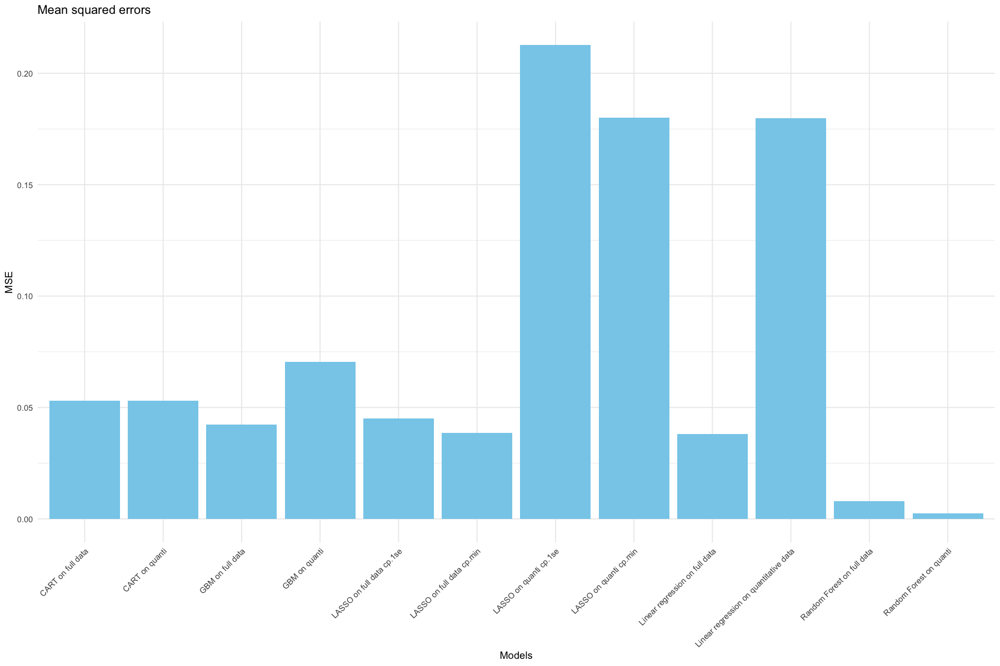

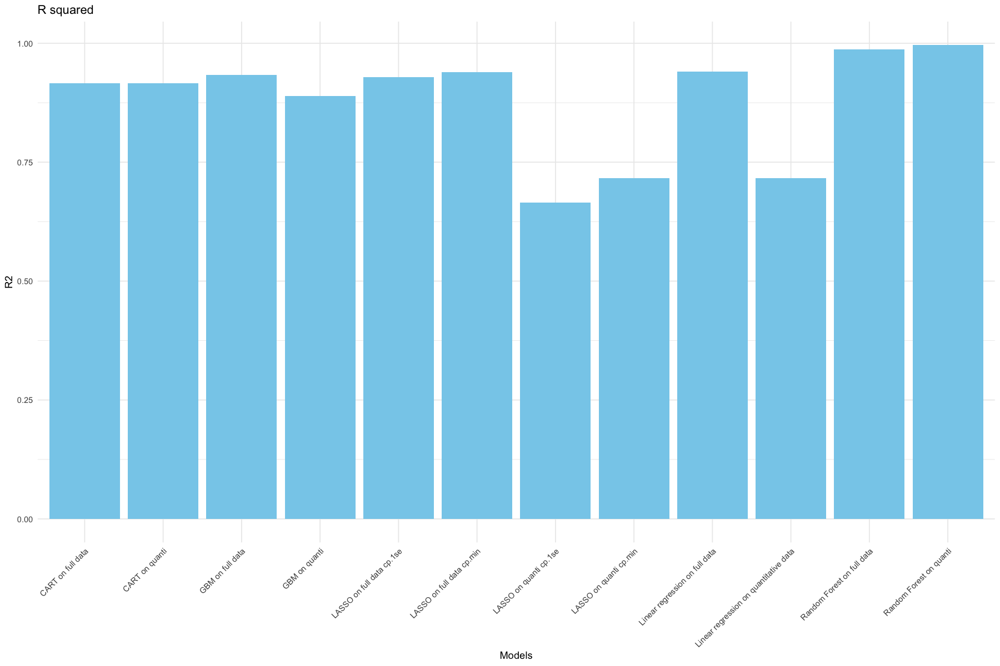

In [128]:
ggplot(results_df, aes(x = Model, y = Mean_squarred_error)) +
  geom_bar(stat = "identity", fill = "skyblue") +
  labs(title = "Mean squared errors", x = "Models", y = "MSE") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotation des étiquettes de l'axe x

ggplot(results_df, aes(x = Model, y = R_squarred)) +
  geom_bar(stat = "identity", fill = "skyblue") +
  labs(title = "R squared", x = "Models", y = "R2") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotation des étiquettes de l'axe x

# 9 - Handling missing data

### 9.1 - Imputing missing data with Missforest algorithm

### 9.2 - Dataset constitution

# 10 - Testing Random Forest, Adaboost, SVR, Neural Networks algorithms on the completed dataset